In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

# Dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Main Work/Hindi Language/hindi language - train.csv')

In [ ]:
df.isnull().sum()

,0
sentence,2
label,516
Unnamed: 2,89825


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
import re
import time
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import roc_auc_score, balanced_accuracy_score
from imblearn.metrics import geometric_mean_score
from sklearn.metrics import precision_score
import re
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt


In [ ]:
import numpy as np

In [ ]:
from sklearn.preprocessing import LabelEncoder
le_x= LabelEncoder()

In [ ]:
df = df.drop('Unnamed: 2', axis=1)

In [ ]:
df.isnull().sum()

,0
sentence,2
label,516


In [ ]:
df.dropna(inplace=True)

In [ ]:
df['label'].value_counts()

,count
label,
MAG,19753
BRA,19535
HIN,19380
BHO,18820
AWA,12288


In [ ]:
df.shape

(89776, 2)

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.shape

(89569, 2)

In [ ]:
df['label'].value_counts()

,count
label,
MAG,19714
BRA,19535
HIN,19300
BHO,18736
AWA,12284


In [ ]:
df['label'].value_counts()

,count
label,
MAG,19714
BRA,19535
HIN,19300
BHO,18736
AWA,12284


In [ ]:
df.isnull().sum()

,0
sentence,0
label,0


In [ ]:
df['label'] = le_x.fit_transform(df.label)

In [ ]:
label_mapping = dict(zip(le_x.classes_, le_x.transform(le_x.classes_)))
print(label_mapping)

{'AWA': 0, 'BHO': 1, 'BRA': 2, 'HIN': 3, 'MAG': 4}


In [ ]:
df.head(20)

,sentence,label
0,तभी बारिश हुई थी जिसका गीलापन इन मूर्तियों को ...,3
1,कहते हुए लफ्ज़ बेसुध करते गए कुछ इस तरह /कि इत...,3
2,चिट्ठी में ऊ हमरा के होली पर बोलवले रहली.,1
3,अब इंग्लैण्ड वाले भी जान गए साथ ही हैरान और पर...,3
4,ज्ञान गुण गावन को कलाविक सावन को ।,2
5,हमरे ध्यान मां सती मइया केरी छवि उभरी ।,0
6,बूंदा-बांदी अब थमिगै रहै ।,0
7,कबीर त पुरा क पुरा भारतीय लोक जीवन मे रचल बसल ...,1
8,एक तरफ एक के बाद नै पीढ़ी के एंटी -बायोटिक्स आ...,3
9,ठंडयाई करसियान में भरि भरि कें छेदन में है कें...,2


# Data Preprocessing

In [ ]:
punctuation_chars = "?,।!;:"

def remove_punctuation(text):
    if isinstance(text, str):
        return ''.join(char for char in text if char not in punctuation_chars)
    elif isinstance(text, float):  # Handle floats by converting to string
        return ''.join(char for char in str(text) if char not in punctuation_chars)
    else:
        return text

df['sentence'] = df['sentence'].apply(remove_punctuation)


In [ ]:
import re
df['sentence'] = df['sentence'].apply(lambda x: re.sub(r"[^\w\s]", "", x))


In [ ]:
df['sentence'] = df['sentence'].apply(lambda x: " ".join(x.split()))


In [ ]:
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(df['sentence'])
y = df['label']


In [ ]:
labels = list(label_mapping.keys())

In [ ]:
labels

['AWA', 'BHO', 'BRA', 'HIN', 'MAG']

# **Plot**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-28-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-28-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


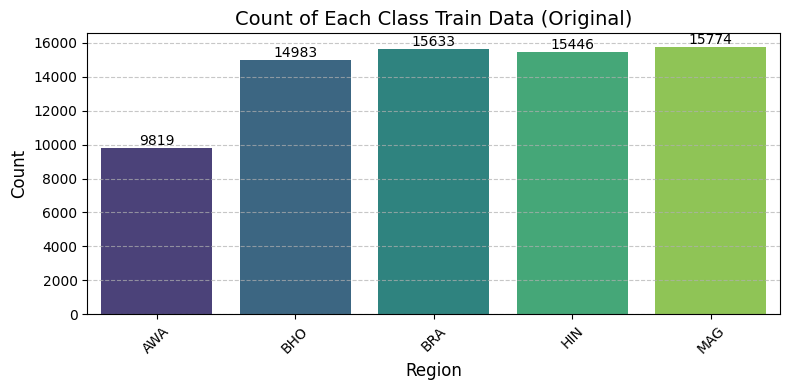

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data (Original)")

# ML Models

## Multinomial NB- 86.25%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8605001674667857
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.73      0.80      2465
           1       0.88      0.85      0.87      3753
           2       0.85      0.86      0.86      3902
           3       0.82      0.90      0.86      3854
           4       0.89      0.92      0.90      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.85      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.07 seconds
Accuracy: 0.8605001674667857
Precision: 0.8616
Recall for : 0.8605
F1 Score:  0.8597
AUC Score: 0.9794
Balanced Accuracy: 0.8509
G-mean Score: 0.9105
pf Score: 0.0352
Bal Score :  0.8982604958763946


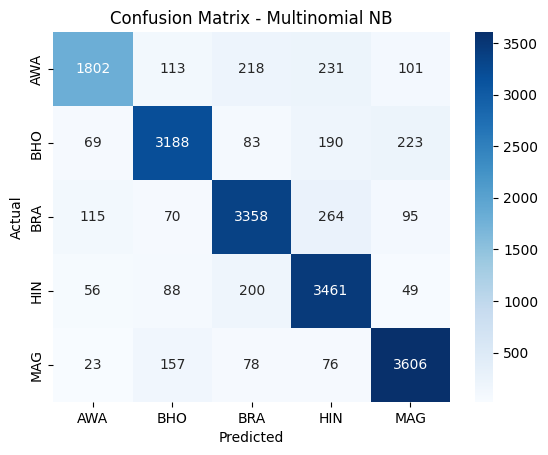

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -76.70%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7669978787540471
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.66      0.65      2465
           1       0.81      0.78      0.79      3753
           2       0.73      0.77      0.75      3902
           3       0.75      0.77      0.76      3854
           4       0.86      0.82      0.84      3940

    accuracy                           0.77     17914
   macro avg       0.76      0.76      0.76     17914
weighted avg       0.77      0.77      0.77     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 33.02 seconds
Accuracy: 0.7669978787540471
Precision: 0.7688
Recall for : 0.7670
F1 Score:  0.7676
AUC Score: 0.9349
Balanced Accuracy: 0.7589
G-mean Score: 0.8498
pf Score: 0.0583
Bal Score :  0.8301636162771691


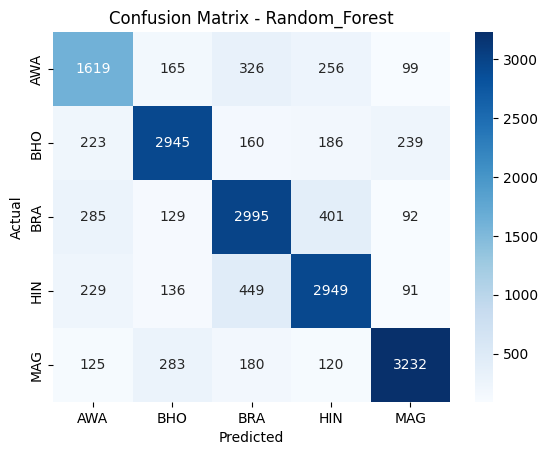

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 79.09%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7908898068549738
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.66      0.71      2465
           1       0.88      0.77      0.82      3753
           2       0.67      0.83      0.74      3902
           3       0.78      0.81      0.80      3854
           4       0.90      0.83      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.80      0.78      0.79     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 285.75 seconds
Accuracy: 0.7908898068549738
Precision: 0.8013
Recall for : 0.7909
F1 Score:  0.7924
AUC Score: 0.9600
Balanced Accuracy: 0.7809
G-mean Score: 0.8647
pf Score: 0.0527
Bal Score :  0.8475079395079819


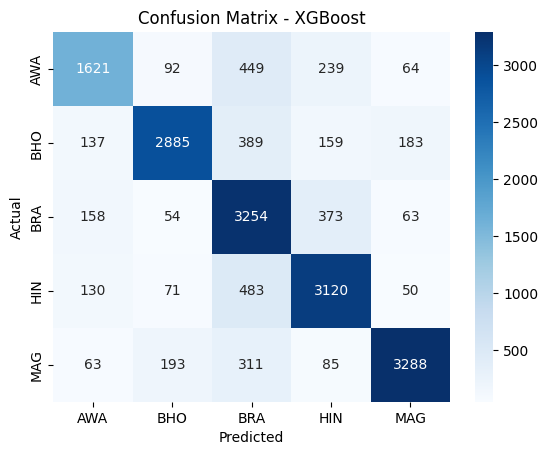

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 70.47%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7047002344535
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.55      0.56      2465
           1       0.74      0.75      0.74      3753
           2       0.68      0.69      0.69      3902
           3       0.68      0.70      0.69      3854
           4       0.80      0.79      0.79      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.69      0.69     17914
weighted avg       0.70      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 48.82 seconds
Accuracy: 0.7047002344535
Precision: 0.7047
Recall for : 0.7047
F1 Score:  0.7046
AUC Score: 0.8185
Balanced Accuracy: 0.6934
G-mean Score: 0.8076
pf Score: 0.0740
Bal Score :  0.7847429615113987


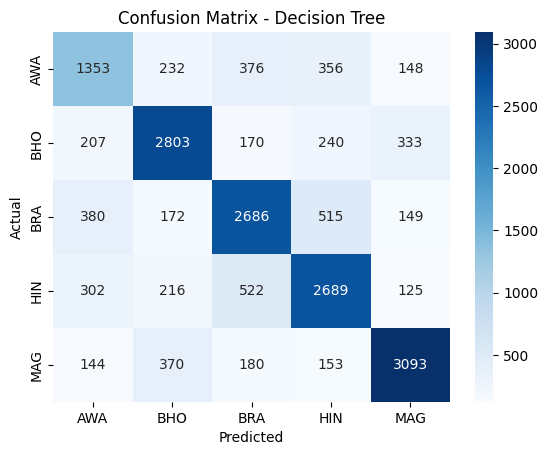

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 21.51%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.2150831751702579
Classification Report:
               precision    recall  f1-score   support

           0       0.16      0.56      0.25      2465
           1       0.24      0.53      0.33      3753
           2       0.51      0.09      0.15      3902
           3       0.62      0.01      0.02      3854
           4       0.80      0.03      0.05      3940

    accuracy                           0.22     17914
   macro avg       0.47      0.24      0.16     17914
weighted avg       0.49      0.22      0.15     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.2150831751702579
Precision: 0.4930
Recall for : 0.2151
F1 Score:  0.1514
AUC Score: 0.5987
Balanced Accuracy: 0.2429
G-mean Score: 0.4237
pf Score: 0.1901
Bal Score :  0.42893851774338454


## LightGBM Model -82.06%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 6.415408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168214
[LightGBM] [Info] Number of data points in the train set: 71655, number of used features: 4154
[LightGBM] [Info] Start training from score -1.987544
[LightGBM] [Info] Start training from score -1.564947
[LightGBM] [Info] Start training from score -1.522479
[LightGBM] [Info] Start training from score -1.534513
[LightGBM] [Info] Start training from score -1.513500


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.820643072457296
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.72      0.74      2465
           1       0.87      0.81      0.84      3753
           2       0.75      0.84      0.79      3902
           3       0.80      0.84      0.82      3854
           4       0.91      0.86      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.82      0.81      0.82     17914
weighted avg       0.82      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 127.71 seconds
Accuracy: 0.820643072457296
Precision: 0.8240
Recall for : 0.8206
F1 Score:  0.8211
AUC Score: 0.9701
Balanced Accuracy: 0.8129
G-mean Score: 0.8848
pf Score: 0.0451
Bal Score :  0.8692298254423076


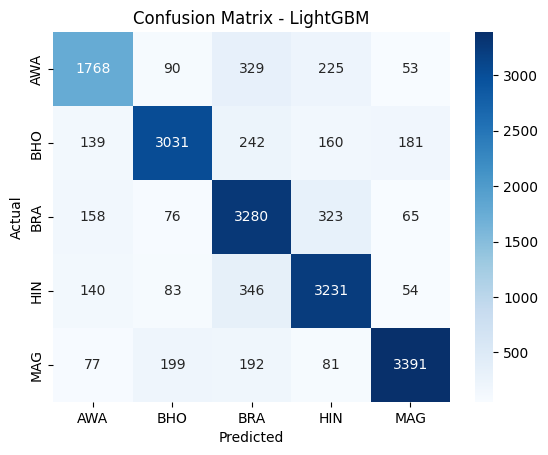

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 86.28%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.862844702467344
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.77      0.80      2465
           1       0.88      0.86      0.87      3753
           2       0.83      0.87      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.92      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 12.85 seconds
Accuracy: 0.862844702467344
Precision: 0.8635
Recall for : 0.8628
F1 Score:  0.8628
AUC Score: 0.9785
Balanced Accuracy: 0.8559
G-mean Score: 0.9124
pf Score: 0.0345
Bal Score :  0.8999997035160643


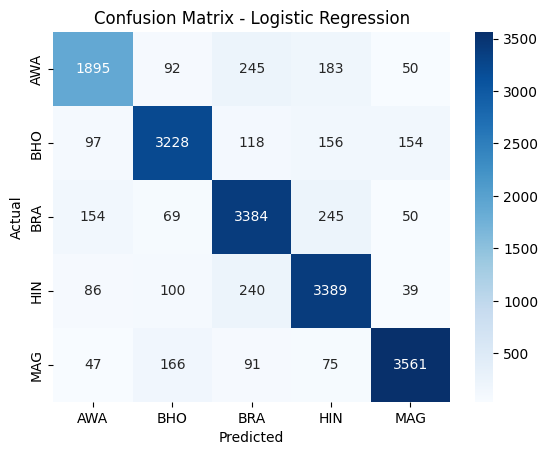

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.65%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.856536786870604
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.84      0.79      2465
           1       0.93      0.79      0.86      3753
           2       0.83      0.87      0.85      3902
           3       0.90      0.84      0.87      3854
           4       0.87      0.93      0.90      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.11 seconds
Accuracy: 0.856536786870604
Precision: 0.8613
Recall for : 0.8565
F1 Score:  0.8569
AUC Score: 0.9808
Balanced Accuracy: 0.8544
G-mean Score: 0.9091
pf Score: 0.0357
Bal Score :  0.8954614844838764


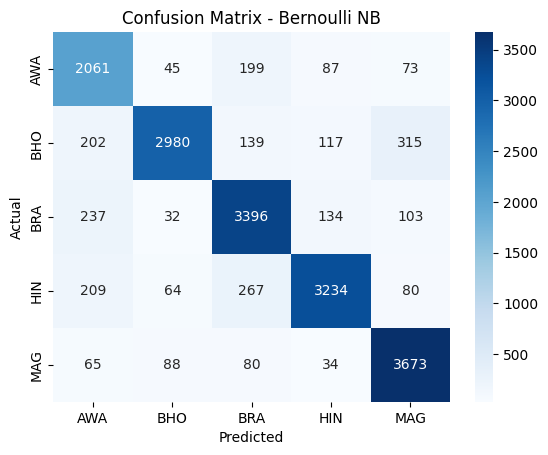

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

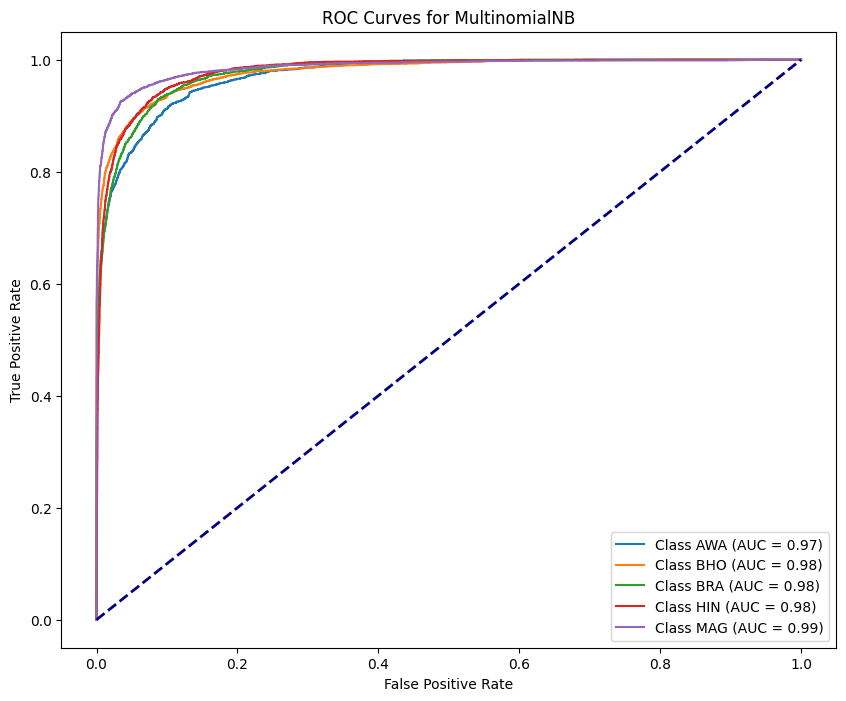

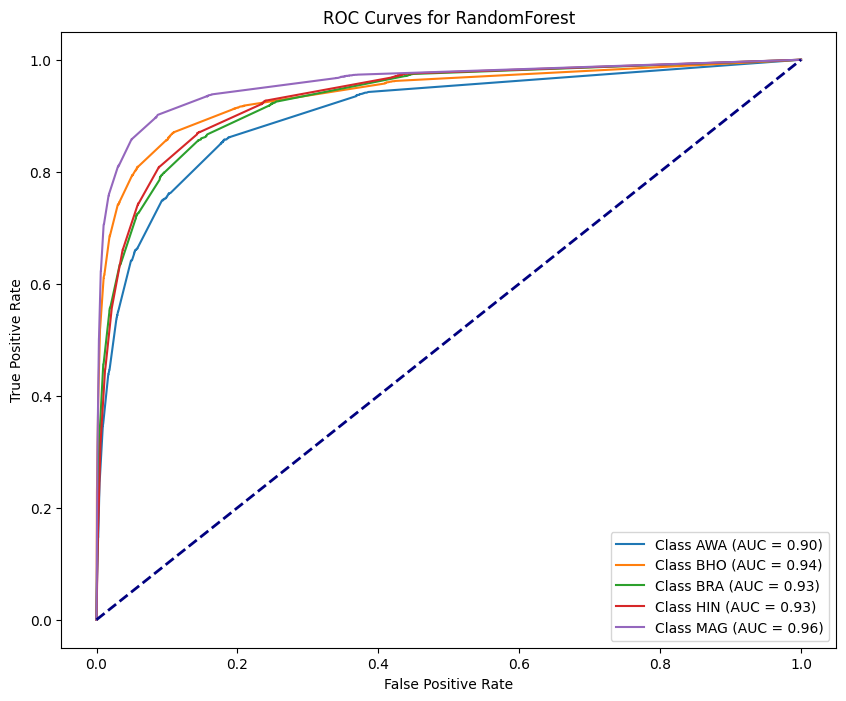

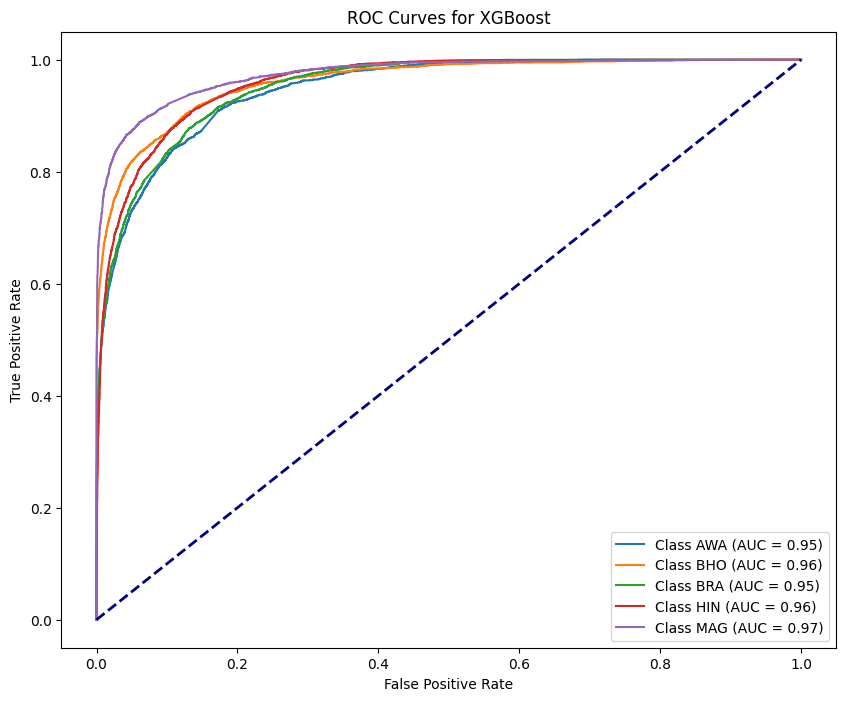

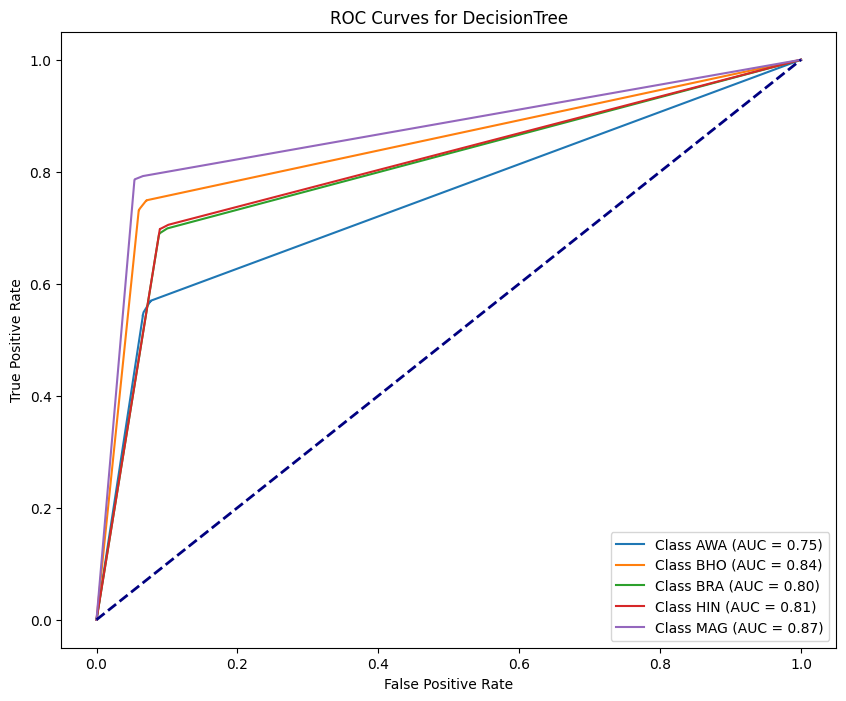

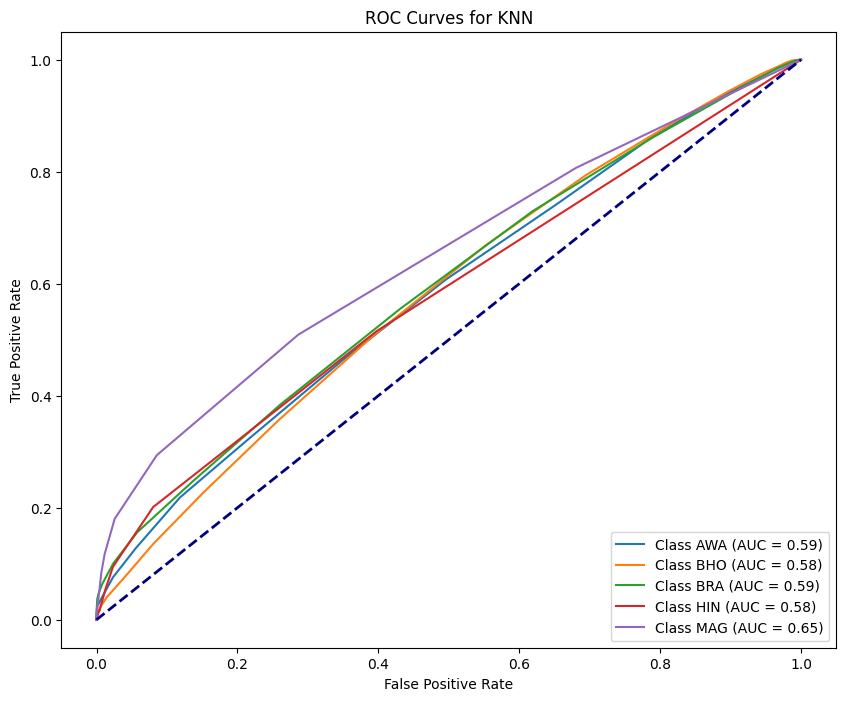

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


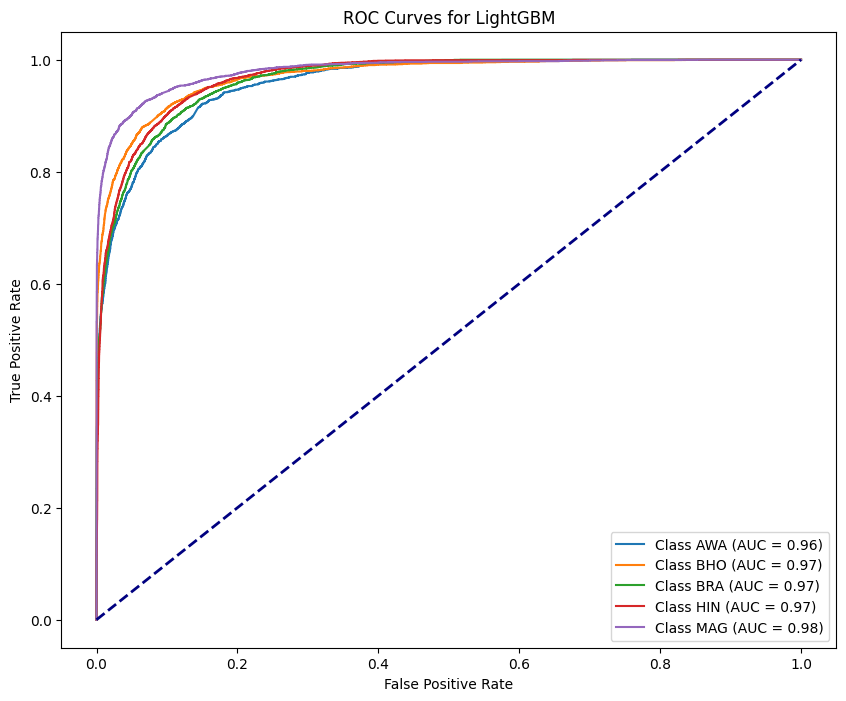

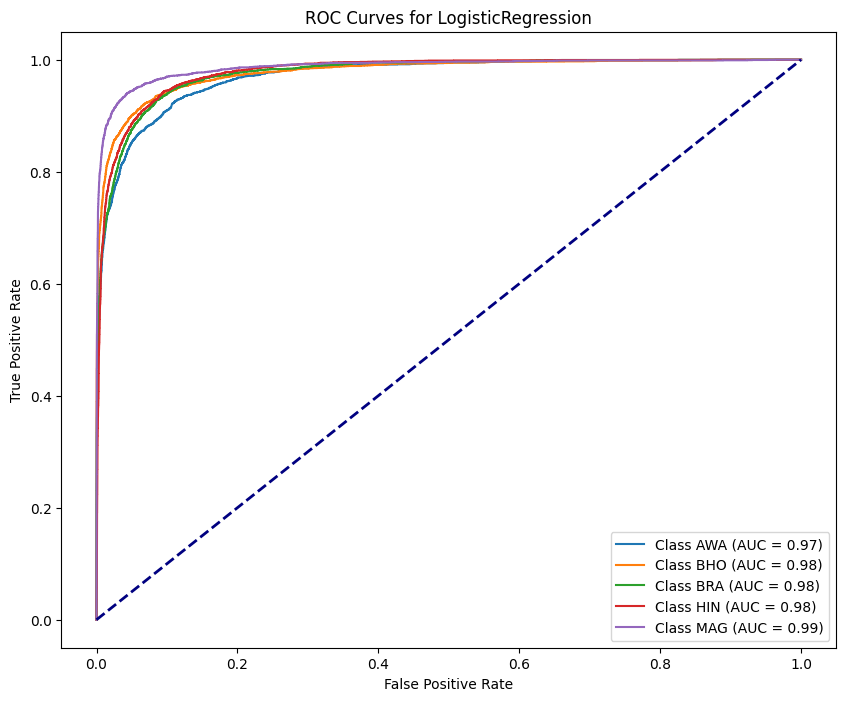

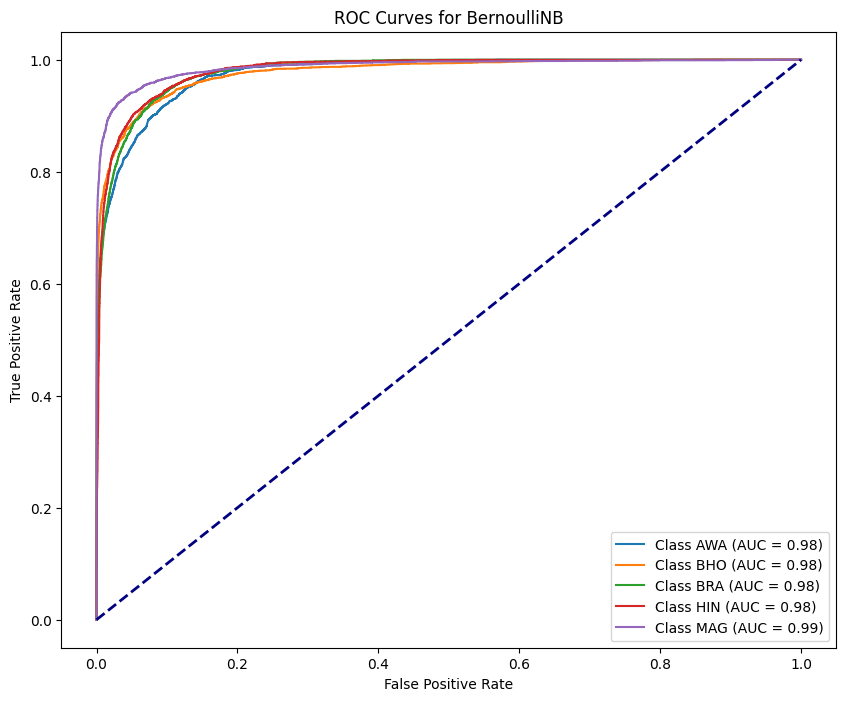

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


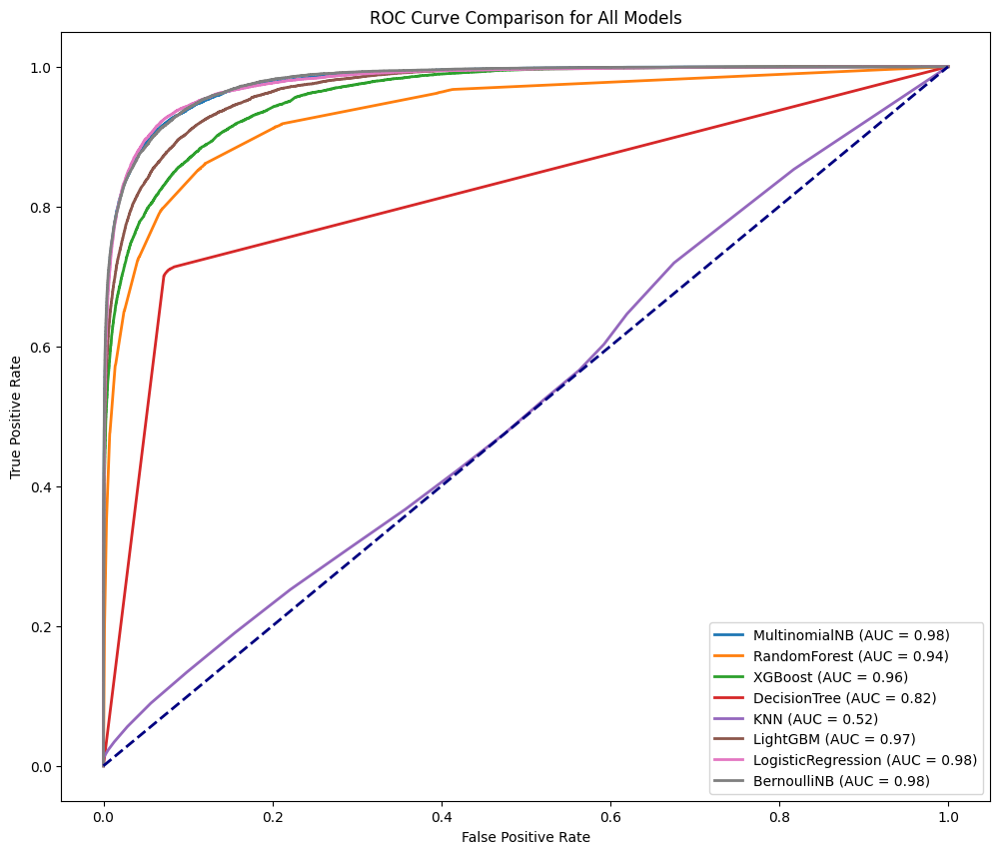

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

In [ ]:
X_train_a, X_test, y_train_a, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#**SMOTE**

In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=1)
X_train, y_train = smote.fit_resample(X_train_a,y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-77-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-77-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


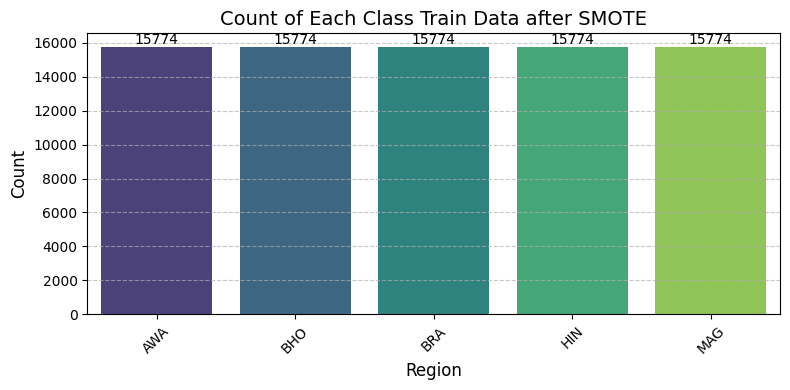

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTE")

## Multinomial NB- 86.10%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8610025678240483
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.83      0.79      2465
           1       0.89      0.84      0.87      3753
           2       0.87      0.83      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.91      0.91      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.05 seconds
Accuracy: 0.8610025678240483
Precision: 0.8632
Recall for : 0.8610
F1 Score:  0.8615
AUC Score: 0.9794
Balanced Accuracy: 0.8586
G-mean Score: 0.9120
pf Score: 0.0346
Bal Score :  0.8987161161782717


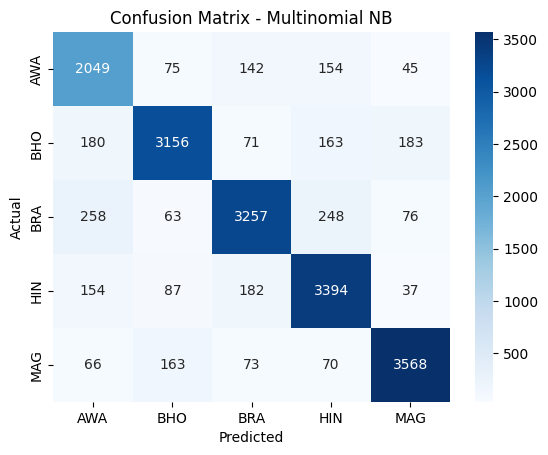

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -78.75%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7875404711398906
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.74      0.68      2465
           1       0.85      0.79      0.82      3753
           2       0.78      0.76      0.77      3902
           3       0.77      0.79      0.78      3854
           4       0.88      0.84      0.86      3940

    accuracy                           0.79     17914
   macro avg       0.78      0.78      0.78     17914
weighted avg       0.79      0.79      0.79     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 234.14 seconds
Accuracy: 0.7875404711398906
Precision: 0.7933
Recall for : 0.7875
F1 Score:  0.7894
AUC Score: 0.9535
Balanced Accuracy: 0.7840
G-mean Score: 0.8643
pf Score: 0.0528
Bal Score :  0.8451999480560718


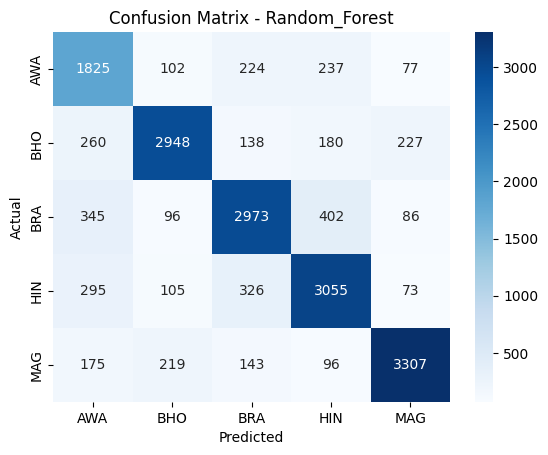

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.78%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7878195824494808
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.75      0.69      2465
           1       0.88      0.76      0.81      3753
           2       0.70      0.80      0.75      3902
           3       0.80      0.79      0.80      3854
           4       0.91      0.82      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.78      0.78     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 161.65 seconds
Accuracy: 0.7878195824494808
Precision: 0.7987
Recall for : 0.7878
F1 Score:  0.7906
AUC Score: 0.9596
Balanced Accuracy: 0.7845
G-mean Score: 0.8642
pf Score: 0.0528
Bal Score :  0.8453829673637141


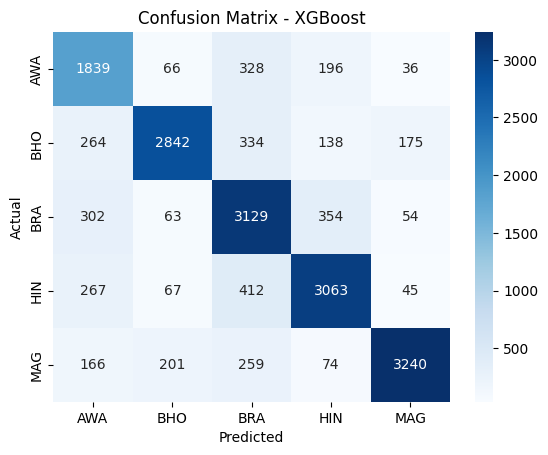

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 70.25%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7024673439767779
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.60      0.57      2465
           1       0.76      0.73      0.74      3753
           2       0.68      0.67      0.68      3902
           3       0.68      0.69      0.69      3854
           4       0.81      0.78      0.80      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.70      0.69     17914
weighted avg       0.71      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 33.38 seconds
Accuracy: 0.7024673439767779
Precision: 0.7062
Recall for : 0.7025
F1 Score:  0.7040
AUC Score: 0.8176
Balanced Accuracy: 0.6950
G-mean Score: 0.8067
pf Score: 0.0742
Bal Score :  0.7831644713100352


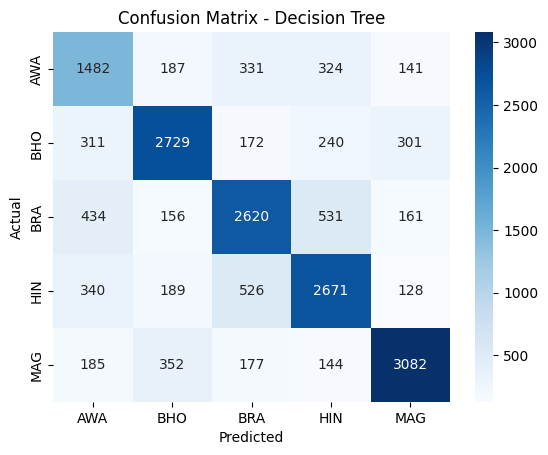

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 17.00%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.17003460980238919
Classification Report:
               precision    recall  f1-score   support

           0       0.14      0.99      0.25      2465
           1       0.82      0.11      0.19      3753
           2       0.92      0.03      0.06      3902
           3       0.72      0.01      0.01      3854
           4       0.85      0.01      0.02      3940

    accuracy                           0.17     17914
   macro avg       0.69      0.23      0.11     17914
weighted avg       0.73      0.17      0.09     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.17003460980238919
Precision: 0.7336
Recall for : 0.1700
F1 Score:  0.0947
AUC Score: 0.7573
Balanced Accuracy: 0.2302
G-mean Score: 0.3839
pf Score: 0.1926
Bal Score :  0.3975279926201246


## LightGBM Model -81.93%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 5.527720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 181180
[LightGBM] [Info] Number of data points in the train set: 78870, number of used features: 4364
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8193033381712627
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.77      0.73      2465
           1       0.88      0.80      0.84      3753
           2       0.77      0.82      0.79      3902
           3       0.81      0.83      0.82      3854
           4       0.91      0.85      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.81      0.82      0.81     17914
weighted avg       0.82      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 78.35 seconds
Accuracy: 0.8193033381712627
Precision: 0.8240
Recall for : 0.8193
F1 Score:  0.8207
AUC Score: 0.9699
Balanced Accuracy: 0.8157
G-mean Score: 0.8848
pf Score: 0.0450
Bal Score :  0.8683222265815835


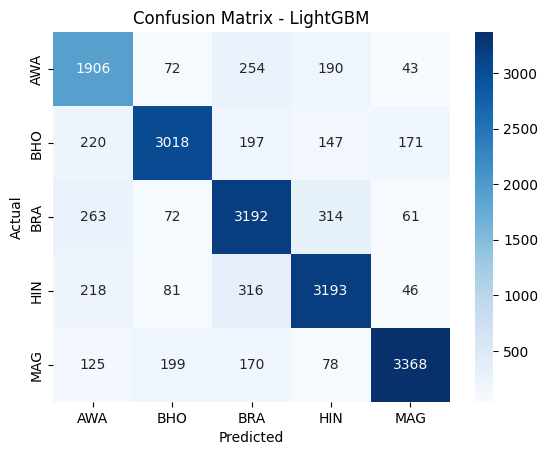

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 85.83%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8583230992519817
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.83      0.77      2465
           1       0.89      0.85      0.87      3753
           2       0.86      0.84      0.85      3902
           3       0.85      0.87      0.86      3854
           4       0.94      0.89      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 9.74 seconds
Accuracy: 0.8583230992519817
Precision: 0.8619
Recall for : 0.8583
F1 Score:  0.8594
AUC Score: 0.9781
Balanced Accuracy: 0.8561
G-mean Score: 0.9106
pf Score: 0.0351
Bal Score :  0.8967854534025581


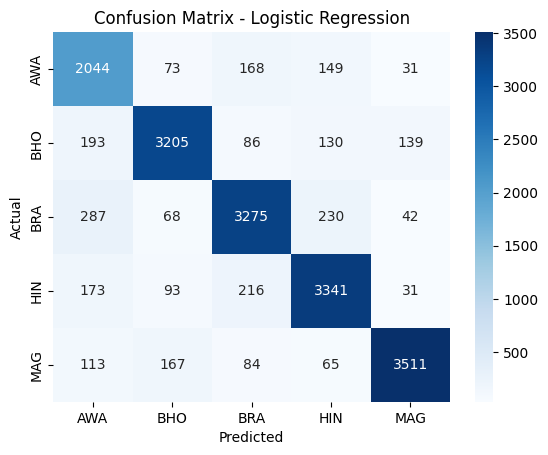

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.31%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8530758066316847
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.87      0.77      2465
           1       0.93      0.79      0.86      3753
           2       0.85      0.85      0.85      3902
           3       0.90      0.83      0.86      3854
           4       0.88      0.93      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.85     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.05 seconds
Accuracy: 0.8530758066316847
Precision: 0.8625
Recall for : 0.8531
F1 Score:  0.8546
AUC Score: 0.9806
Balanced Accuracy: 0.8539
G-mean Score: 0.9077
pf Score: 0.0362
Bal Score :  0.8930003484080887


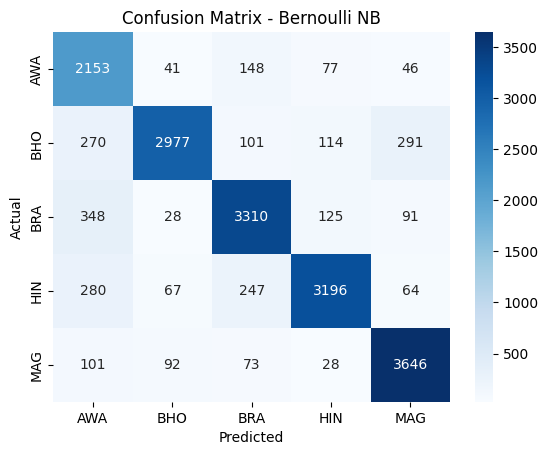

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

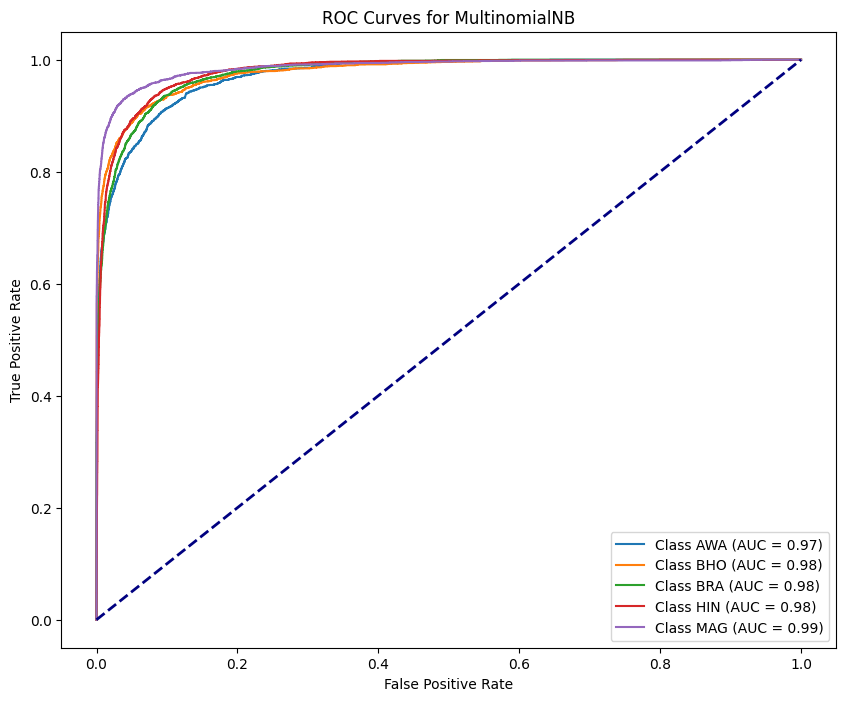

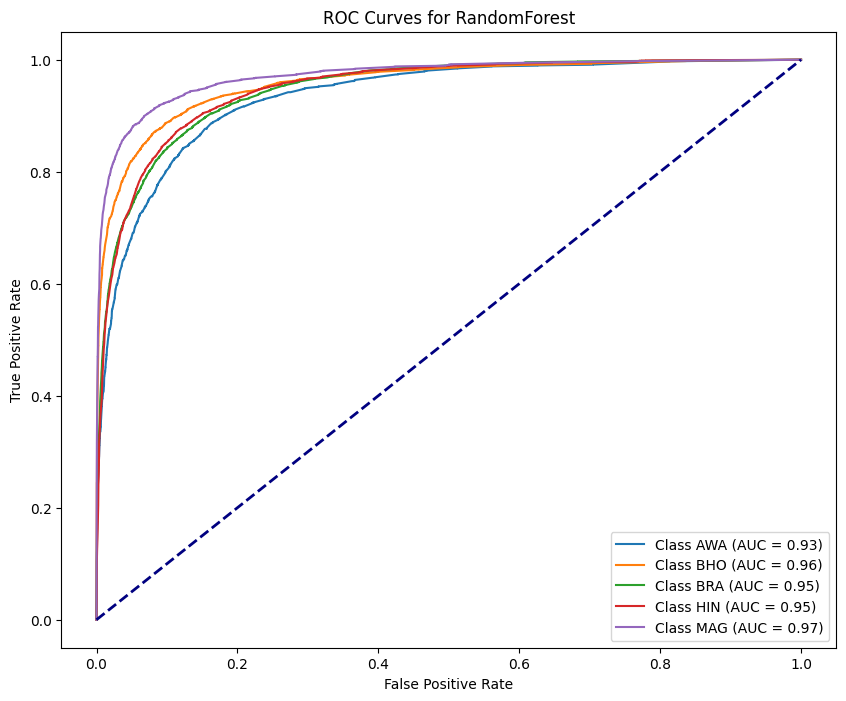

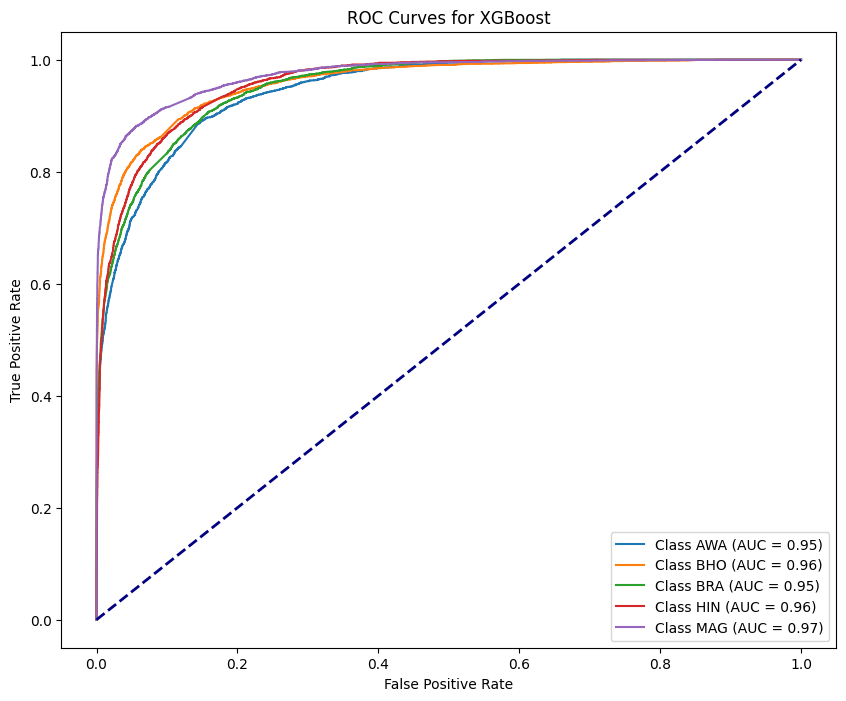

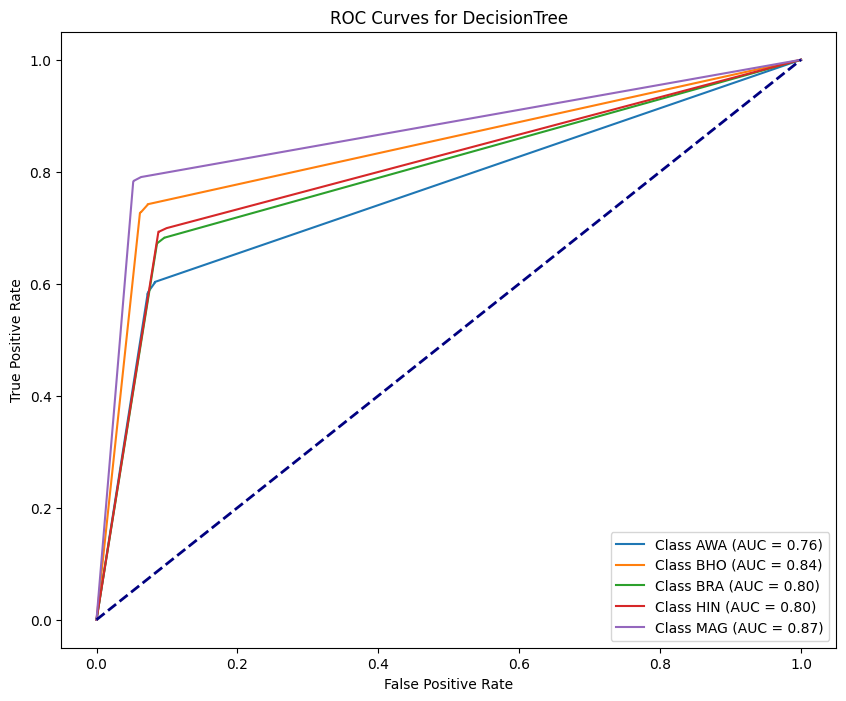

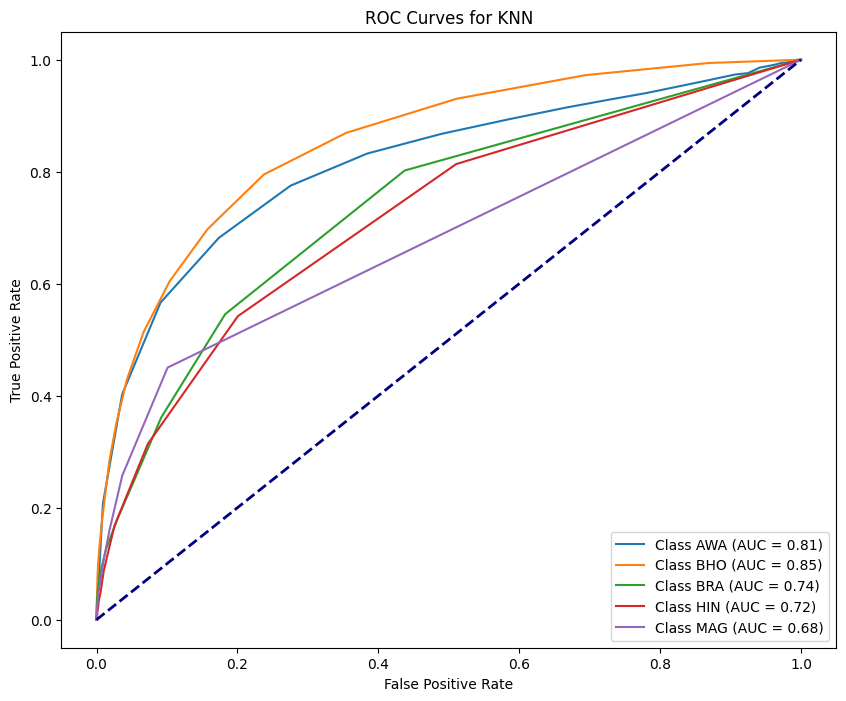

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


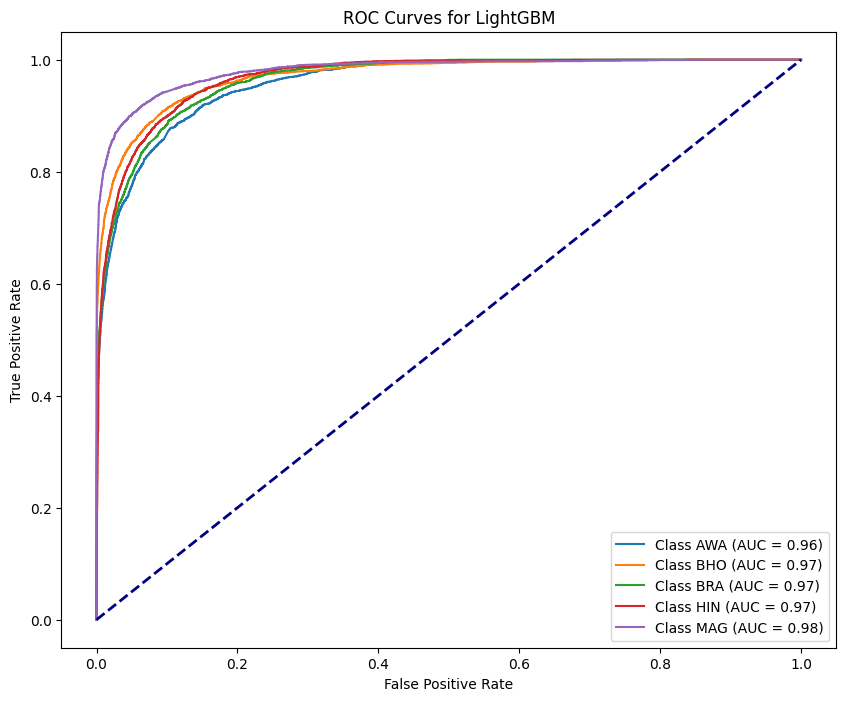

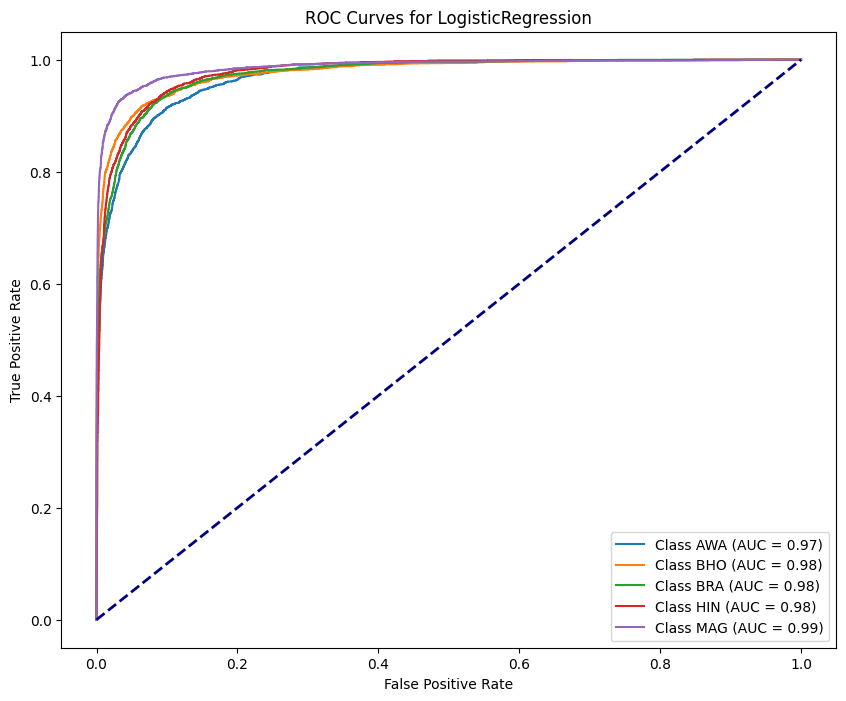

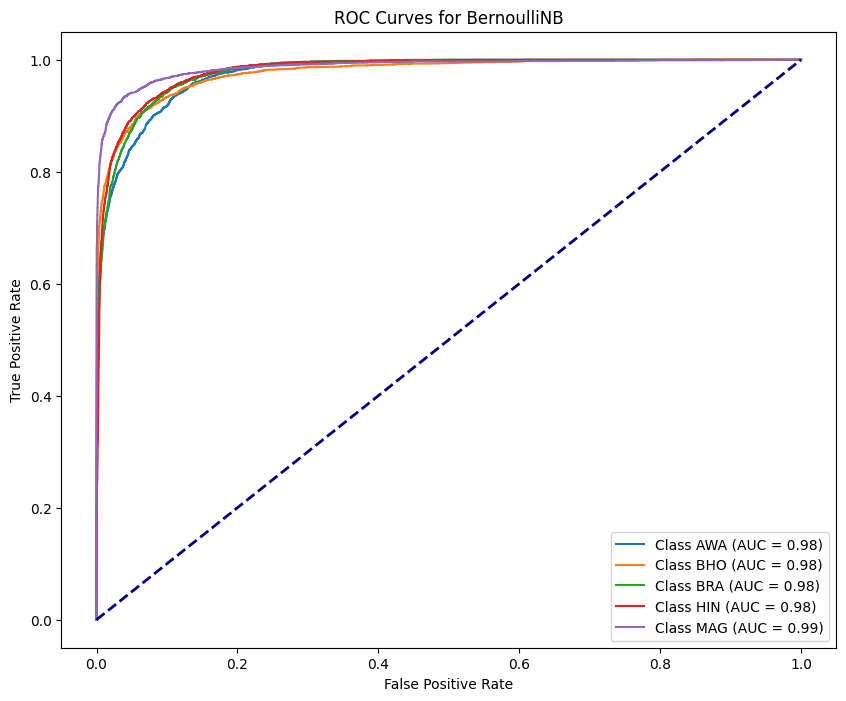

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


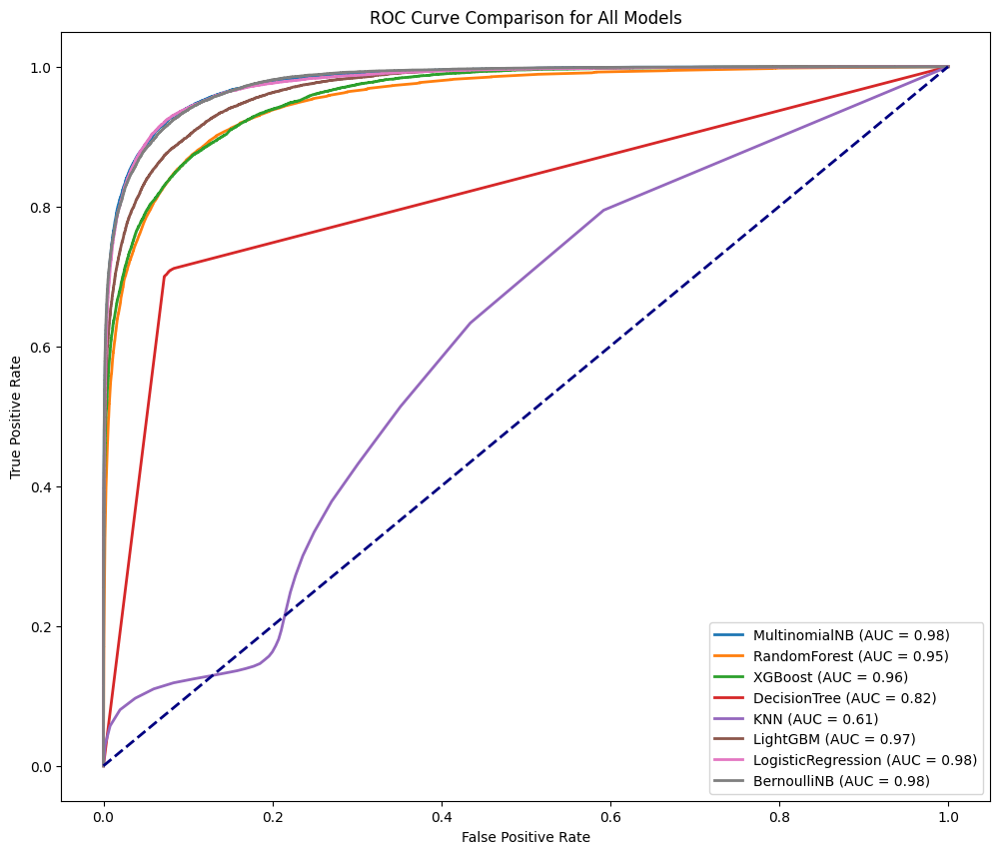

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ROS**

In [ ]:
from imblearn.over_sampling import RandomOverSampler

In [ ]:
rose = RandomOverSampler(random_state=42)
X_train, y_train = rose.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-126-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-126-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


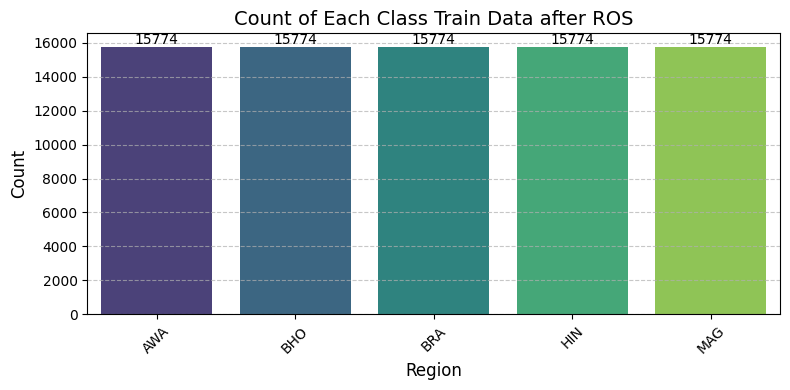

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ROS")

## Multinomial NB- 86.12%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8611700346098023
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.83      0.79      2465
           1       0.89      0.84      0.87      3753
           2       0.87      0.84      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.91      0.91      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.04 seconds
Accuracy: 0.8611700346098023
Precision: 0.8634
Recall for : 0.8612
F1 Score:  0.8617
AUC Score: 0.9794
Balanced Accuracy: 0.8588
G-mean Score: 0.9121
pf Score: 0.0345
Bal Score :  0.8988392026186984


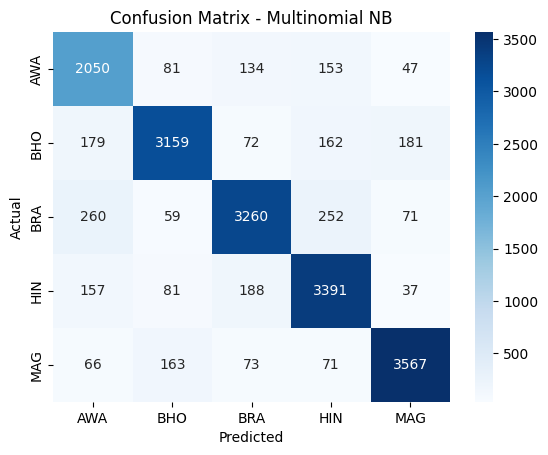

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -79.11%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.791113095902646
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.72      0.69      2465
           1       0.85      0.79      0.82      3753
           2       0.78      0.77      0.77      3902
           3       0.76      0.81      0.78      3854
           4       0.88      0.85      0.86      3940

    accuracy                           0.79     17914
   macro avg       0.78      0.79      0.78     17914
weighted avg       0.79      0.79      0.79     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 226.79 seconds
Accuracy: 0.791113095902646
Precision: 0.7945
Recall for : 0.7911
F1 Score:  0.7922
AUC Score: 0.9543
Balanced Accuracy: 0.7859
G-mean Score: 0.8662
pf Score: 0.0521
Bal Score :  0.8477710697951749


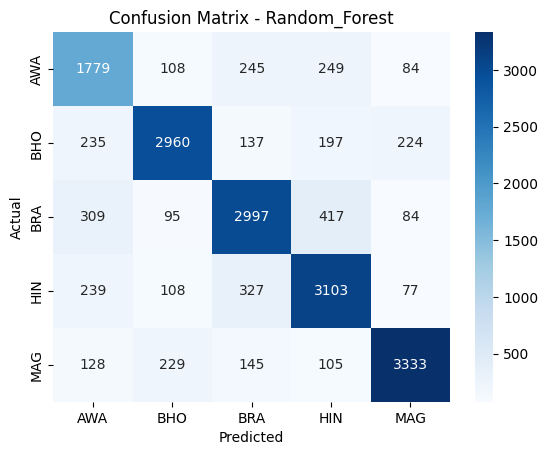

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.75%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7875404711398906
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.76      0.69      2465
           1       0.87      0.76      0.81      3753
           2       0.71      0.79      0.74      3902
           3       0.81      0.79      0.80      3854
           4       0.92      0.82      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.79      0.78     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 151.55 seconds
Accuracy: 0.7875404711398906
Precision: 0.7998
Recall for : 0.7875
F1 Score:  0.7908
AUC Score: 0.9594
Balanced Accuracy: 0.7856
G-mean Score: 0.8643
pf Score: 0.0528
Bal Score :  0.8452025977276948


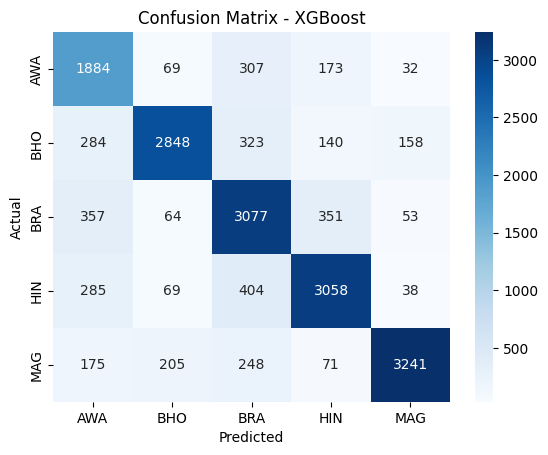

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 70.32%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7032488556436307
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.60      0.57      2465
           1       0.75      0.73      0.74      3753
           2       0.68      0.67      0.68      3902
           3       0.68      0.69      0.69      3854
           4       0.81      0.78      0.80      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.70      0.69     17914
weighted avg       0.71      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 32.18 seconds
Accuracy: 0.7032488556436307
Precision: 0.7061
Recall for : 0.7032
F1 Score:  0.7044
AUC Score: 0.8183
Balanced Accuracy: 0.6955
G-mean Score: 0.8071
pf Score: 0.0741
Bal Score :  0.7837215836028295


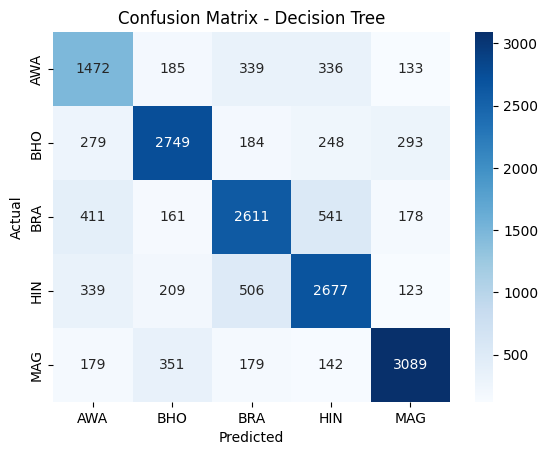

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 19.61%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.19610360611811992
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.79      0.25      2465
           1       0.27      0.31      0.29      3753
           2       0.60      0.07      0.12      3902
           3       0.64      0.01      0.02      3854
           4       0.88      0.03      0.05      3940

    accuracy                           0.20     17914
   macro avg       0.51      0.24      0.15     17914
weighted avg       0.54      0.20      0.14     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.19610360611811992
Precision: 0.5386
Recall for : 0.1961
F1 Score:  0.1358
AUC Score: 0.6063
Balanced Accuracy: 0.2409
G-mean Score: 0.4087
pf Score: 0.1904
Bal Score :  0.4158251628266665


## LightGBM Model -81.85%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 5.226954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 177790
[LightGBM] [Info] Number of data points in the train set: 78870, number of used features: 4356
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8184660042424919
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.79      0.74      2465
           1       0.88      0.80      0.84      3753
           2       0.77      0.81      0.79      3902
           3       0.82      0.82      0.82      3854
           4       0.92      0.85      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.81      0.82      0.81     17914
weighted avg       0.82      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 84.73 seconds
Accuracy: 0.8184660042424919
Precision: 0.8245
Recall for : 0.8185
F1 Score:  0.8202
AUC Score: 0.9699
Balanced Accuracy: 0.8164
G-mean Score: 0.8845
pf Score: 0.0451
Bal Score :  0.8677277619392488


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

84.7251
0.8185
0.8245
0.8185
0.8202
0.9699
0.8164
0.8845
0.0451
0.8677


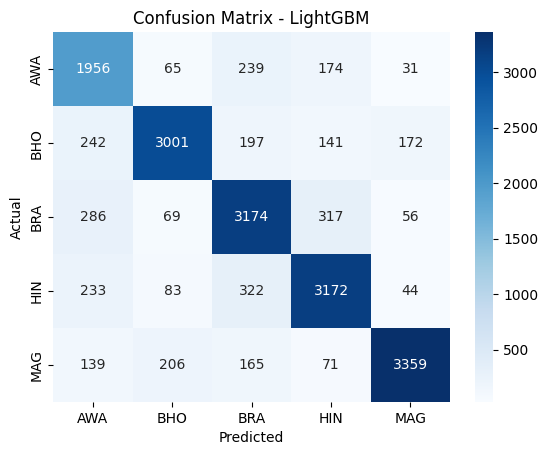

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 86.20%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8620073685385732
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.82      0.79      2465
           1       0.89      0.86      0.87      3753
           2       0.84      0.85      0.85      3902
           3       0.85      0.87      0.86      3854
           4       0.93      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 10.02 seconds
Accuracy: 0.8620073685385732
Precision: 0.8636
Recall for : 0.8620
F1 Score:  0.8626
AUC Score: 0.9784
Balanced Accuracy: 0.8587
G-mean Score: 0.9125
pf Score: 0.0344
Bal Score :  0.8994368483644829


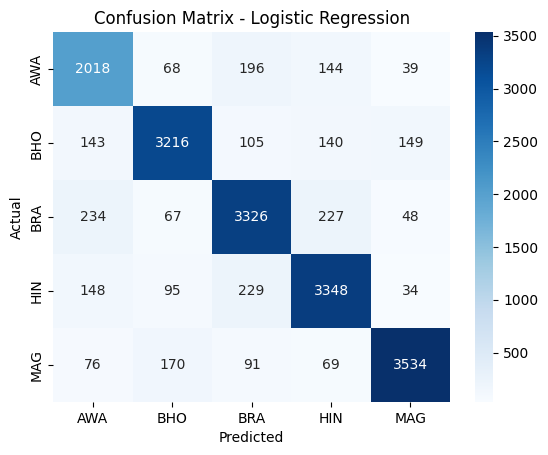

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.27%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8526850507982583
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.88      0.76      2465
           1       0.93      0.79      0.85      3753
           2       0.86      0.85      0.85      3902
           3       0.90      0.83      0.87      3854
           4       0.89      0.92      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.85     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.04 seconds
Accuracy: 0.8526850507982583
Precision: 0.8630
Recall for : 0.8527
F1 Score:  0.8545
AUC Score: 0.9805
Balanced Accuracy: 0.8539
G-mean Score: 0.9076
pf Score: 0.0362
Bal Score :  0.892725637546821


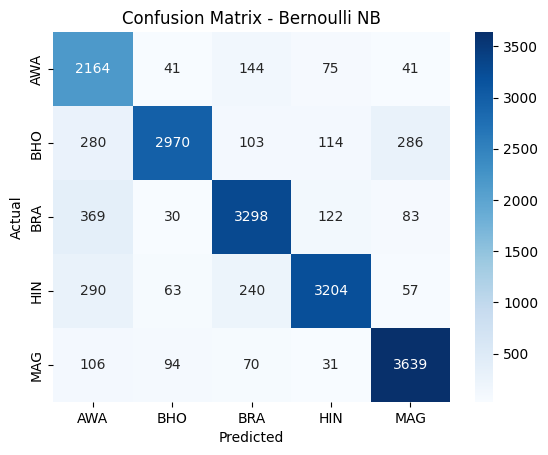

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

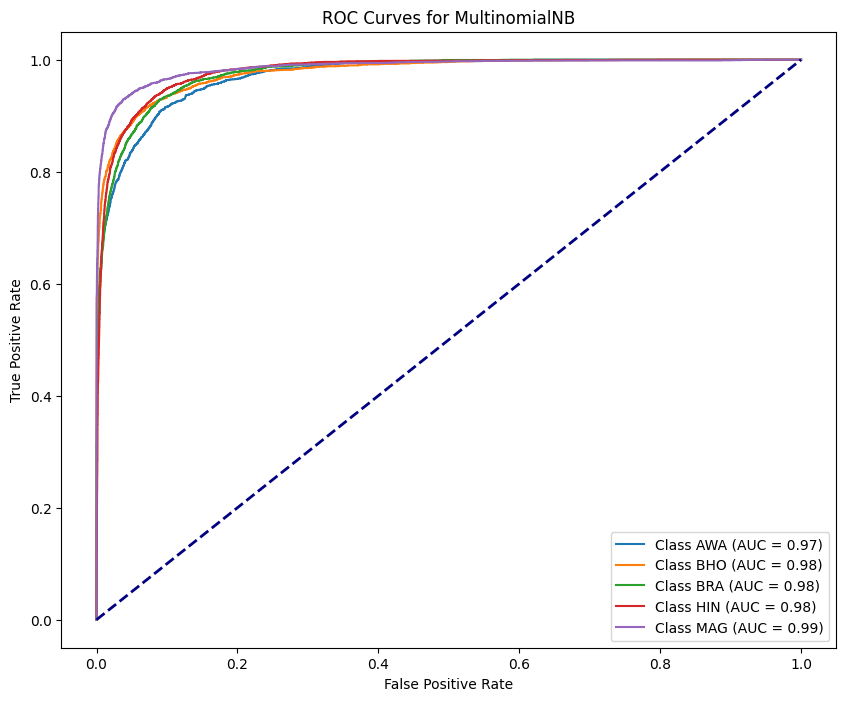

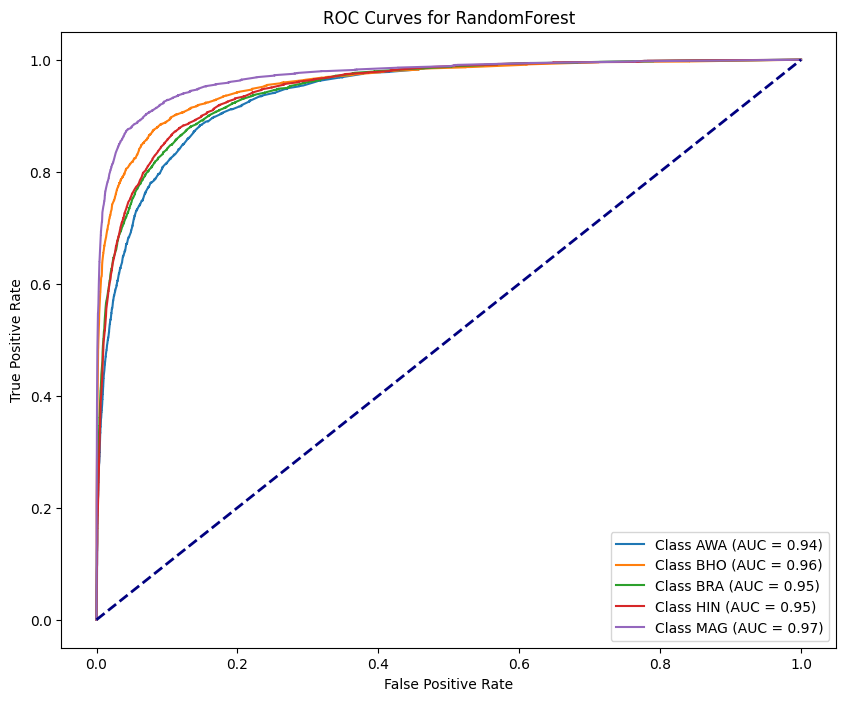

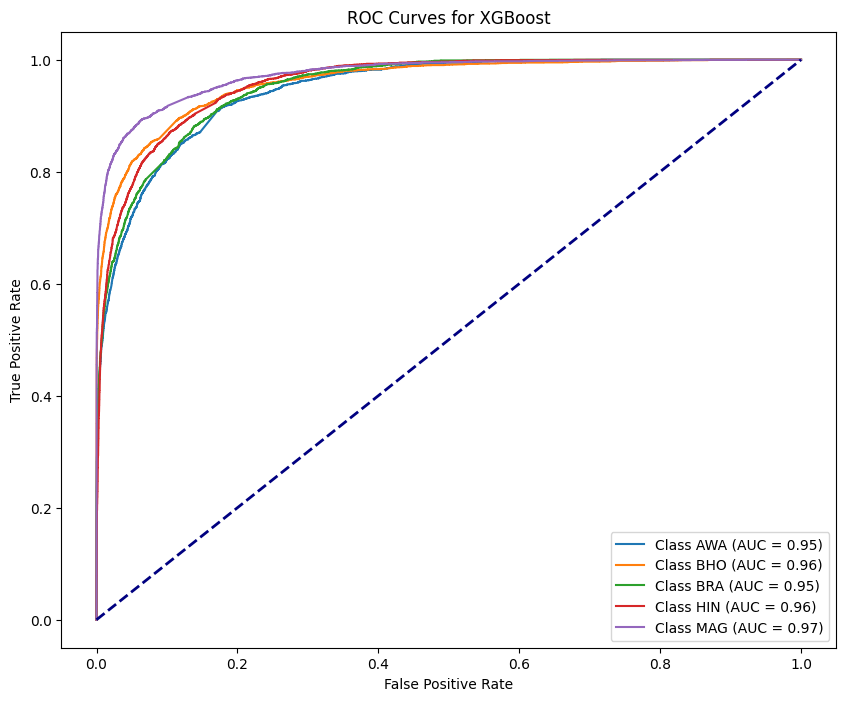

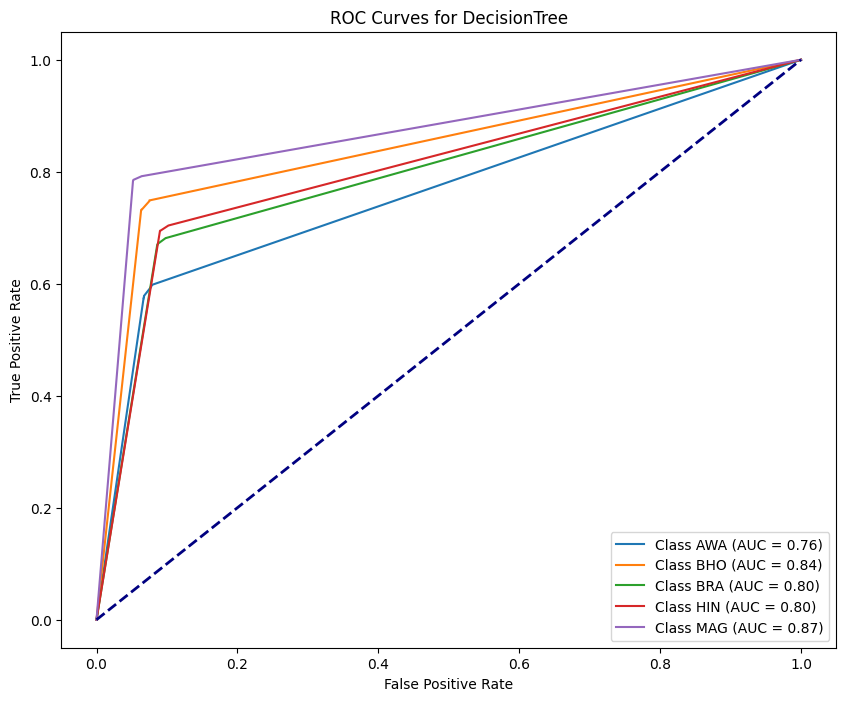

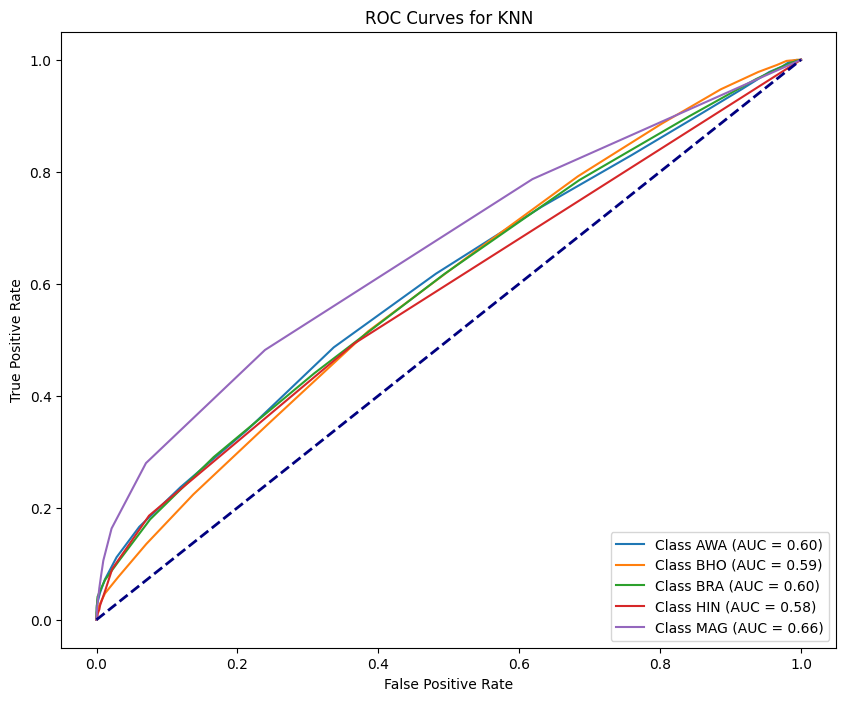

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


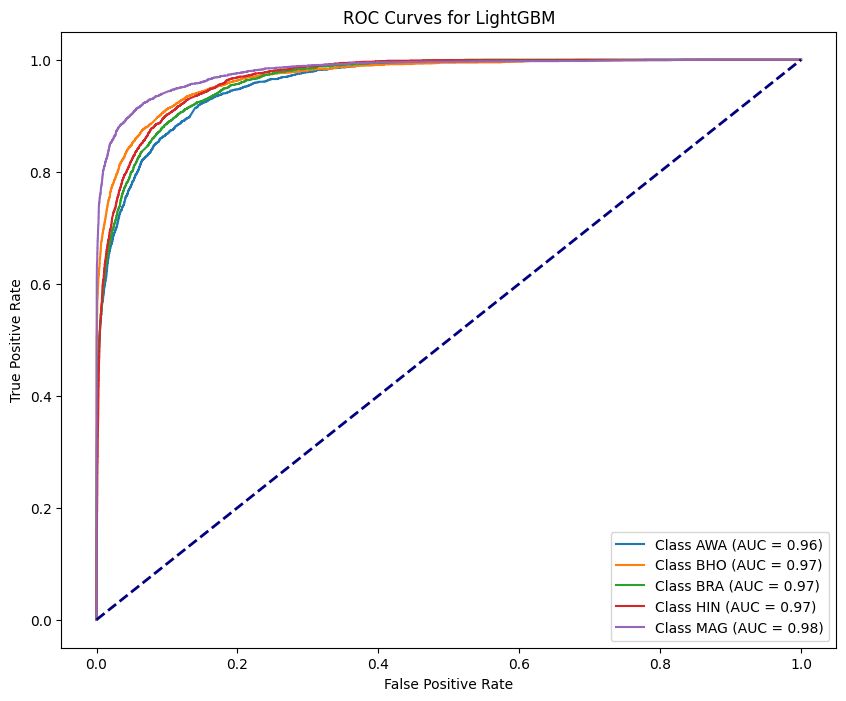

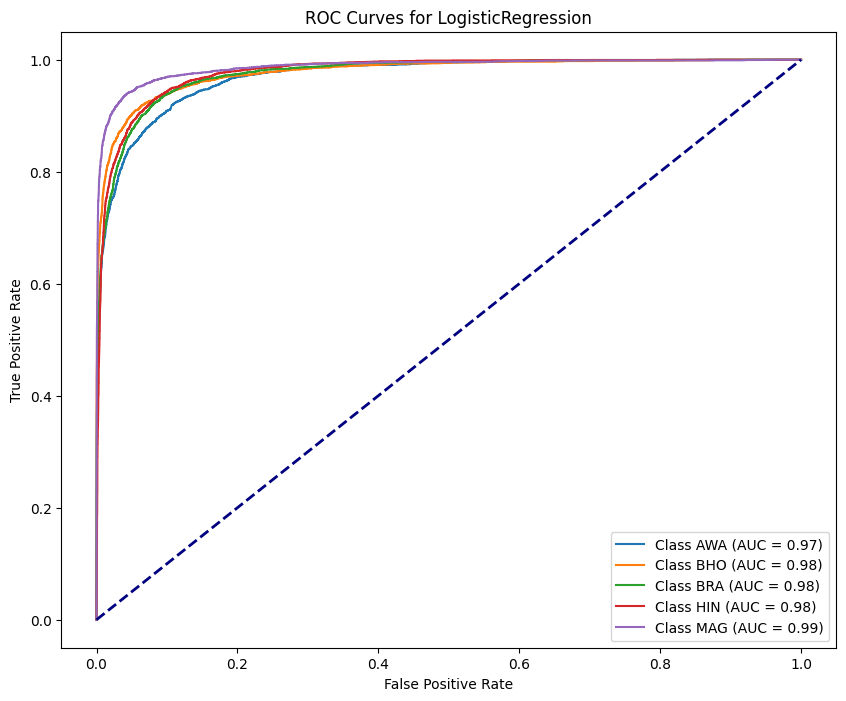

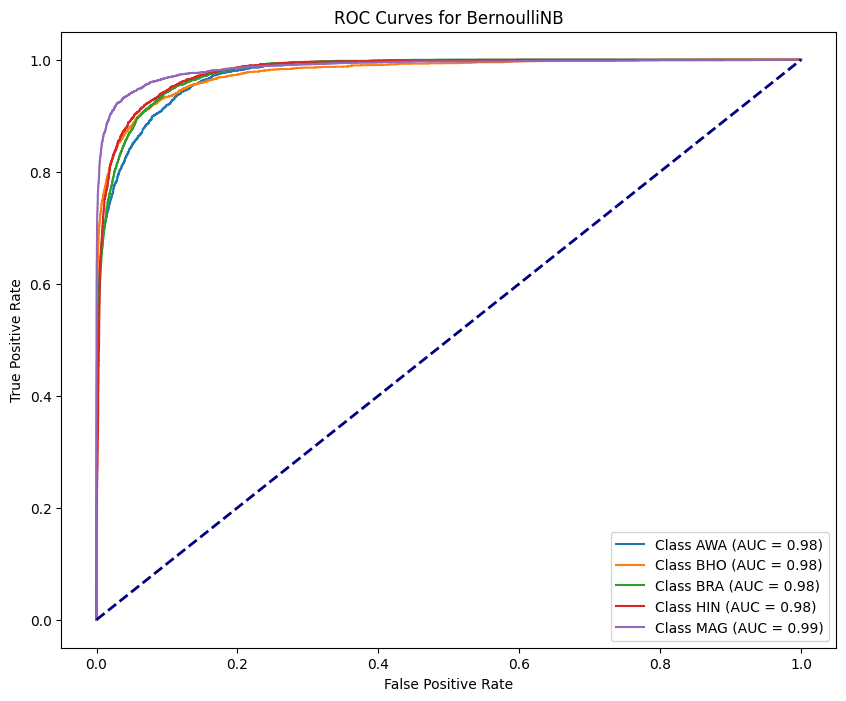

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


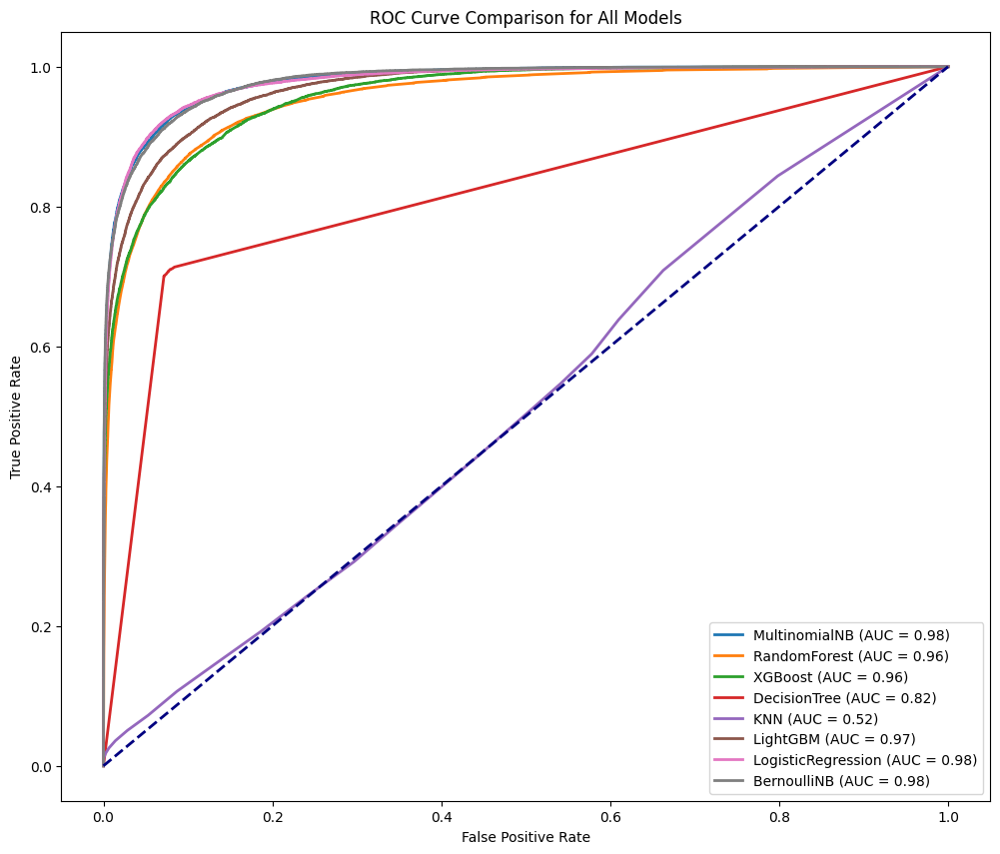

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ADASYN**

In [ ]:
from imblearn.over_sampling import ADASYN
adasyn = ADASYN(sampling_strategy='minority', random_state=42)
X_train, y_train = adasyn.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-174-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-174-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


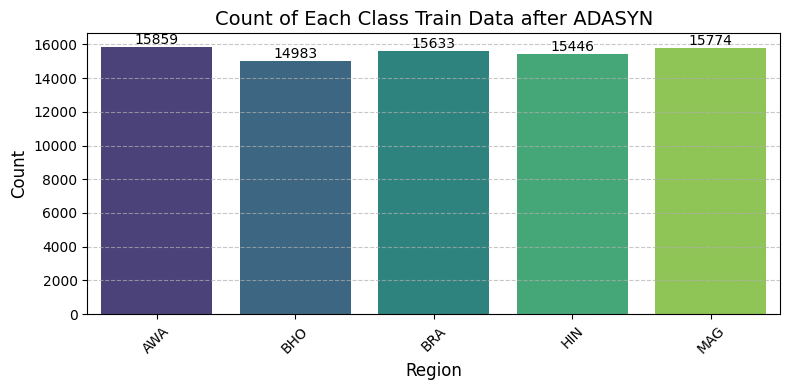

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ADASYN")

## Multinomial NB- 85.99%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8598861225856872
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.84      0.79      2465
           1       0.90      0.83      0.86      3753
           2       0.88      0.83      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.91      0.91      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.8598861225856872
Precision: 0.8628
Recall for : 0.8599
F1 Score:  0.8605
AUC Score: 0.9794
Balanced Accuracy: 0.8581
G-mean Score: 0.9114
pf Score: 0.0348
Bal Score :  0.8979113552788888


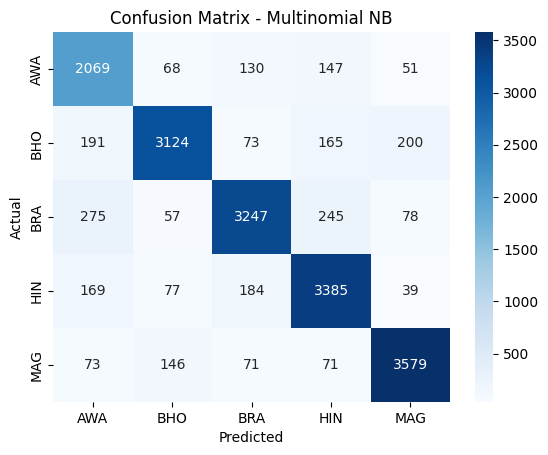

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -78.65%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7864798481634476
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.74      0.68      2465
           1       0.85      0.78      0.82      3753
           2       0.79      0.76      0.77      3902
           3       0.77      0.79      0.78      3854
           4       0.87      0.84      0.86      3940

    accuracy                           0.79     17914
   macro avg       0.78      0.78      0.78     17914
weighted avg       0.79      0.79      0.79     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 220.89 seconds
Accuracy: 0.7864798481634476
Precision: 0.7921
Recall for : 0.7865
F1 Score:  0.7883
AUC Score: 0.9532
Balanced Accuracy: 0.7826
G-mean Score: 0.8636
pf Score: 0.0530
Bal Score :  0.8444285362053214


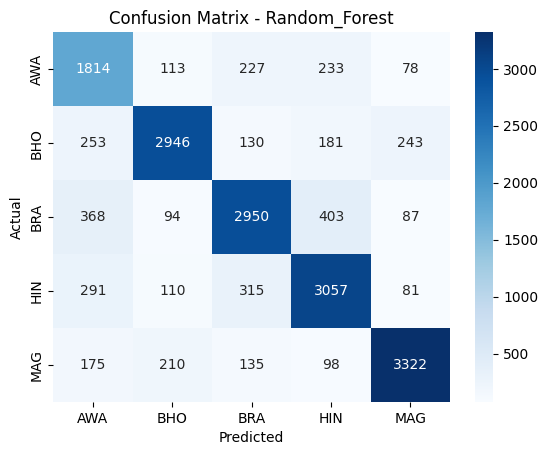

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.66%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7865914926872837
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.75      0.69      2465
           1       0.88      0.75      0.81      3753
           2       0.70      0.80      0.74      3902
           3       0.81      0.79      0.80      3854
           4       0.91      0.83      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.78      0.78     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 162.91 seconds
Accuracy: 0.7865914926872837
Precision: 0.7980
Recall for : 0.7866
F1 Score:  0.7896
AUC Score: 0.9594
Balanced Accuracy: 0.7834
G-mean Score: 0.8635
pf Score: 0.0531
Bal Score :  0.8444962115270599


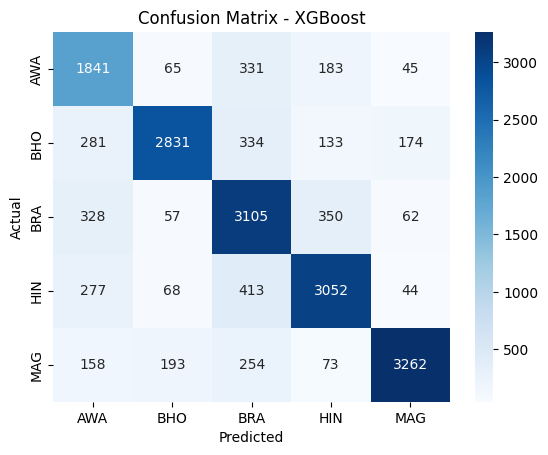

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 69.83%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.698336496594842
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.60      0.56      2465
           1       0.74      0.74      0.74      3753
           2       0.68      0.66      0.67      3902
           3       0.68      0.68      0.68      3854
           4       0.81      0.78      0.80      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.69      0.69     17914
weighted avg       0.70      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 35.31 seconds
Accuracy: 0.698336496594842
Precision: 0.7025
Recall for : 0.6983
F1 Score:  0.7000
AUC Score: 0.8150
Balanced Accuracy: 0.6914
G-mean Score: 0.8040
pf Score: 0.0752
Bal Score :  0.780161473025288


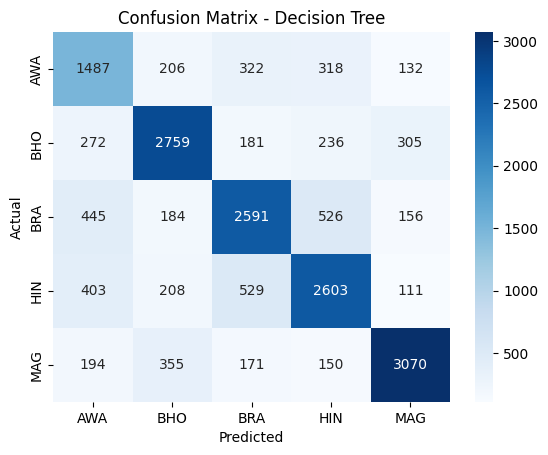

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 14.93%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.14932455063079156
Classification Report:
               precision    recall  f1-score   support

           0       0.14      0.99      0.24      2465
           1       0.51      0.02      0.04      3753
           2       0.87      0.03      0.05      3902
           3       0.72      0.00      0.01      3854
           4       0.86      0.01      0.02      3940

    accuracy                           0.15     17914
   macro avg       0.62      0.21      0.07     17914
weighted avg       0.66      0.15      0.06     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.14932455063079156
Precision: 0.6597
Recall for : 0.1493
F1 Score:  0.0593
AUC Score: 0.6240
Balanced Accuracy: 0.2101
G-mean Score: 0.3591
pf Score: 0.1974
Bal Score :  0.38249624057087084


## LightGBM Model -81.85%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 5.576385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178787
[LightGBM] [Info] Number of data points in the train set: 77695, number of used features: 4321
[LightGBM] [Info] Start training from score -1.589054
[LightGBM] [Info] Start training from score -1.645875
[LightGBM] [Info] Start training from score -1.603407
[LightGBM] [Info] Start training from score -1.615441
[LightGBM] [Info] Start training from score -1.594428


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.81852182650441
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.78      0.73      2465
           1       0.88      0.80      0.84      3753
           2       0.78      0.82      0.80      3902
           3       0.82      0.83      0.82      3854
           4       0.92      0.85      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.81      0.82      0.81     17914
weighted avg       0.82      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 76.49 seconds
Accuracy: 0.81852182650441
Precision: 0.8248
Recall for : 0.8185
F1 Score:  0.8203
AUC Score: 0.9698
Balanced Accuracy: 0.8157
G-mean Score: 0.8846
pf Score: 0.0451
Bal Score :  0.8677710734252873


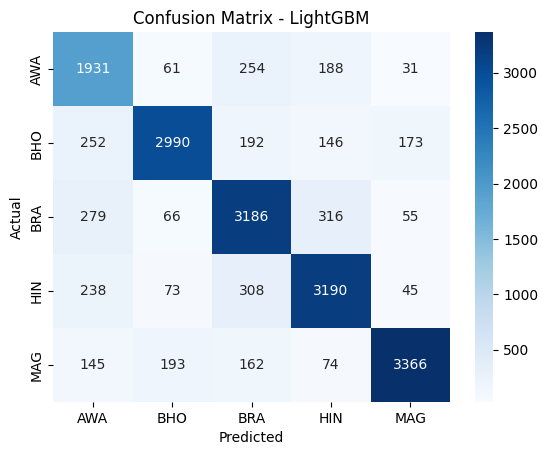

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 85.81%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8580998102043095
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.84      0.77      2465
           1       0.90      0.85      0.87      3753
           2       0.86      0.84      0.85      3902
           3       0.85      0.87      0.86      3854
           4       0.93      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 10.18 seconds
Accuracy: 0.8580998102043095
Precision: 0.8626
Recall for : 0.8581
F1 Score:  0.8594
AUC Score: 0.9778
Balanced Accuracy: 0.8565
G-mean Score: 0.9106
pf Score: 0.0351
Bal Score :  0.8966337918331418


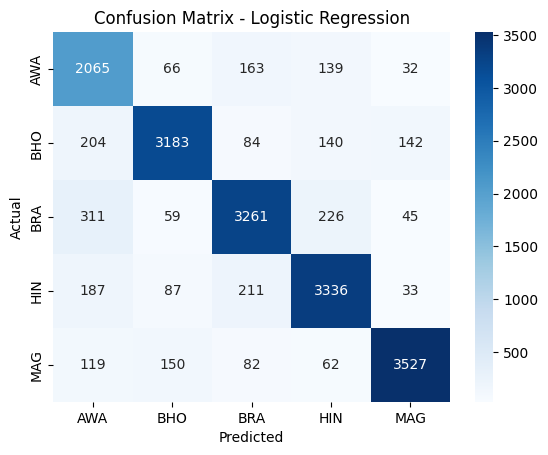

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.30%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8530199843697667
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.87      0.77      2465
           1       0.93      0.79      0.86      3753
           2       0.85      0.85      0.85      3902
           3       0.90      0.83      0.87      3854
           4       0.88      0.93      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.85     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.04 seconds
Accuracy: 0.8530199843697667
Precision: 0.8628
Recall for : 0.8530
F1 Score:  0.8545
AUC Score: 0.9807
Balanced Accuracy: 0.8538
G-mean Score: 0.9077
pf Score: 0.0362
Bal Score :  0.8929589989412519


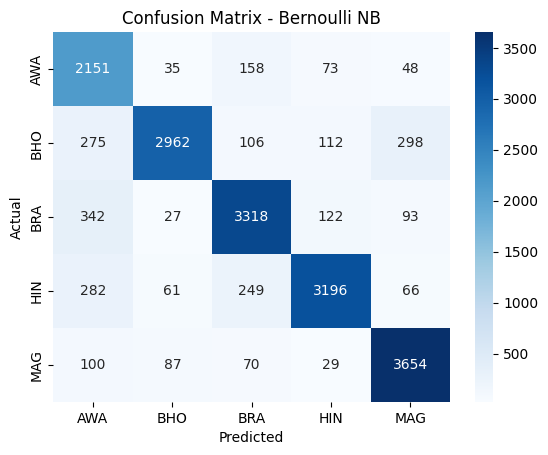

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

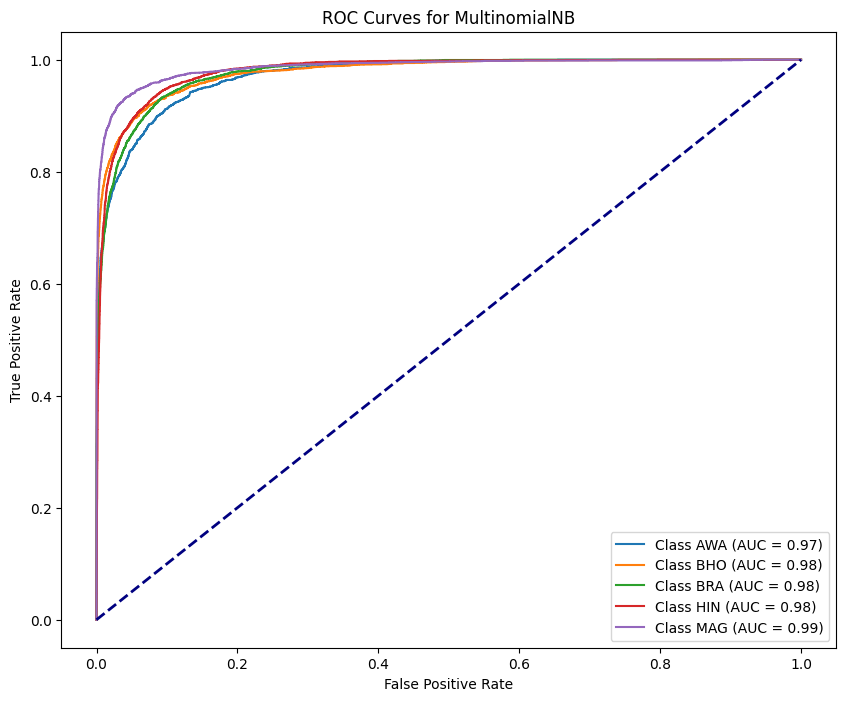

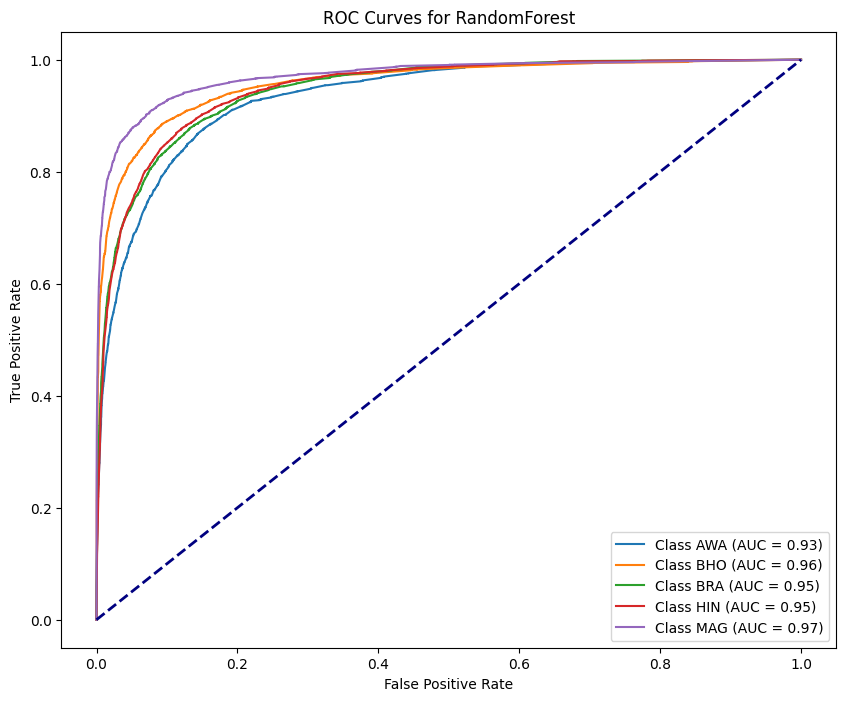

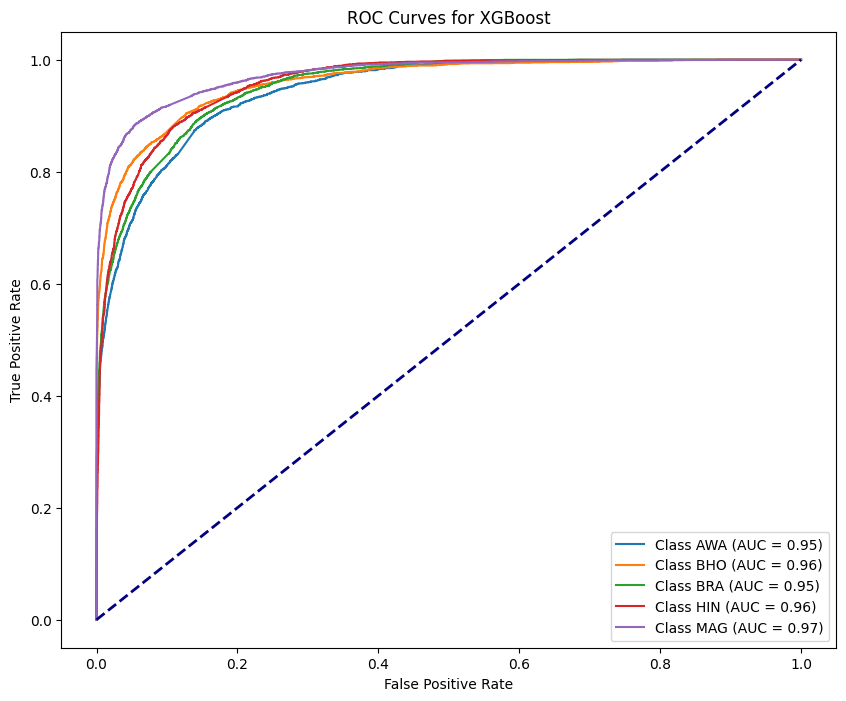

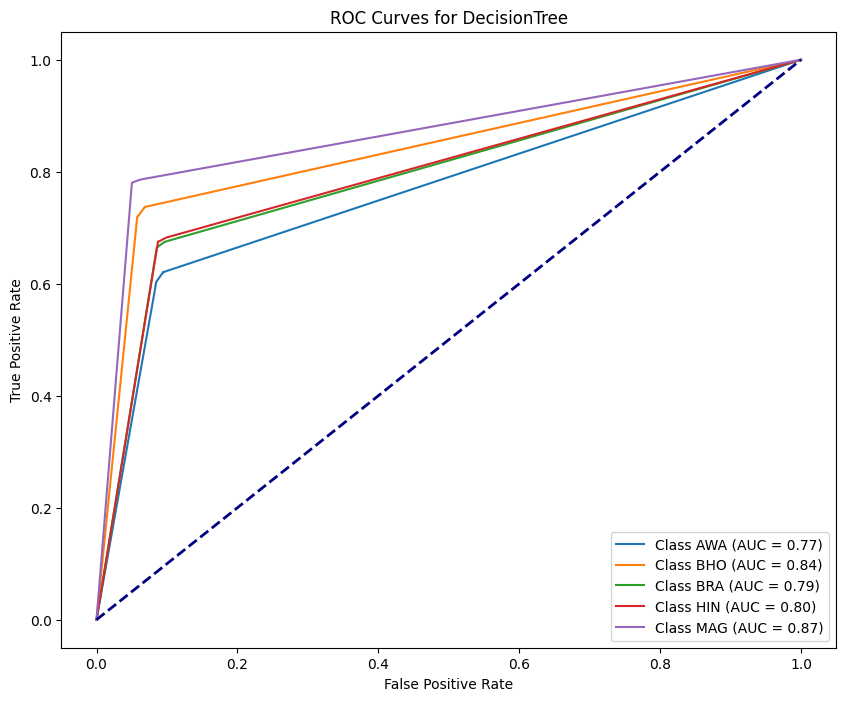

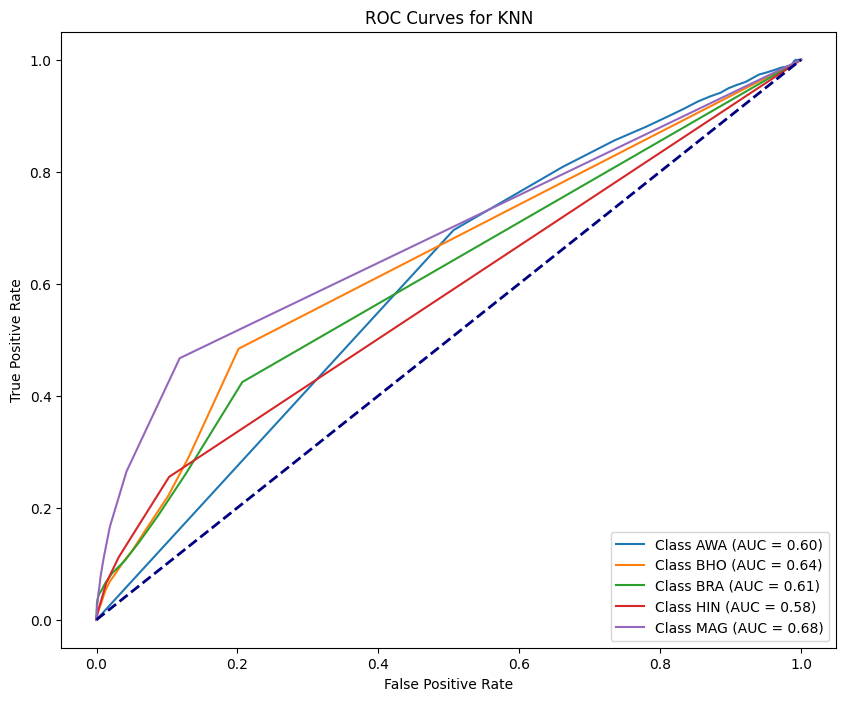

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


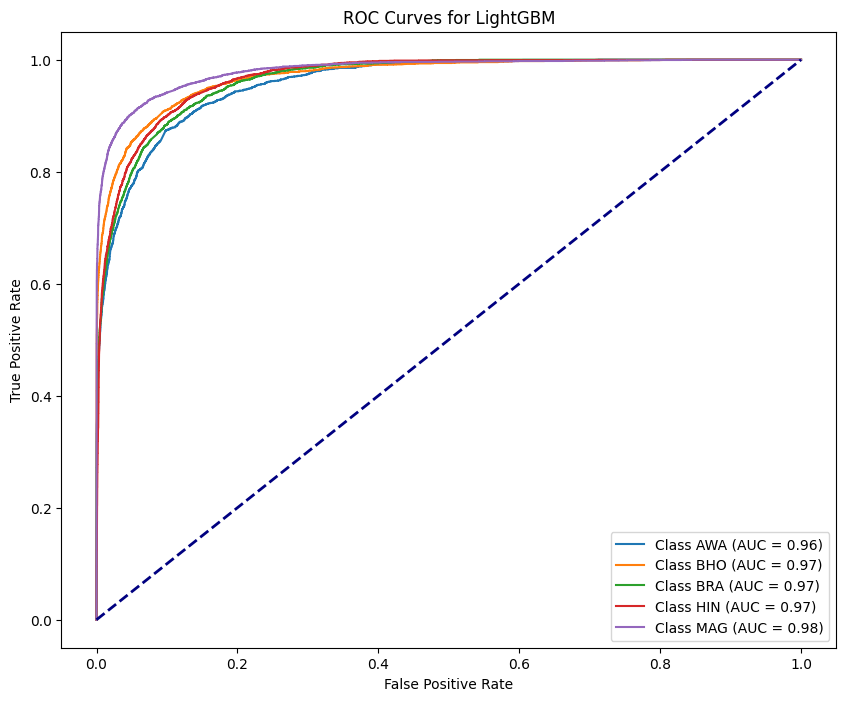

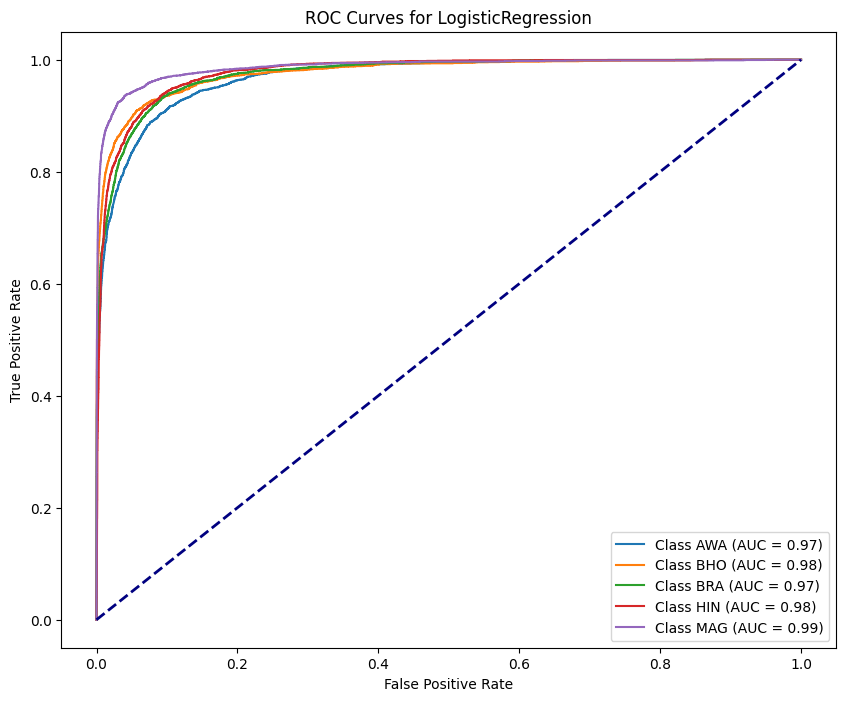

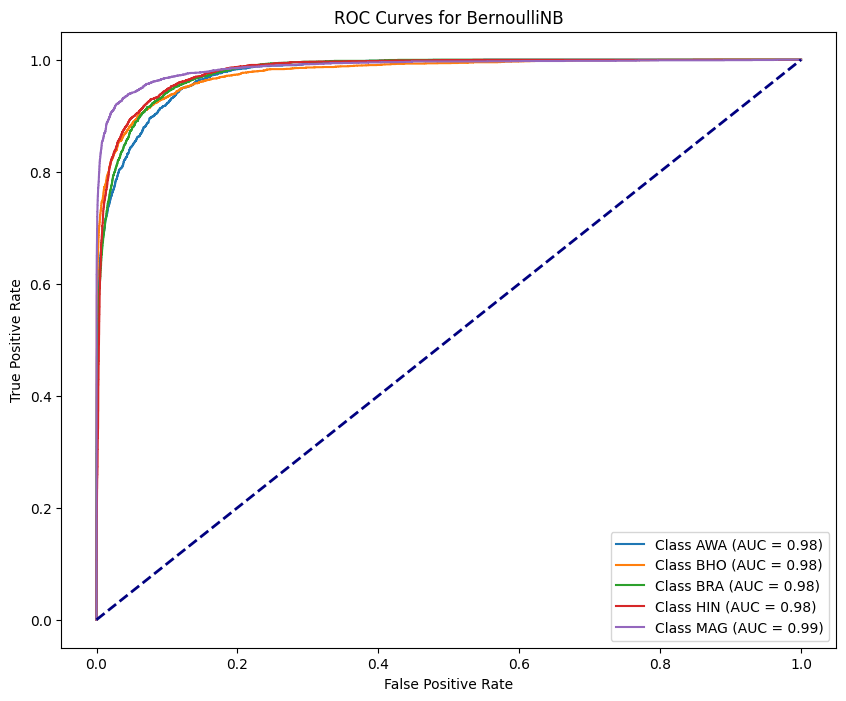

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


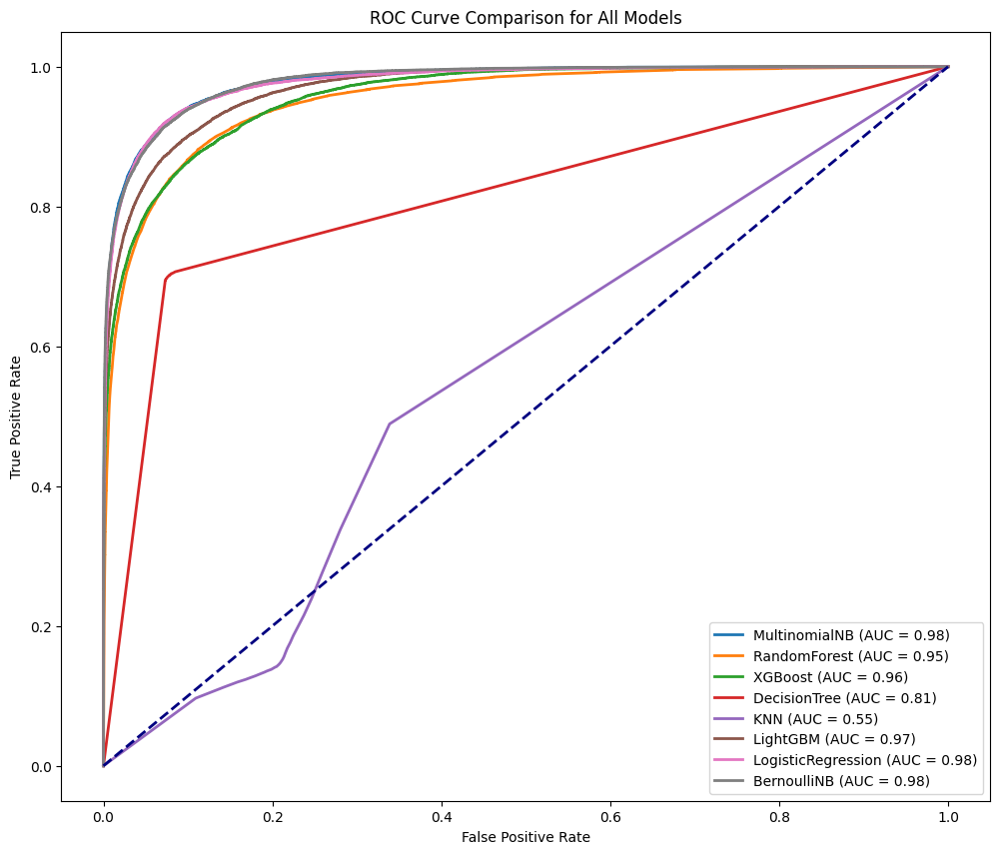

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **RUS**

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

X_train, y_train = rus.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-222-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-222-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


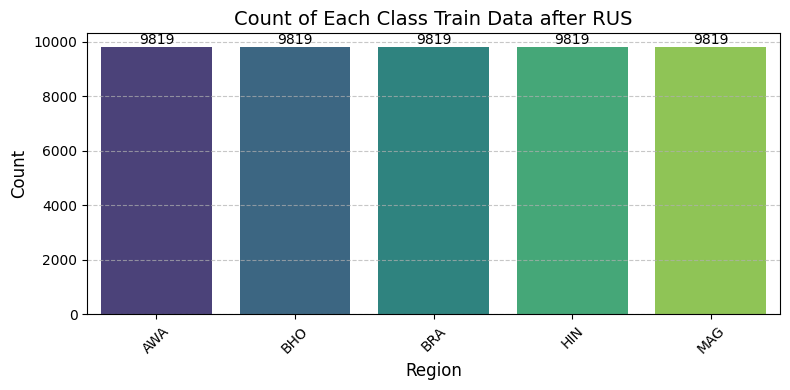

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after RUS")

## Multinomial NB- 85.74%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8574299430612928
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.84      0.79      2465
           1       0.88      0.84      0.86      3753
           2       0.87      0.83      0.85      3902
           3       0.84      0.87      0.86      3854
           4       0.91      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8574299430612928
Precision: 0.8601
Recall for : 0.8574
F1 Score:  0.8581
AUC Score: 0.9784
Balanced Accuracy: 0.8557
G-mean Score: 0.9098
pf Score: 0.0354
Bal Score :  0.8961205954996337


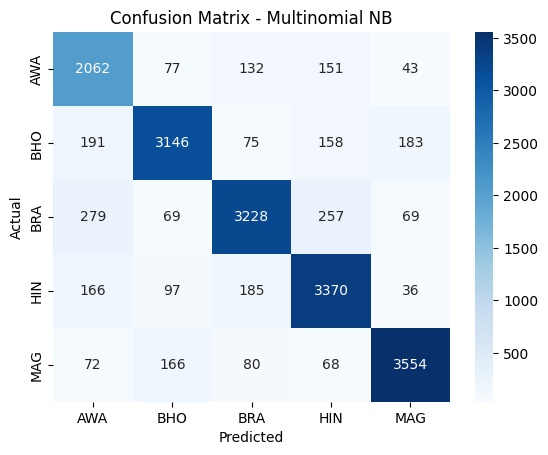

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -77.89%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7788880205425924
Classification Report:
               precision    recall  f1-score   support

           0       0.58      0.79      0.67      2465
           1       0.85      0.76      0.81      3753
           2       0.79      0.73      0.76      3902
           3       0.77      0.79      0.78      3854
           4       0.88      0.82      0.85      3940

    accuracy                           0.78     17914
   macro avg       0.78      0.78      0.77     17914
weighted avg       0.79      0.78      0.78     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 114.47 seconds
Accuracy: 0.7788880205425924
Precision: 0.7916
Recall for : 0.7789
F1 Score:  0.7822
AUC Score: 0.9500
Balanced Accuracy: 0.7793
G-mean Score: 0.8594
pf Score: 0.0546
Bal Score :  0.8389546017098726


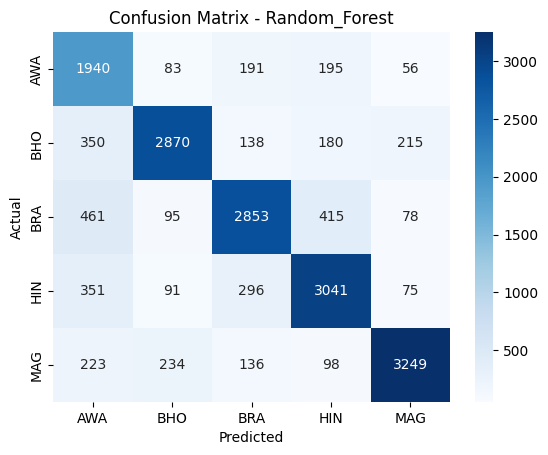

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.31%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7831305124483644
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.77      0.69      2465
           1       0.88      0.75      0.81      3753
           2       0.70      0.79      0.74      3902
           3       0.81      0.79      0.80      3854
           4       0.92      0.81      0.86      3940

    accuracy                           0.78     17914
   macro avg       0.78      0.78      0.78     17914
weighted avg       0.80      0.78      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 114.73 seconds
Accuracy: 0.7831305124483644
Precision: 0.7969
Recall for : 0.7831
F1 Score:  0.7866
AUC Score: 0.9583
Balanced Accuracy: 0.7822
G-mean Score: 0.8615
pf Score: 0.0538
Bal Score :  0.8419949807743519


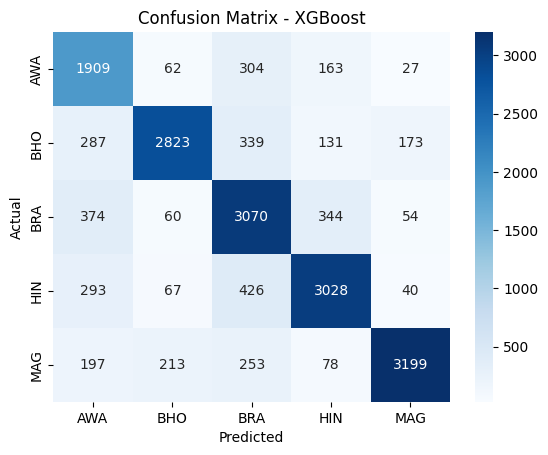

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 68.32%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6832086636150497
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.65      0.55      2465
           1       0.76      0.69      0.72      3753
           2       0.69      0.63      0.66      3902
           3       0.68      0.67      0.67      3854
           4       0.82      0.76      0.79      3940

    accuracy                           0.68     17914
   macro avg       0.68      0.68      0.68     17914
weighted avg       0.70      0.68      0.69     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 15.37 seconds
Accuracy: 0.6832086636150497
Precision: 0.6976
Recall for : 0.6832
F1 Score:  0.6876
AUC Score: 0.8078
Balanced Accuracy: 0.6807
G-mean Score: 0.7948
pf Score: 0.0785
Bal Score :  0.769228211183365


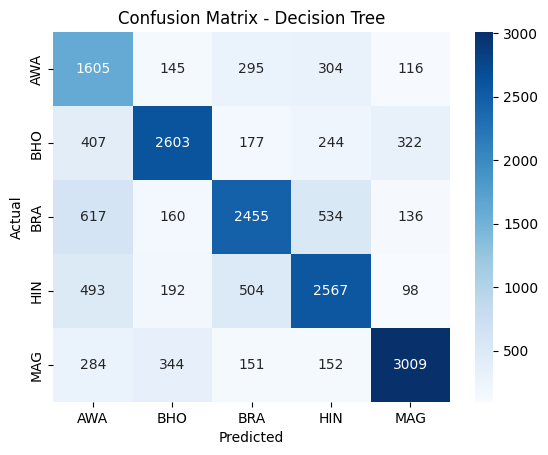

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 17.49%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.17494696885117786
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.89      0.25      2465
           1       0.27      0.19      0.22      3753
           2       0.59      0.05      0.09      3902
           3       0.56      0.00      0.01      3854
           4       0.83      0.01      0.02      3940

    accuracy                           0.17     17914
   macro avg       0.48      0.23      0.12     17914
weighted avg       0.51      0.17      0.11     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.17494696885117786
Precision: 0.5080
Recall for : 0.1749
F1 Score:  0.1065
AUC Score: 0.5857
Balanced Accuracy: 0.2273
G-mean Score: 0.3870
pf Score: 0.1938
Bal Score :  0.4007269147789543


## LightGBM Model -81.26%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.751822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 119920
[LightGBM] [Info] Number of data points in the train set: 49095, number of used features: 3189
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8126046667410963
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.80      0.73      2465
           1       0.88      0.79      0.83      3753
           2       0.77      0.80      0.79      3902
           3       0.82      0.82      0.82      3854
           4       0.91      0.84      0.88      3940

    accuracy                           0.81     17914
   macro avg       0.81      0.81      0.81     17914
weighted avg       0.82      0.81      0.81     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 47.91 seconds
Accuracy: 0.8126046667410963
Precision: 0.8199
Recall for : 0.8126
F1 Score:  0.8146
AUC Score: 0.9687
Balanced Accuracy: 0.8113
G-mean Score: 0.8808
pf Score: 0.0465
Bal Score :  0.8634659346184896


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

47.9147
0.8126
0.8199
0.8126
0.8146
0.9687
0.8113
0.8808
0.0465
0.8635


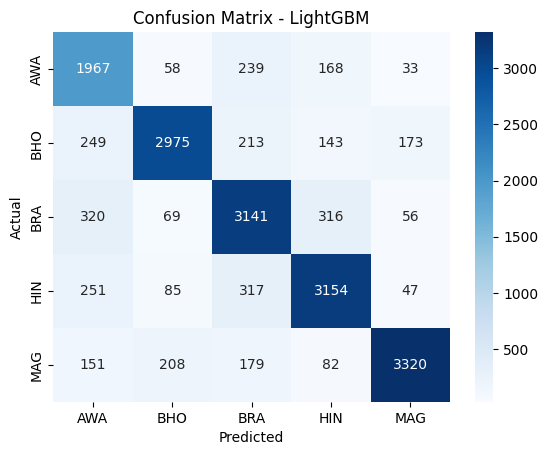

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 85.46%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8545830077034722
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.82      0.79      2465
           1       0.88      0.84      0.86      3753
           2       0.84      0.84      0.84      3902
           3       0.85      0.87      0.86      3854
           4       0.93      0.89      0.91      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 7.35 seconds
Accuracy: 0.8545830077034722
Precision: 0.8568
Recall for : 0.8546
F1 Score:  0.8553
AUC Score: 0.9767
Balanced Accuracy: 0.8519
G-mean Score: 0.9078
pf Score: 0.0362
Bal Score :  0.8940329031018037


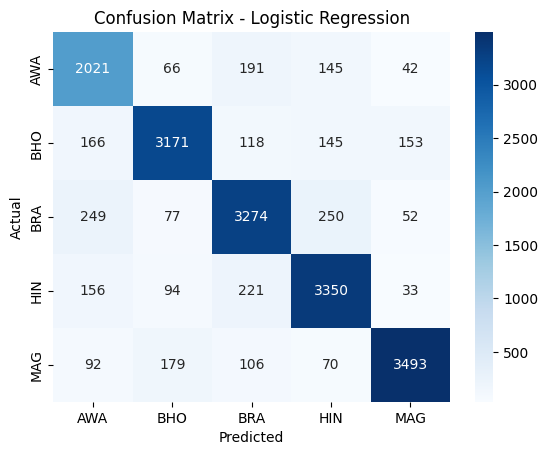

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 84.84%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8483867366305683
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.88      0.76      2465
           1       0.93      0.79      0.85      3753
           2       0.85      0.84      0.85      3902
           3       0.90      0.82      0.86      3854
           4       0.89      0.92      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.84     17914
weighted avg       0.86      0.85      0.85     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8483867366305683
Precision: 0.8601
Recall for : 0.8484
F1 Score:  0.8504
AUC Score: 0.9797
Balanced Accuracy: 0.8502
G-mean Score: 0.9049
pf Score: 0.0373
Bal Score :  0.8896010545960472


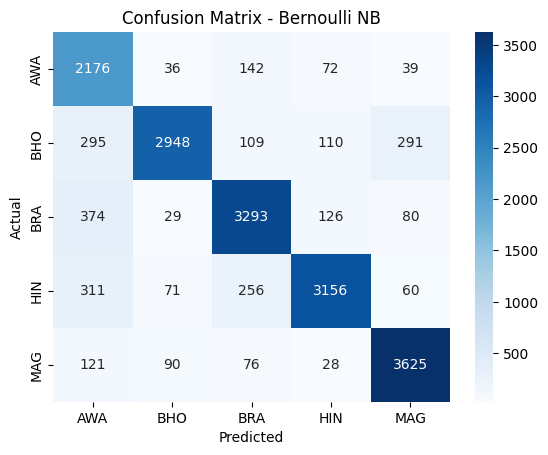

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

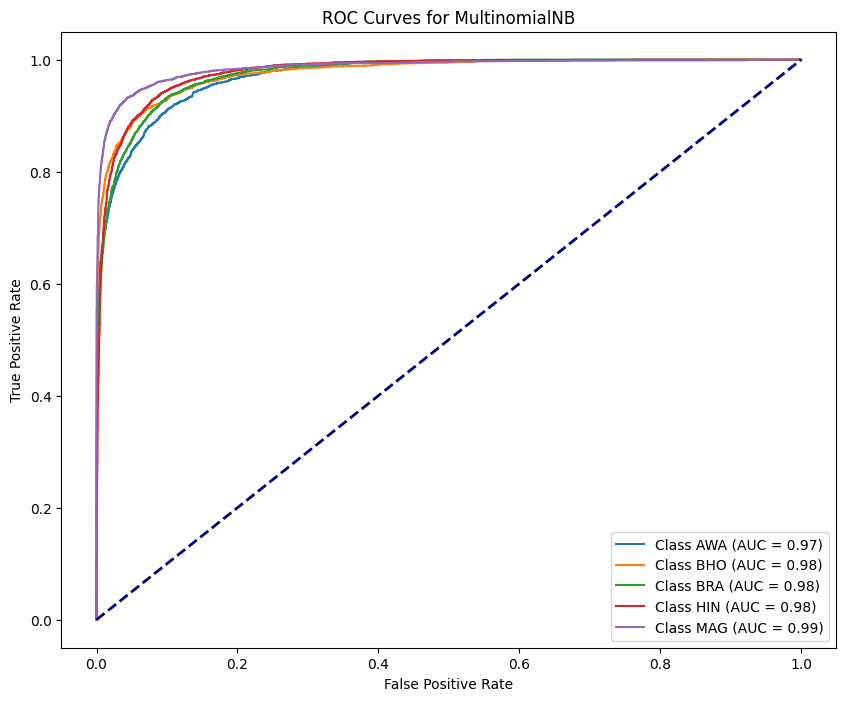

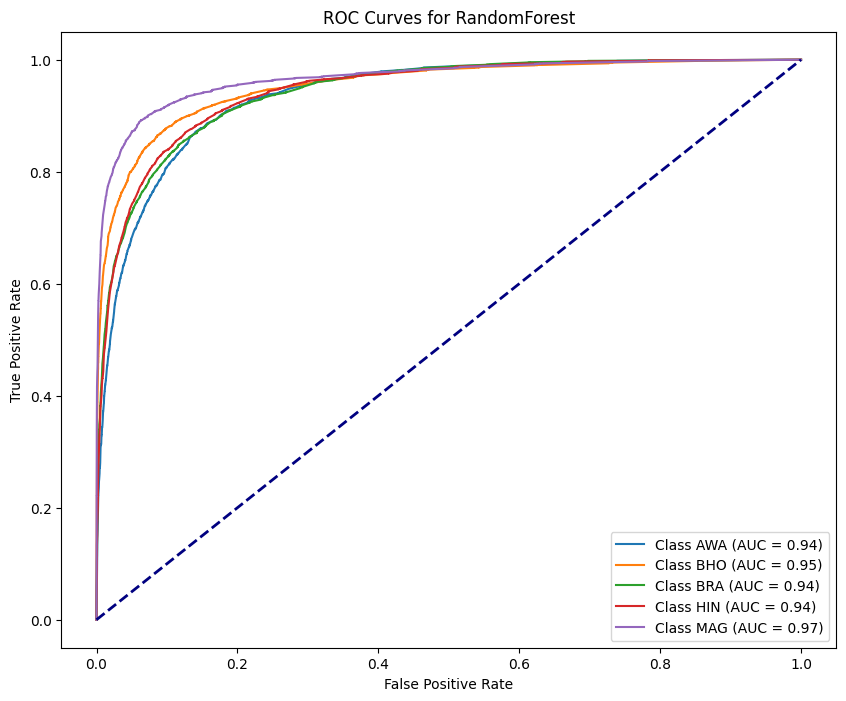

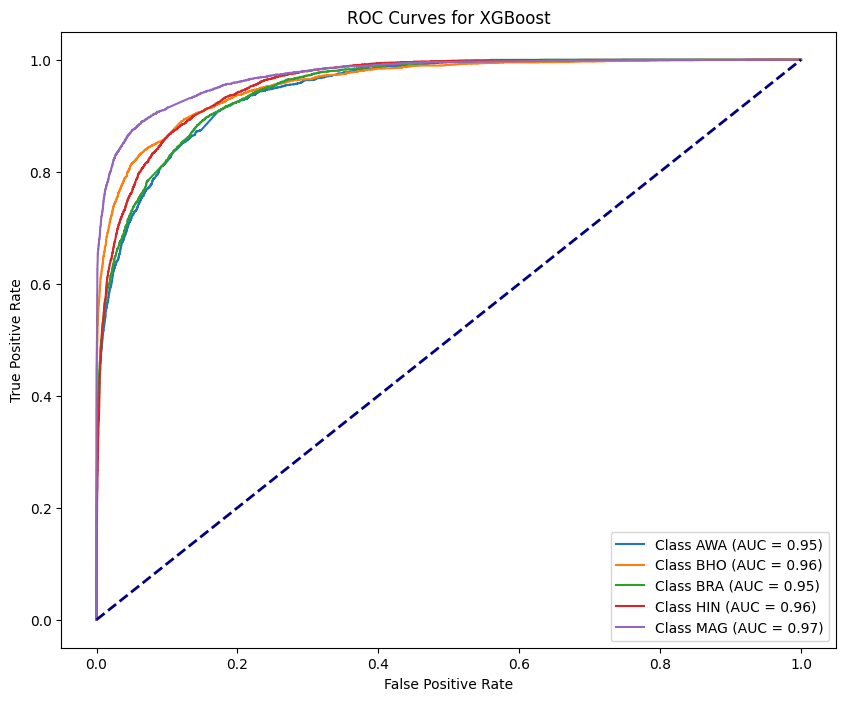

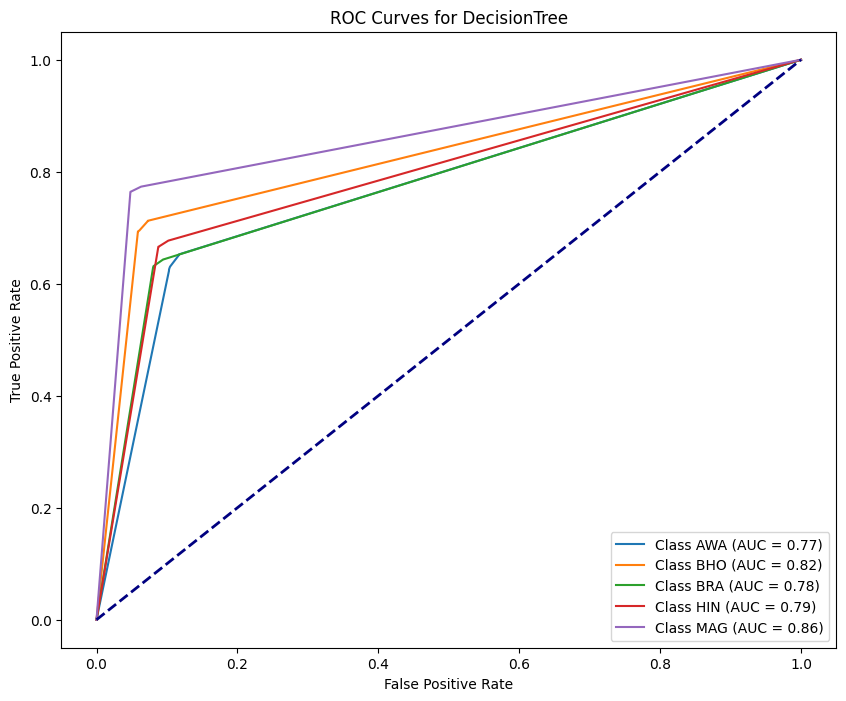

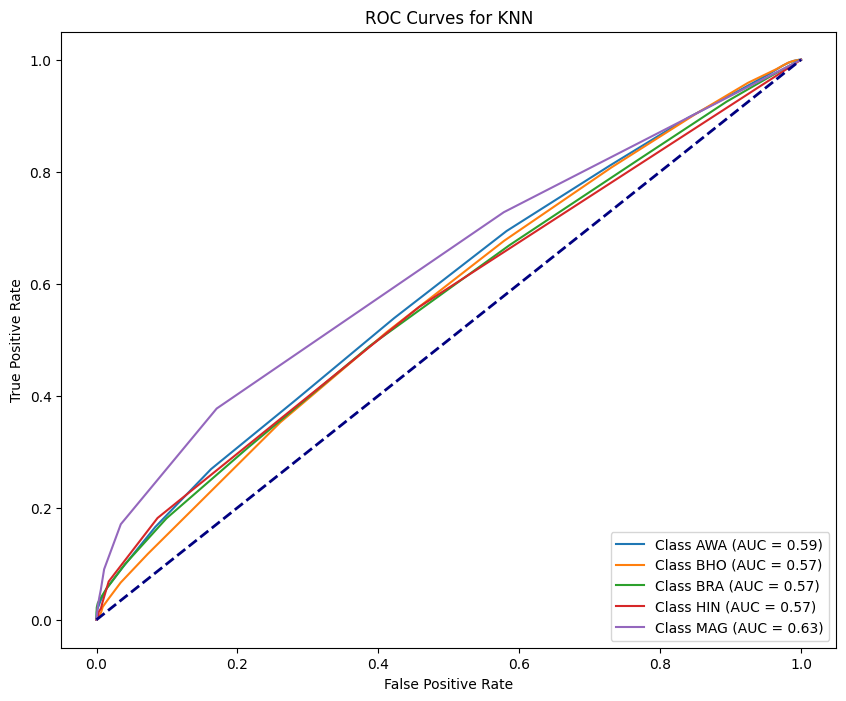

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


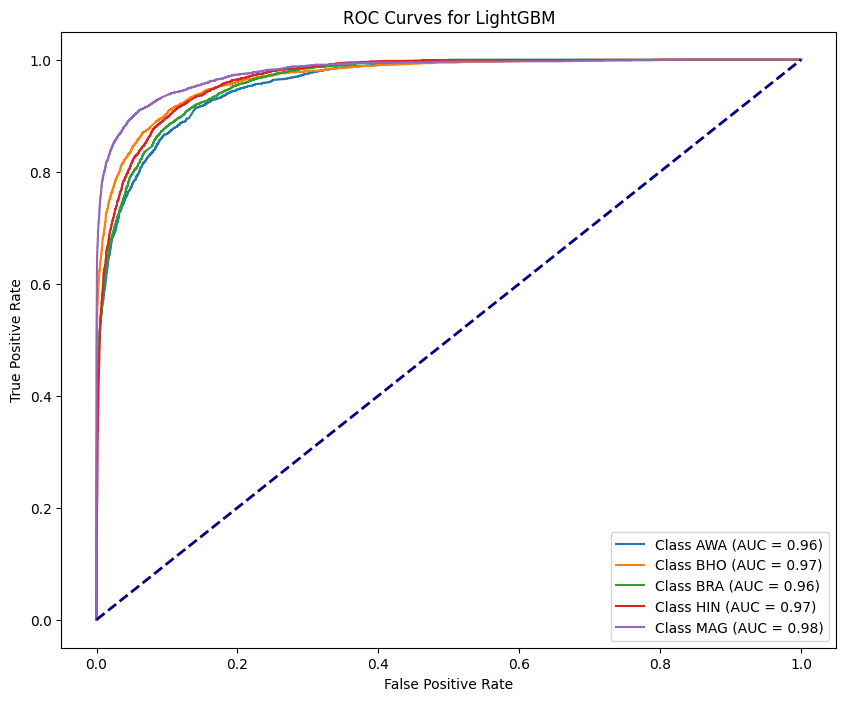

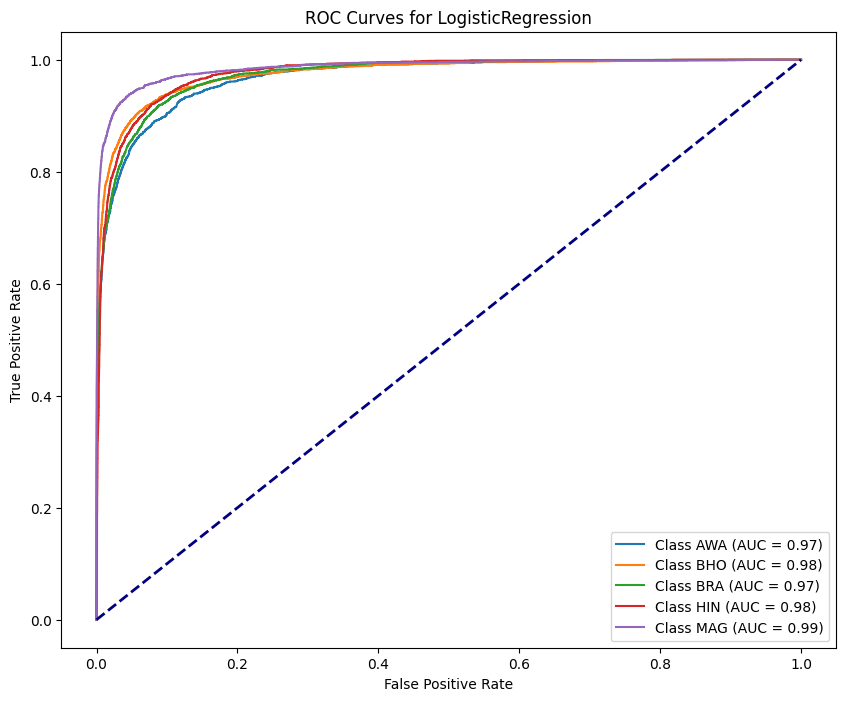

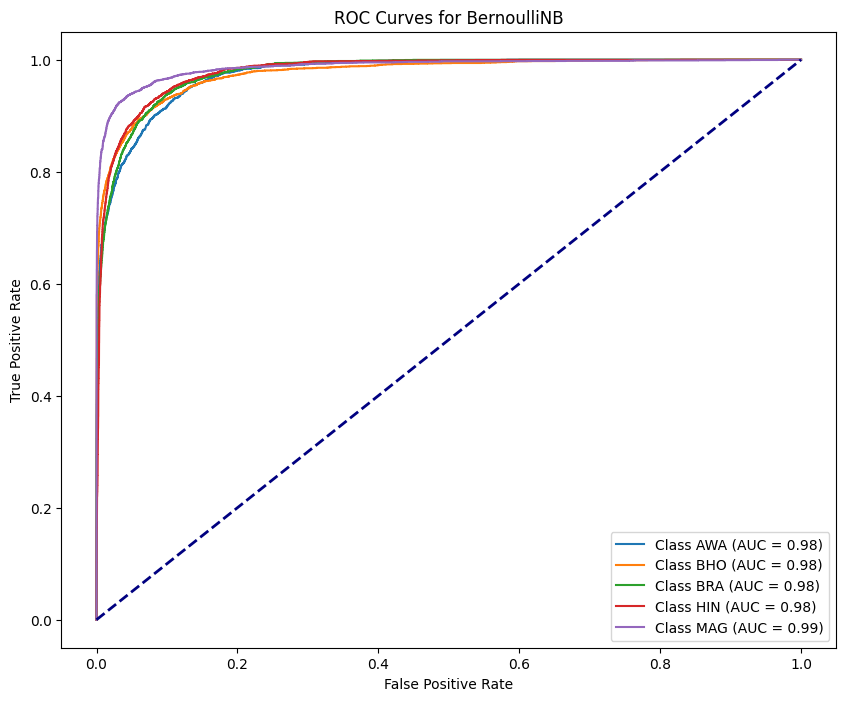

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


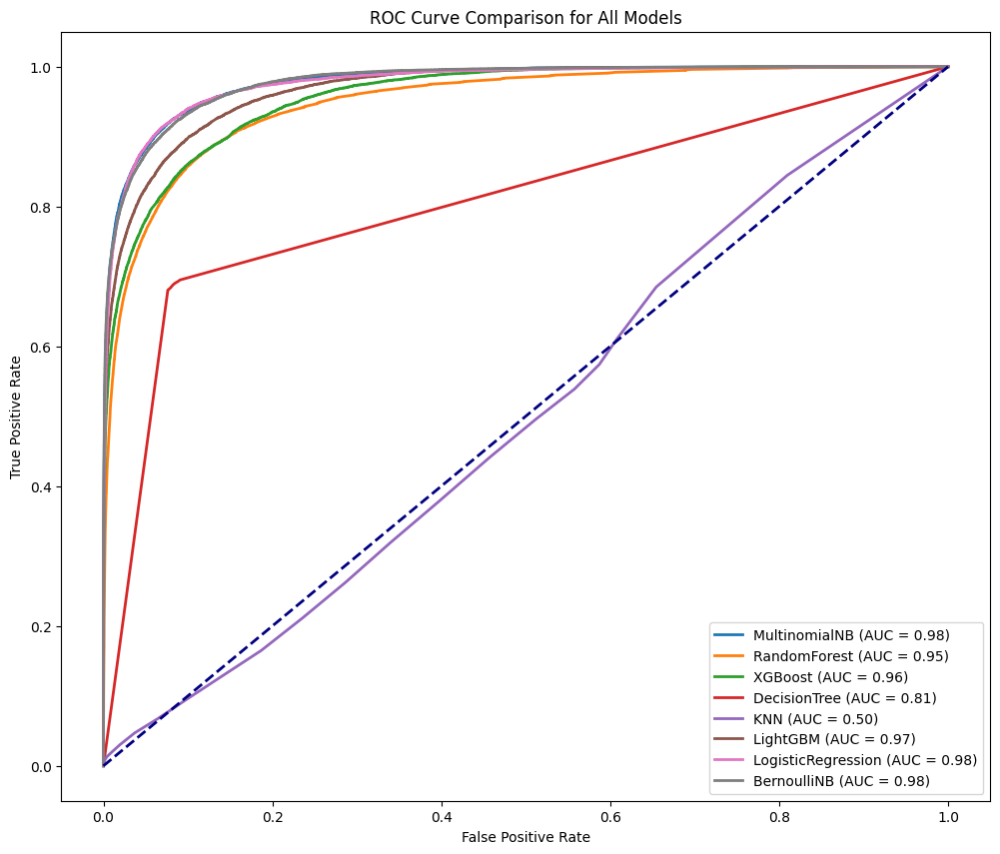

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **TomekLinks**

In [ ]:
from imblearn.under_sampling import TomekLinks

tl = TomekLinks(sampling_strategy='majority')
X_train, y_train = tl.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-270-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-270-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


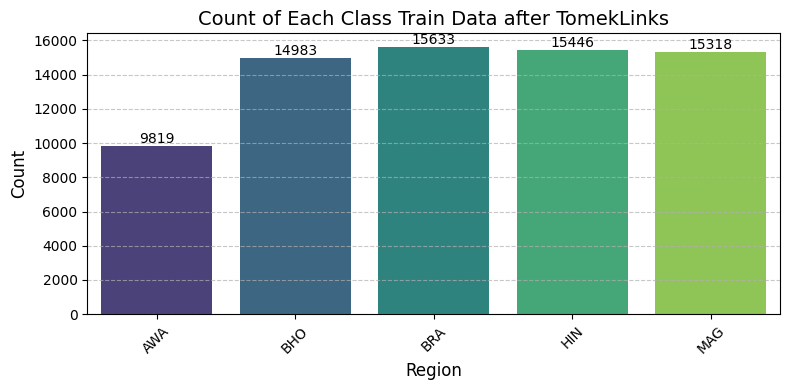

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after TomekLinks")

## Multinomial NB- 86.10%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8610025678240483
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.73      0.80      2465
           1       0.88      0.85      0.87      3753
           2       0.84      0.86      0.85      3902
           3       0.82      0.90      0.86      3854
           4       0.90      0.91      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.85      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8610025678240483
Precision: 0.8622
Recall for : 0.8610
F1 Score:  0.8603
AUC Score: 0.9794
Balanced Accuracy: 0.8515
G-mean Score: 0.9108
pf Score: 0.0351
Bal Score :  0.8986295577368384


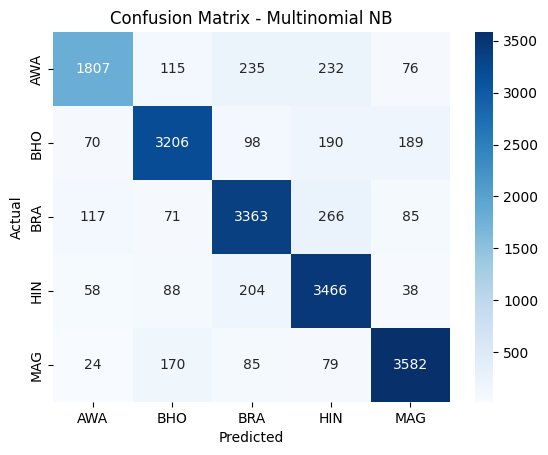

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -79.30%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7930110528078598
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.66      0.69      2465
           1       0.83      0.81      0.82      3753
           2       0.76      0.78      0.77      3902
           3       0.75      0.82      0.79      3854
           4       0.87      0.85      0.86      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.78      0.79     17914
weighted avg       0.79      0.79      0.79     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 201.39 seconds
Accuracy: 0.7930110528078598
Precision: 0.7939
Recall for : 0.7930
F1 Score:  0.7928
AUC Score: 0.9545
Balanced Accuracy: 0.7830
G-mean Score: 0.8667
pf Score: 0.0520
Bal Score :  0.8490948569090906


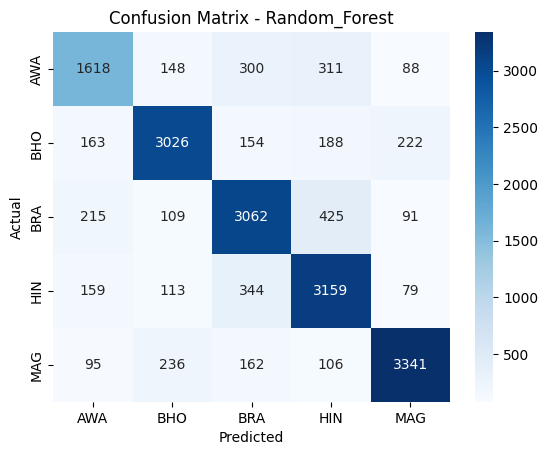

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.97%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7896617170927765
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.66      0.71      2465
           1       0.87      0.77      0.82      3753
           2       0.66      0.83      0.74      3902
           3       0.79      0.81      0.80      3854
           4       0.91      0.83      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.80      0.78      0.79     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 156.23 seconds
Accuracy: 0.7896617170927765
Precision: 0.8006
Recall for : 0.7897
F1 Score:  0.7914
AUC Score: 0.9599
Balanced Accuracy: 0.7800
G-mean Score: 0.8640
pf Score: 0.0530
Bal Score :  0.8466191541286564


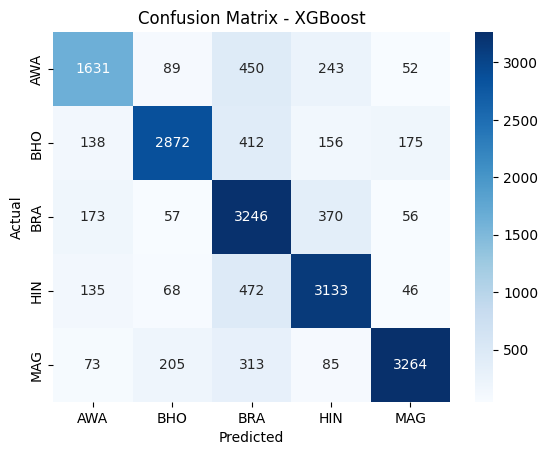

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 70.33%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7033046779055487
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.56      0.57      2465
           1       0.74      0.75      0.74      3753
           2       0.67      0.68      0.68      3902
           3       0.68      0.70      0.69      3854
           4       0.81      0.78      0.80      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.69      0.69     17914
weighted avg       0.70      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 29.38 seconds
Accuracy: 0.7033046779055487
Precision: 0.7043
Recall for : 0.7033
F1 Score:  0.7037
AUC Score: 0.8176
Balanced Accuracy: 0.6930
G-mean Score: 0.8067
pf Score: 0.0743
Bal Score :  0.7837276104988227


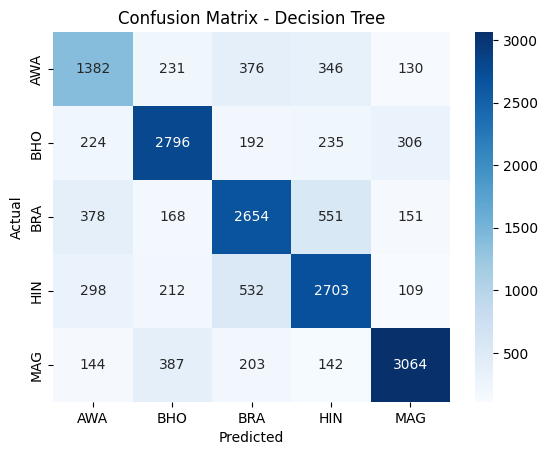

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 21.83%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.21832086636150497
Classification Report:
               precision    recall  f1-score   support

           0       0.16      0.57      0.25      2465
           1       0.24      0.54      0.33      3753
           2       0.50      0.09      0.15      3902
           3       0.63      0.01      0.02      3854
           4       0.85      0.03      0.06      3940

    accuracy                           0.22     17914
   macro avg       0.48      0.25      0.16     17914
weighted avg       0.50      0.22      0.15     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.21832086636150497
Precision: 0.5038
Recall for : 0.2183
F1 Score:  0.1520
AUC Score: 0.6030
Balanced Accuracy: 0.2463
G-mean Score: 0.4270
pf Score: 0.1893
Bal Score :  0.43128941548958244


## LightGBM Model -82.11%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 4.269118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 167863
[LightGBM] [Info] Number of data points in the train set: 71199, number of used features: 4147
[LightGBM] [Info] Start training from score -1.981159
[LightGBM] [Info] Start training from score -1.558563
[LightGBM] [Info] Start training from score -1.516095
[LightGBM] [Info] Start training from score -1.528129
[LightGBM] [Info] Start training from score -1.536450


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8210896505526404
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.72      0.75      2465
           1       0.87      0.81      0.84      3753
           2       0.74      0.84      0.79      3902
           3       0.80      0.84      0.82      3854
           4       0.91      0.86      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.82      0.81      0.82     17914
weighted avg       0.83      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 74.46 seconds
Accuracy: 0.8210896505526404
Precision: 0.8250
Recall for : 0.8211
F1 Score:  0.8218
AUC Score: 0.9701
Balanced Accuracy: 0.8138
G-mean Score: 0.8851
pf Score: 0.0450
Bal Score :  0.869556003931651


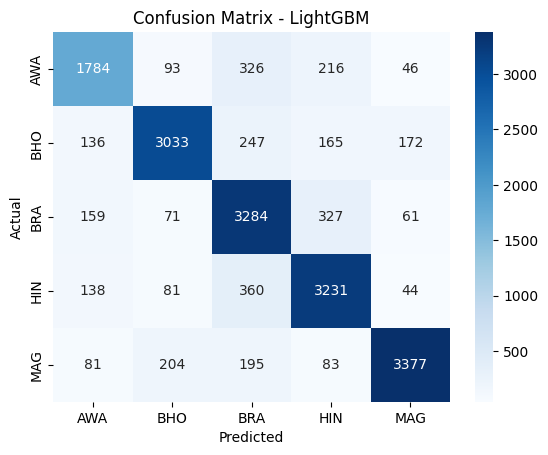

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 86.28%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8627888802054259
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.77      0.80      2465
           1       0.88      0.86      0.87      3753
           2       0.83      0.87      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.93      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 10.27 seconds
Accuracy: 0.8627888802054259
Precision: 0.8638
Recall for : 0.8628
F1 Score:  0.8628
AUC Score: 0.9785
Balanced Accuracy: 0.8560
G-mean Score: 0.9124
pf Score: 0.0345
Bal Score :  0.8999600133734756


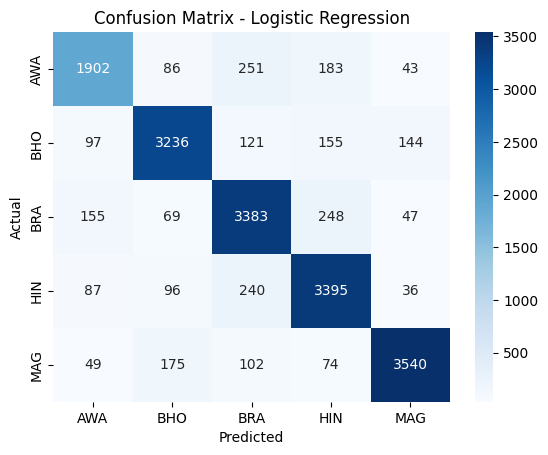

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.69%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8568717204421124
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.84      0.79      2465
           1       0.93      0.80      0.86      3753
           2       0.83      0.87      0.85      3902
           3       0.90      0.84      0.87      3854
           4       0.87      0.93      0.90      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.04 seconds
Accuracy: 0.8568717204421124
Precision: 0.8617
Recall for : 0.8569
F1 Score:  0.8573
AUC Score: 0.9808
Balanced Accuracy: 0.8550
G-mean Score: 0.9094
pf Score: 0.0356
Bal Score :  0.8957110722197921


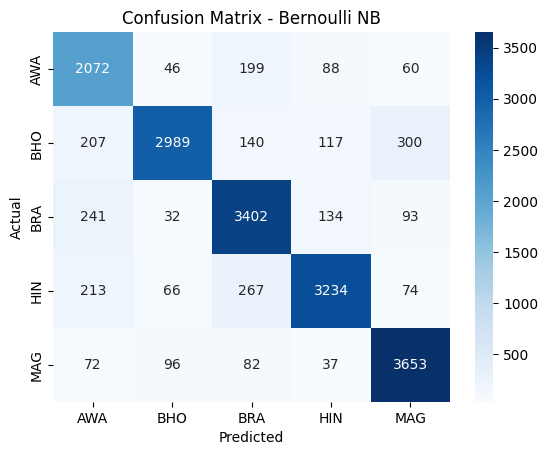

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

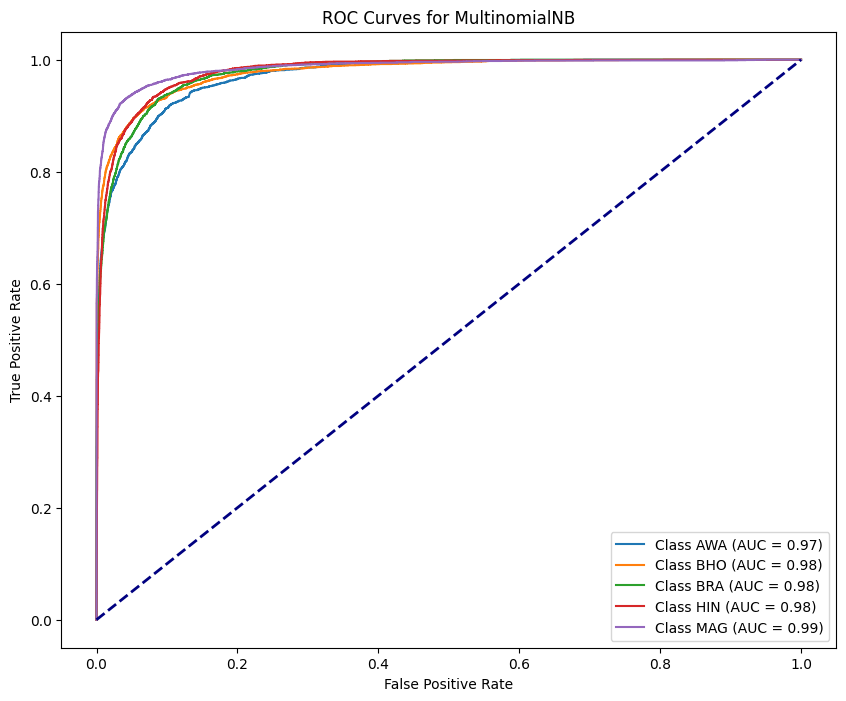

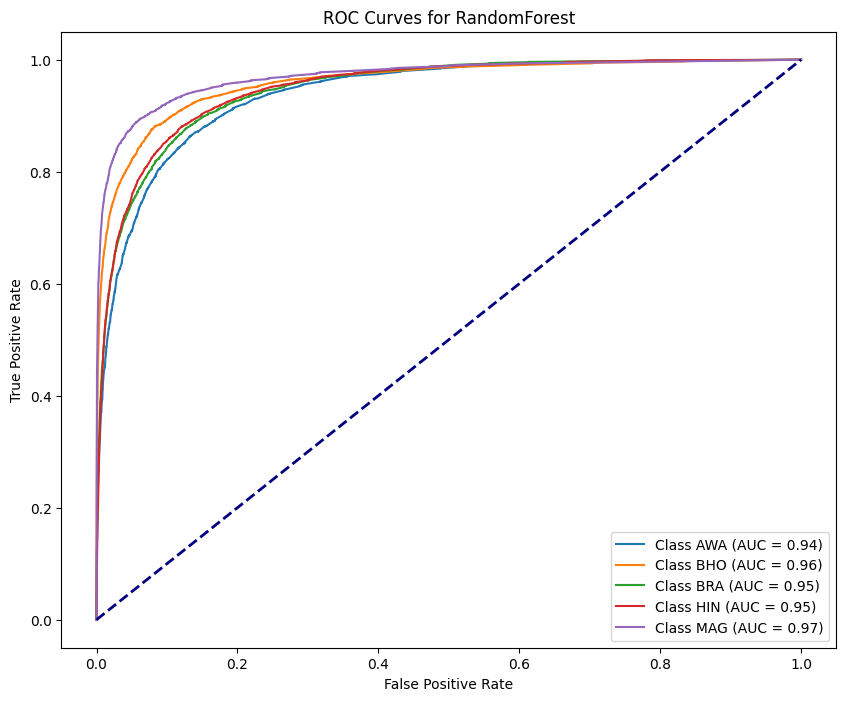

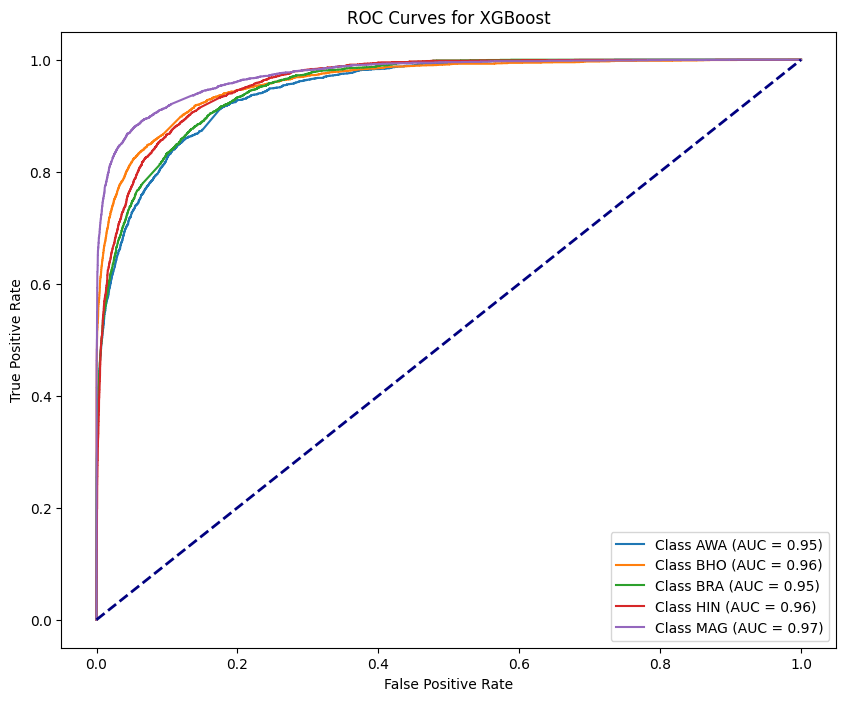

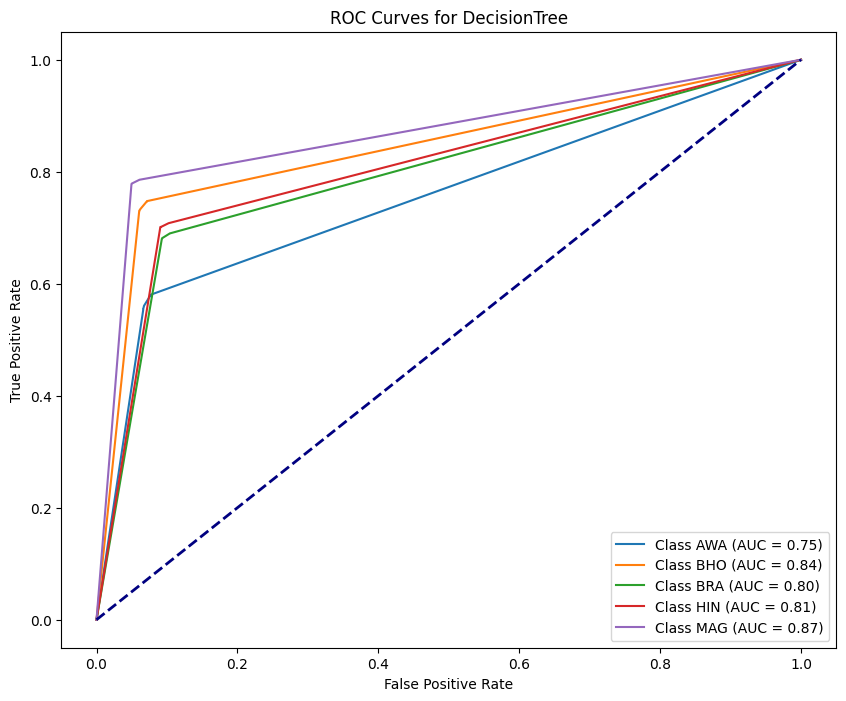

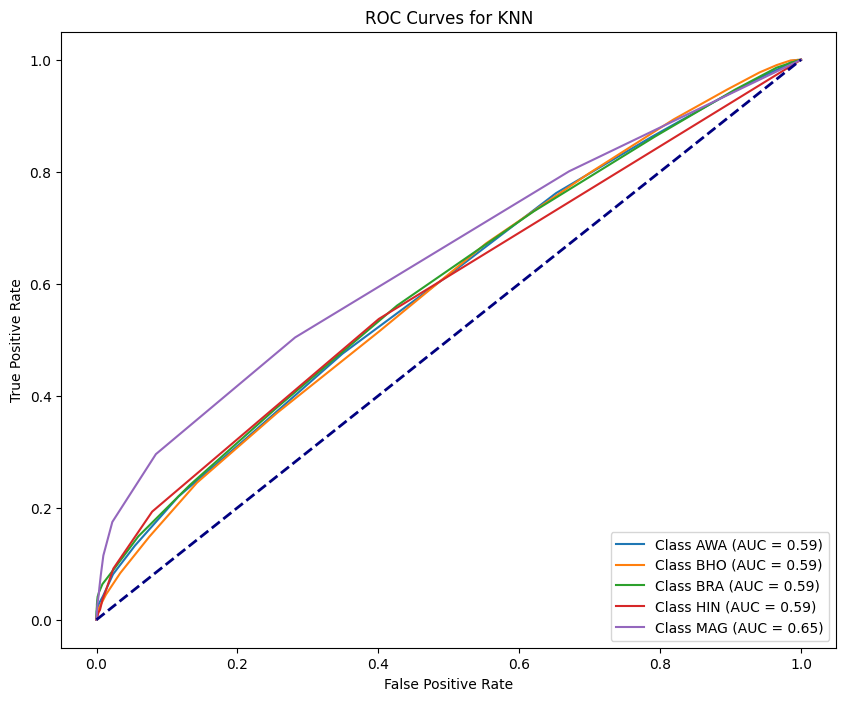

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


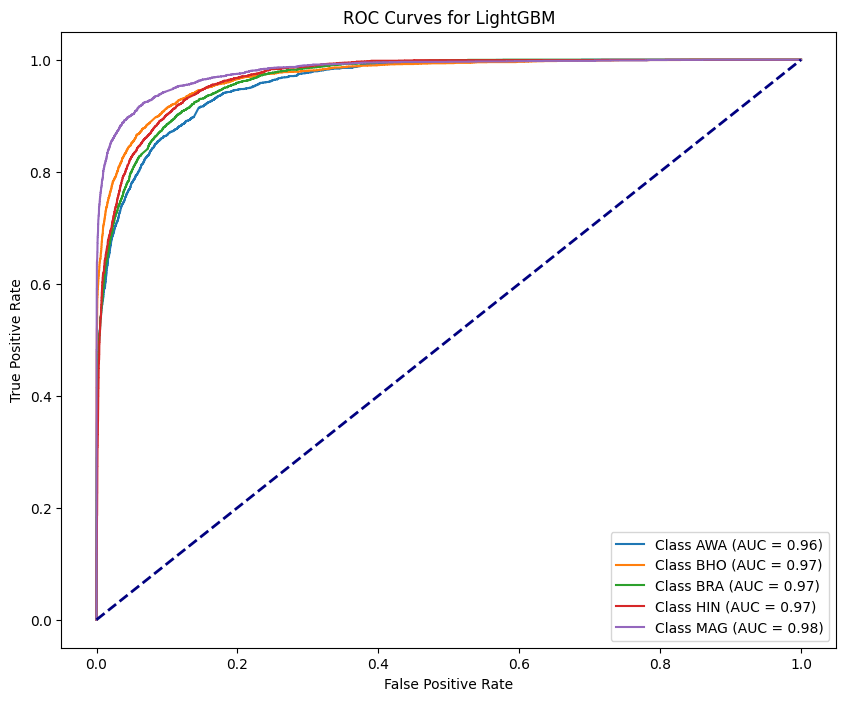

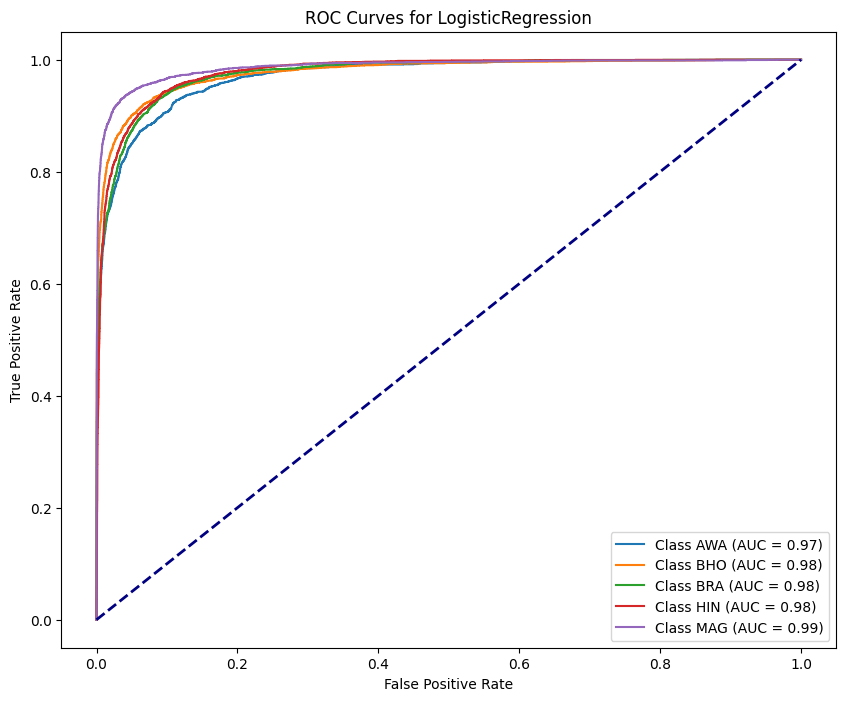

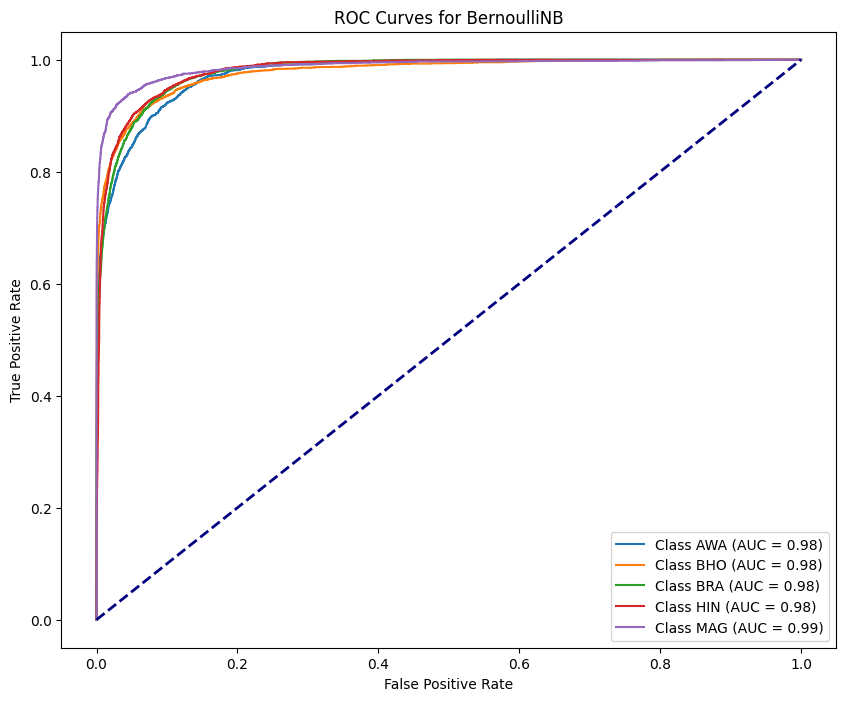

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


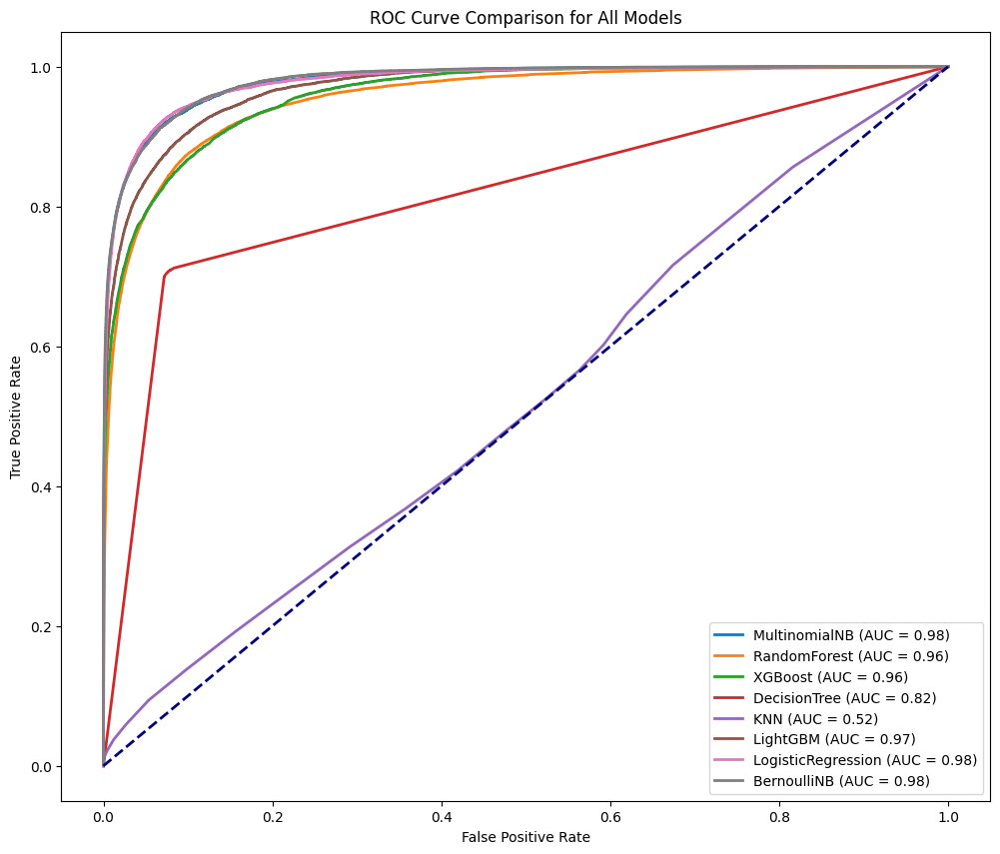

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **NearMiss**

In [ ]:
from imblearn.under_sampling import NearMiss

In [ ]:
nm = NearMiss()
X_train, y_train = nm.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-319-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-319-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


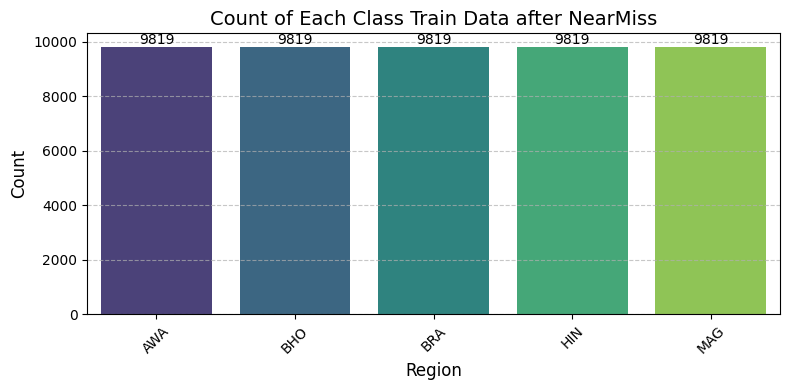

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after NearMiss")

## Multinomial NB- 86.06%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8605559897287038
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.83      0.79      2465
           1       0.89      0.85      0.87      3753
           2       0.87      0.83      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.91      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8605559897287038
Precision: 0.8626
Recall for : 0.8606
F1 Score:  0.8611
AUC Score: 0.9787
Balanced Accuracy: 0.8580
G-mean Score: 0.9117
pf Score: 0.0347
Bal Score :  0.8983891720967144


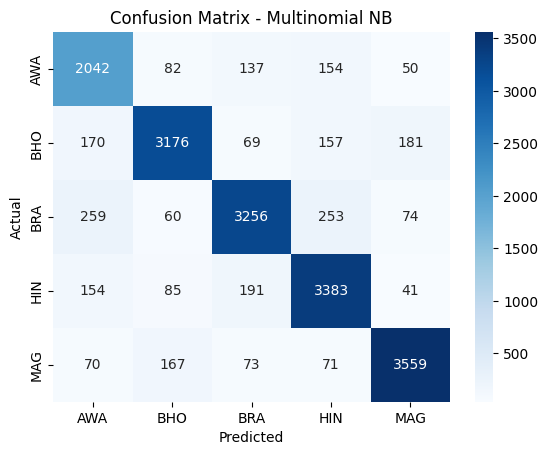

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -77.81%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7780506866138216
Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.76      0.67      2465
           1       0.83      0.78      0.80      3753
           2       0.78      0.74      0.76      3902
           3       0.77      0.78      0.77      3854
           4       0.88      0.83      0.85      3940

    accuracy                           0.78     17914
   macro avg       0.77      0.78      0.77     17914
weighted avg       0.79      0.78      0.78     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 114.66 seconds
Accuracy: 0.7780506866138216
Precision: 0.7864
Recall for : 0.7781
F1 Score:  0.7805
AUC Score: 0.9512
Balanced Accuracy: 0.7766
G-mean Score: 0.8583
pf Score: 0.0550
Bal Score :  0.8383095747990129


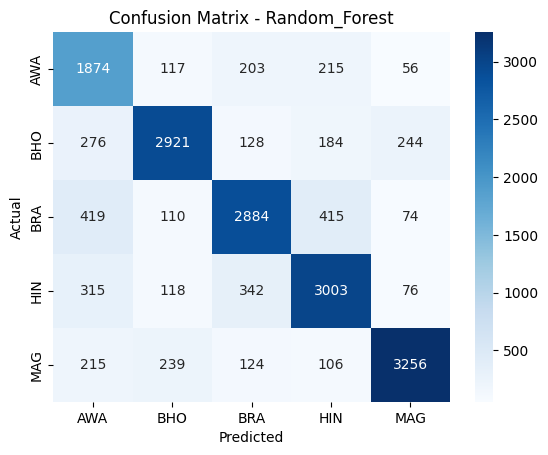

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.37%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.783744557329463
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.75      0.70      2465
           1       0.88      0.75      0.81      3753
           2       0.68      0.80      0.74      3902
           3       0.80      0.79      0.80      3854
           4       0.92      0.81      0.86      3940

    accuracy                           0.78     17914
   macro avg       0.79      0.78      0.78     17914
weighted avg       0.80      0.78      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 112.54 seconds
Accuracy: 0.783744557329463
Precision: 0.7964
Recall for : 0.7837
F1 Score:  0.7869
AUC Score: 0.9589
Balanced Accuracy: 0.7813
G-mean Score: 0.8615
pf Score: 0.0539
Bal Score :  0.8424115291848915


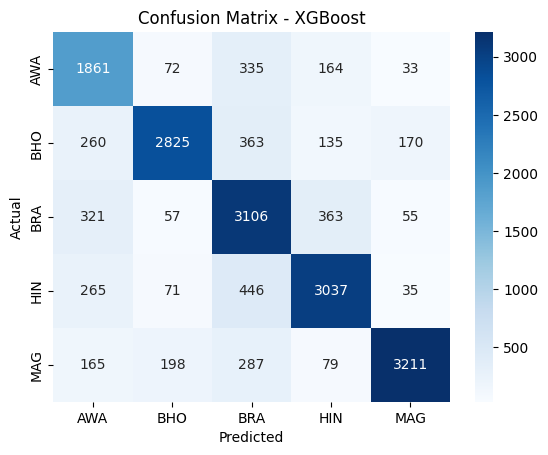

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 68.90%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6890141788545272
Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.63      0.56      2465
           1       0.73      0.72      0.73      3753
           2       0.68      0.64      0.66      3902
           3       0.68      0.67      0.67      3854
           4       0.81      0.77      0.79      3940

    accuracy                           0.69     17914
   macro avg       0.68      0.68      0.68     17914
weighted avg       0.70      0.69      0.69     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 15.56 seconds
Accuracy: 0.6890141788545272
Precision: 0.6961
Recall for : 0.6890
F1 Score:  0.6914
AUC Score: 0.8104
Balanced Accuracy: 0.6844
G-mean Score: 0.7980
pf Score: 0.0774
Bal Score :  0.773399036058014


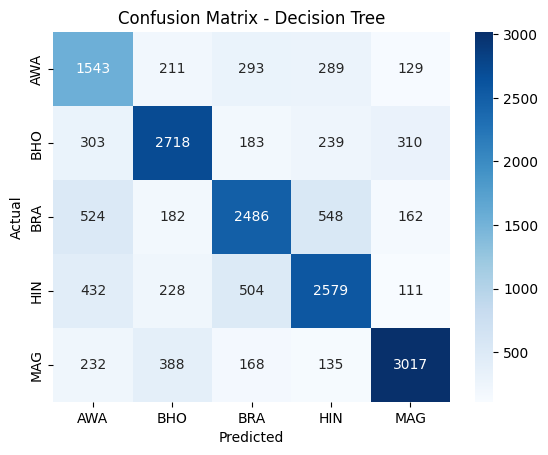

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 21.20%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.21195712850284693
Classification Report:
               precision    recall  f1-score   support

           0       0.17      0.34      0.22      2465
           1       0.22      0.57      0.32      3753
           2       0.25      0.20      0.22      3902
           3       0.49      0.00      0.01      3854
           4       0.68      0.01      0.02      3940

    accuracy                           0.21     17914
   macro avg       0.36      0.22      0.16     17914
weighted avg       0.38      0.21      0.15     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.21195712850284693
Precision: 0.3773
Recall for : 0.2120
F1 Score:  0.1520
AUC Score: 0.5571
Balanced Accuracy: 0.2237
G-mean Score: 0.4153
pf Score: 0.1949
Bal Score :  0.4259884038962052


## LightGBM Model -81.56%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.944827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116317
[LightGBM] [Info] Number of data points in the train set: 49095, number of used features: 3088
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8156190688846712
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.78      0.74      2465
           1       0.87      0.80      0.84      3753
           2       0.76      0.81      0.79      3902
           3       0.82      0.82      0.82      3854
           4       0.91      0.85      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.81      0.81      0.81     17914
weighted avg       0.82      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 48.50 seconds
Accuracy: 0.8156190688846712
Precision: 0.8207
Recall for : 0.8156
F1 Score:  0.8171
AUC Score: 0.9686
Balanced Accuracy: 0.8129
G-mean Score: 0.8824
pf Score: 0.0460
Bal Score :  0.8656346456313004


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

48.4994
0.8156
0.8207
0.8156
0.8171
0.9686
0.8129
0.8824
0.0460
0.8656


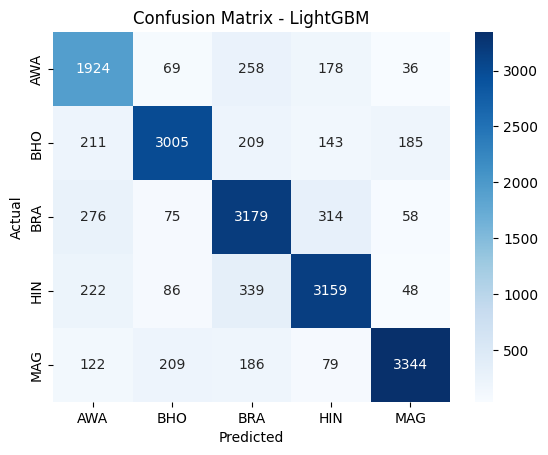

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 85.67%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8567042536563582
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.82      0.79      2465
           1       0.89      0.85      0.87      3753
           2       0.83      0.84      0.84      3902
           3       0.84      0.86      0.85      3854
           4       0.93      0.89      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 4.74 seconds
Accuracy: 0.8567042536563582
Precision: 0.8584
Recall for : 0.8567
F1 Score:  0.8573
AUC Score: 0.9768
Balanced Accuracy: 0.8538
G-mean Score: 0.9090
pf Score: 0.0358
Bal Score :  0.8955662041324195


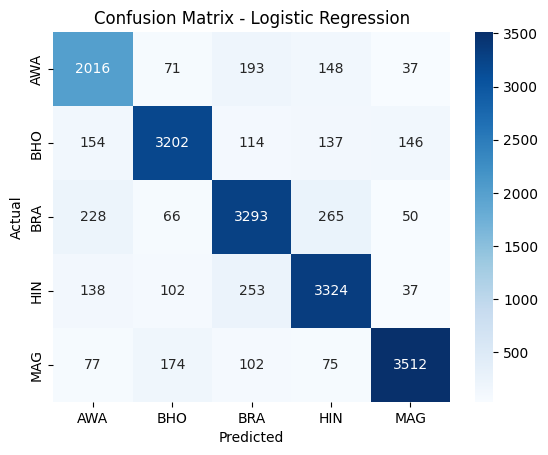

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.29%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8528525175840125
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.87      0.77      2465
           1       0.93      0.79      0.86      3753
           2       0.85      0.85      0.85      3902
           3       0.90      0.83      0.86      3854
           4       0.88      0.92      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.85     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8528525175840125
Precision: 0.8617
Recall for : 0.8529
F1 Score:  0.8543
AUC Score: 0.9802
Balanced Accuracy: 0.8535
G-mean Score: 0.9075
pf Score: 0.0363
Bal Score :  0.892831591552853


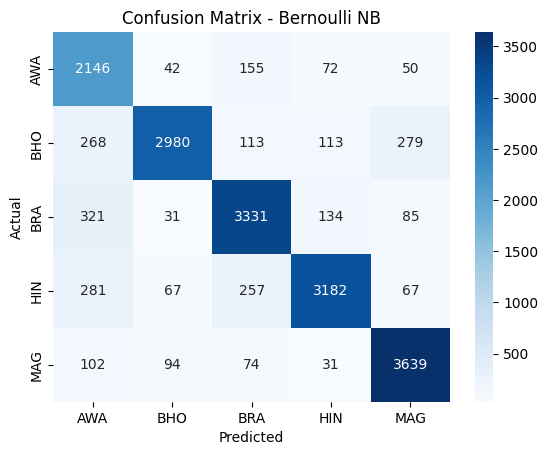

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

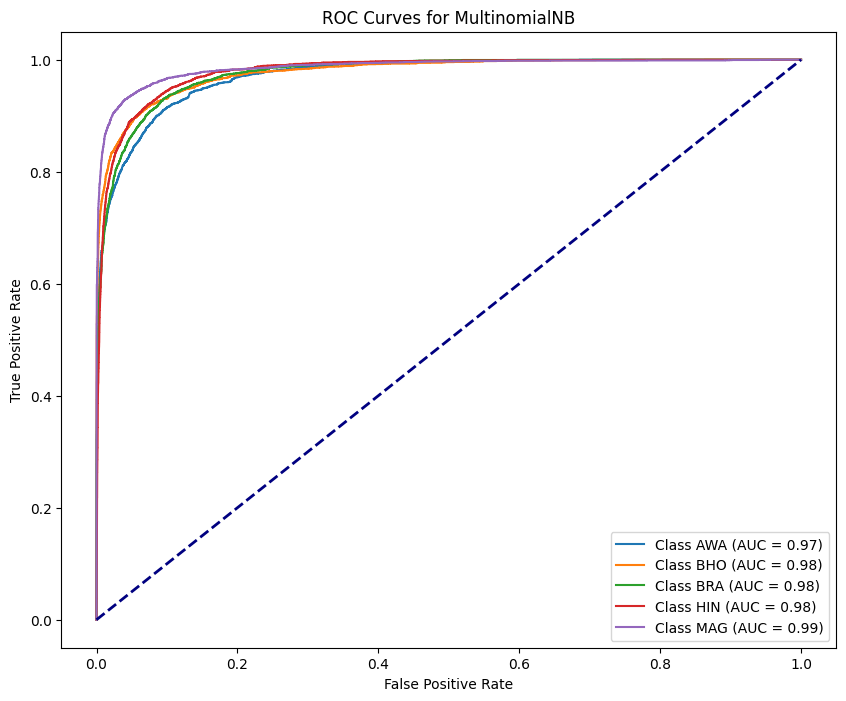

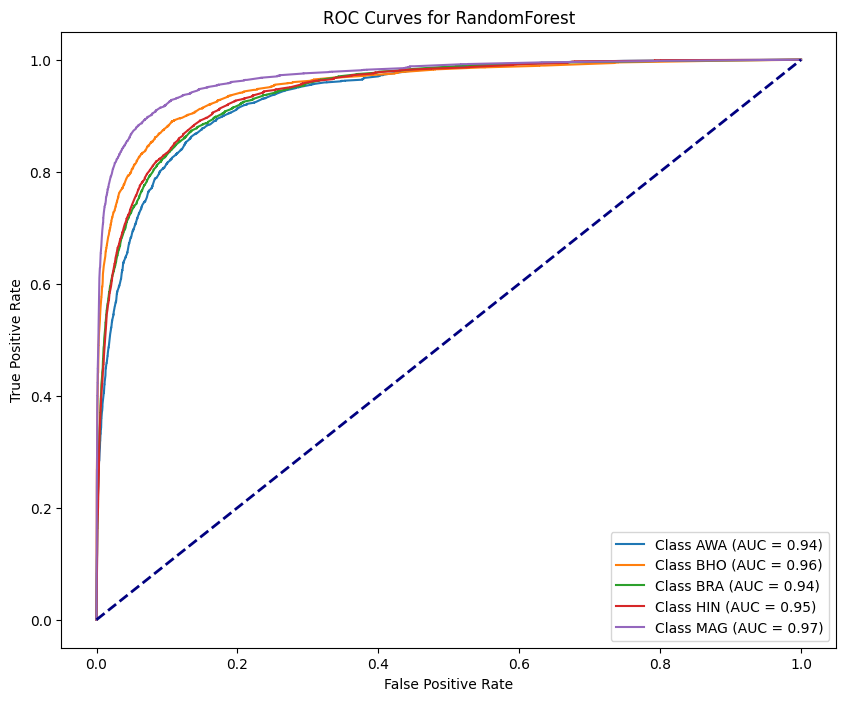

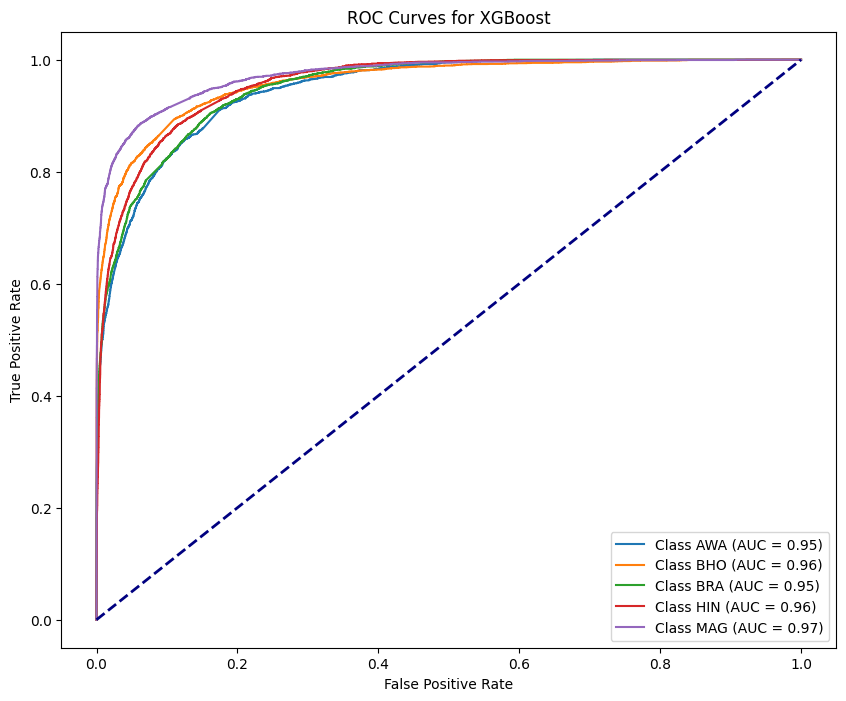

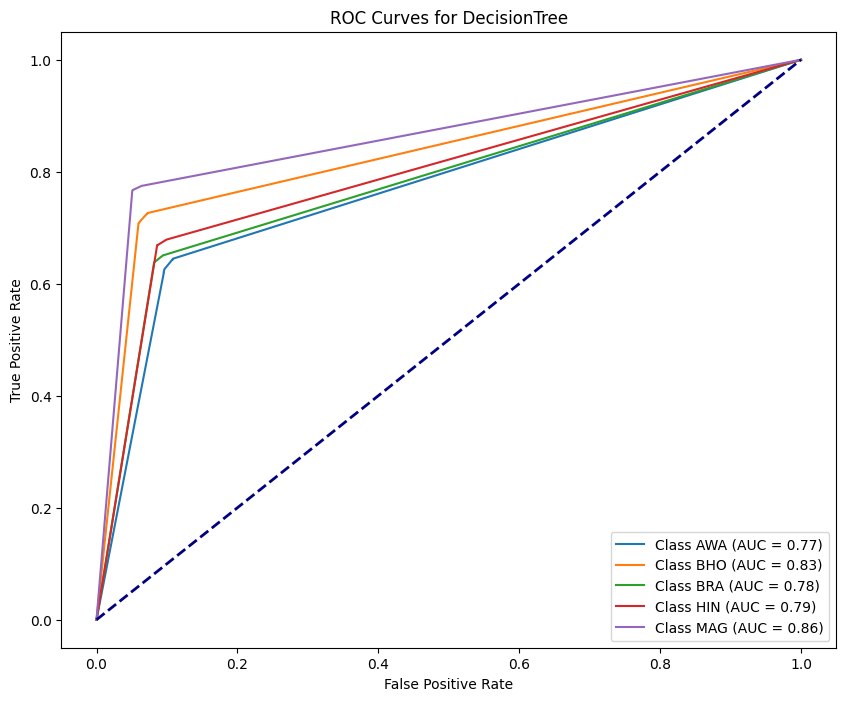

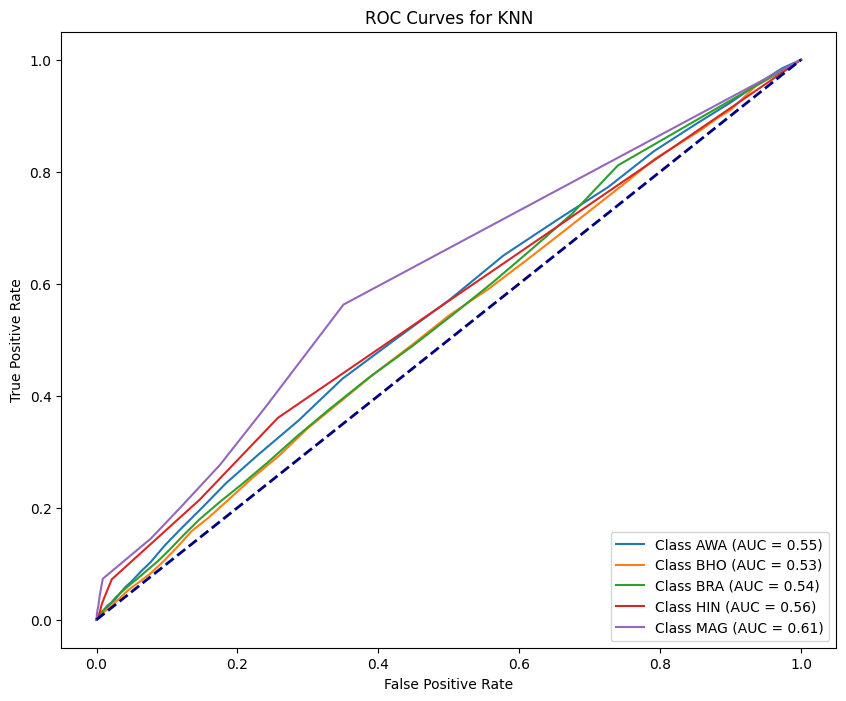

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


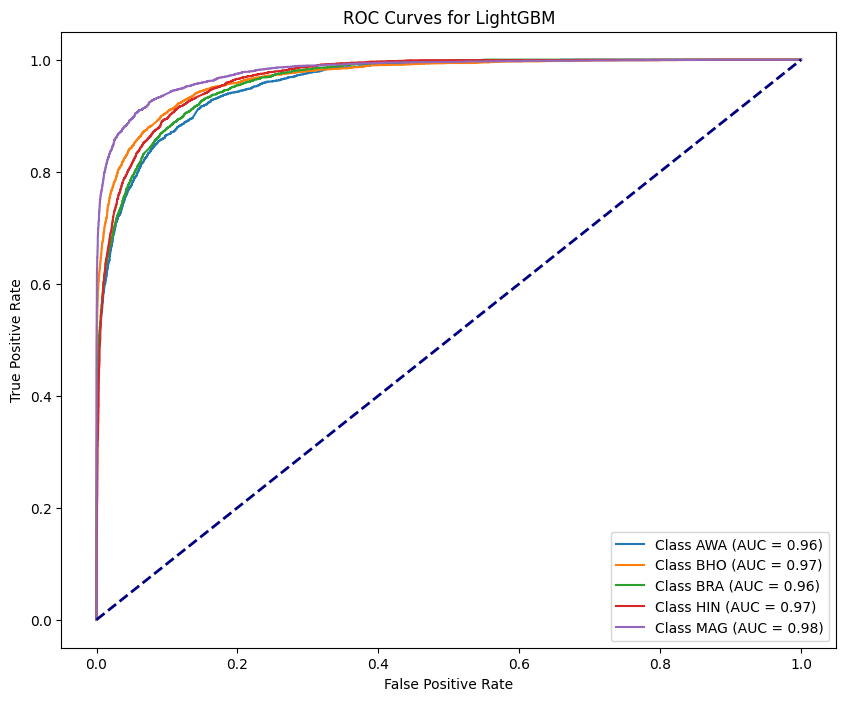

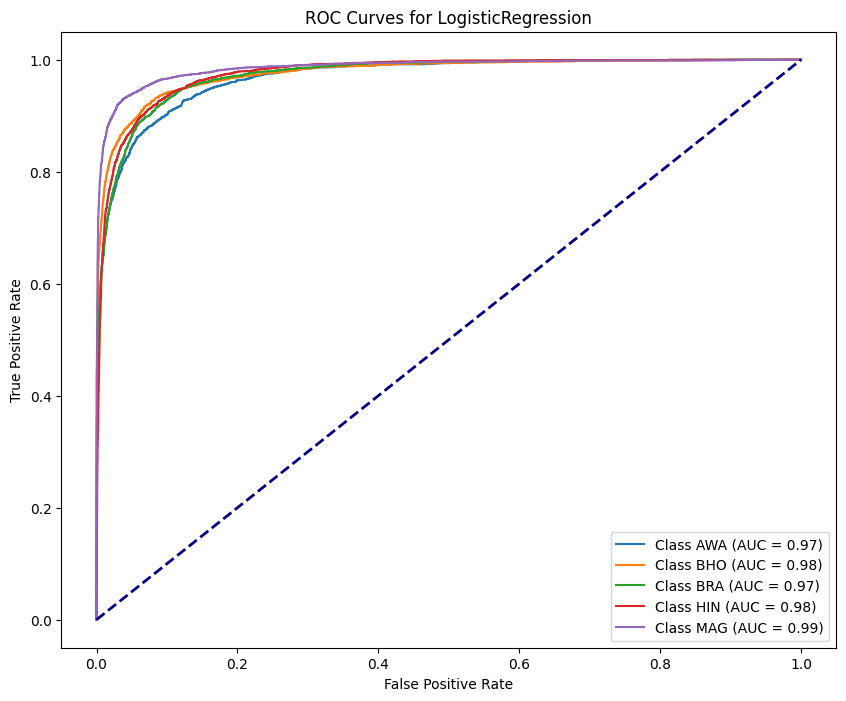

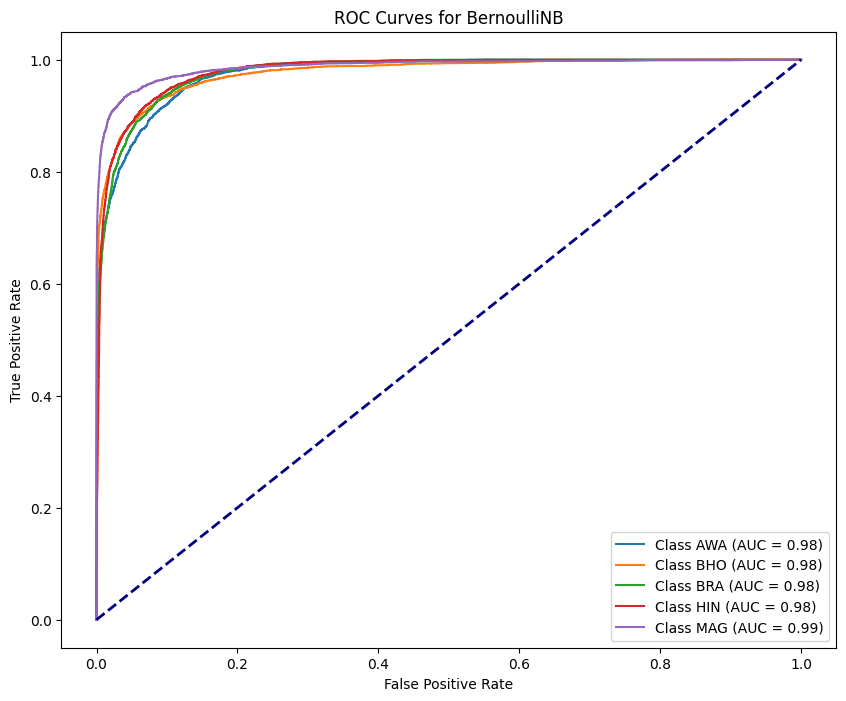

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


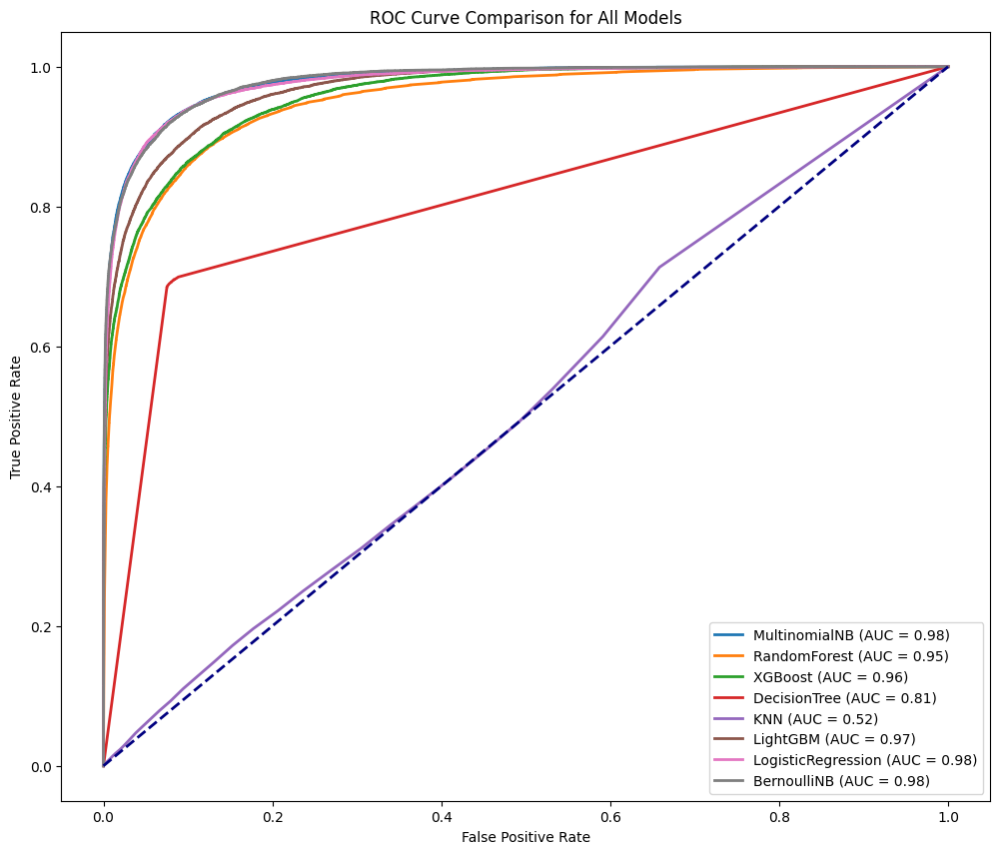

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **HyBrid Sampling SMOTETomek**

In [ ]:
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
# Define SMOTE-Tomek Links
resample=SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'))
X_train, y_train = resample.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-367-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-367-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


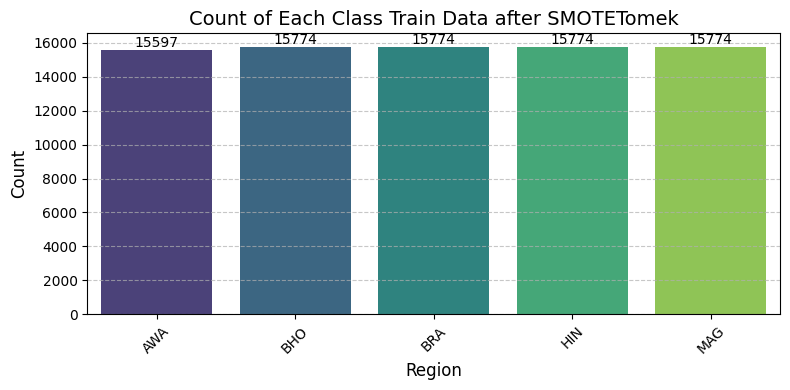

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTETomek")

## Multinomial NB- 86.06%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8606118119906219
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.82      0.79      2465
           1       0.88      0.85      0.86      3753
           2       0.87      0.84      0.86      3902
           3       0.84      0.88      0.86      3854
           4       0.91      0.90      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.86      0.86      0.86     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.8606118119906219
Precision: 0.8621
Recall for : 0.8606
F1 Score:  0.8610
AUC Score: 0.9793
Balanced Accuracy: 0.8575
G-mean Score: 0.9116
pf Score: 0.0347
Bal Score :  0.8984214438233405


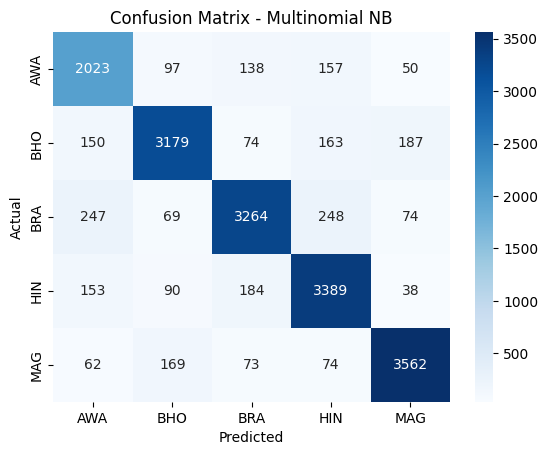

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -78.75%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7875404711398906
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.73      0.68      2465
           1       0.85      0.78      0.81      3753
           2       0.78      0.76      0.77      3902
           3       0.77      0.80      0.78      3854
           4       0.88      0.84      0.86      3940

    accuracy                           0.79     17914
   macro avg       0.78      0.78      0.78     17914
weighted avg       0.79      0.79      0.79     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 227.38 seconds
Accuracy: 0.7875404711398906
Precision: 0.7926
Recall for : 0.7875
F1 Score:  0.7892
AUC Score: 0.9532
Balanced Accuracy: 0.7834
G-mean Score: 0.8642
pf Score: 0.0528
Bal Score :  0.845192600163271


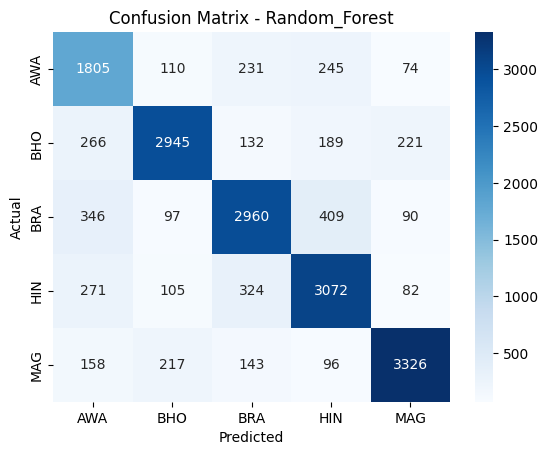

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 79.05%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7904990510215474
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.73      0.70      2465
           1       0.87      0.76      0.81      3753
           2       0.70      0.81      0.75      3902
           3       0.81      0.80      0.80      3854
           4       0.91      0.83      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.79      0.79     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 168.51 seconds
Accuracy: 0.7904990510215474
Precision: 0.8000
Recall for : 0.7905
F1 Score:  0.7929
AUC Score: 0.9597
Balanced Accuracy: 0.7860
G-mean Score: 0.8657
pf Score: 0.0523
Bal Score :  0.8473185295343832


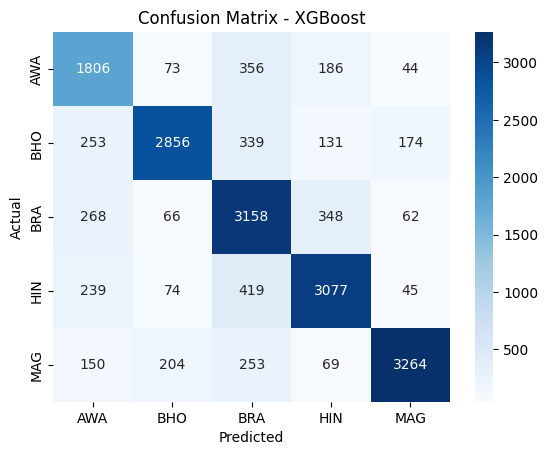

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 70.05%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7004577425477281
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.59      0.57      2465
           1       0.76      0.72      0.74      3753
           2       0.68      0.68      0.68      3902
           3       0.68      0.69      0.69      3854
           4       0.81      0.78      0.79      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.69      0.69     17914
weighted avg       0.70      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 31.94 seconds
Accuracy: 0.7004577425477281
Precision: 0.7039
Recall for : 0.7005
F1 Score:  0.7019
AUC Score: 0.8164
Balanced Accuracy: 0.6926
G-mean Score: 0.8052
pf Score: 0.0748
Bal Score :  0.7816923494306816


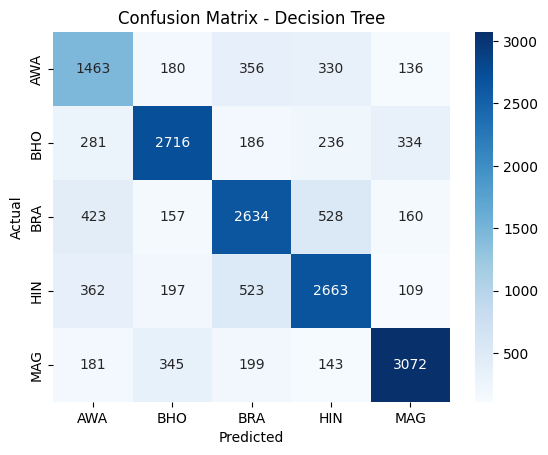

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 17.07%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.17070447694540583
Classification Report:
               precision    recall  f1-score   support

           0       0.14      0.99      0.25      2465
           1       0.78      0.12      0.20      3753
           2       0.92      0.03      0.05      3902
           3       0.74      0.01      0.01      3854
           4       0.82      0.01      0.02      3940

    accuracy                           0.17     17914
   macro avg       0.68      0.23      0.11     17914
weighted avg       0.72      0.17      0.10     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.17070447694540583
Precision: 0.7217
Recall for : 0.1707
F1 Score:  0.0955
AUC Score: 0.7572
Balanced Accuracy: 0.2308
G-mean Score: 0.3847
pf Score: 0.1925
Bal Score :  0.3980081931328143


## LightGBM Model -81.97%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 4.248313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181280
[LightGBM] [Info] Number of data points in the train set: 78693, number of used features: 4380
[LightGBM] [Info] Start training from score -1.618476
[LightGBM] [Info] Start training from score -1.607191
[LightGBM] [Info] Start training from score -1.607191
[LightGBM] [Info] Start training from score -1.607191
[LightGBM] [Info] Start training from score -1.607191


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8197499162666071
Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.77      0.74      2465
           1       0.88      0.81      0.84      3753
           2       0.77      0.82      0.79      3902
           3       0.81      0.83      0.82      3854
           4       0.91      0.86      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.82      0.82      0.81     17914
weighted avg       0.82      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 79.57 seconds
Accuracy: 0.8197499162666071
Precision: 0.8242
Recall for : 0.8197
F1 Score:  0.8211
AUC Score: 0.9699
Balanced Accuracy: 0.8160
G-mean Score: 0.8850
pf Score: 0.0450
Bal Score :  0.868638966555888


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

79.5677
0.8197
0.8242
0.8197
0.8211
0.9699
0.8160
0.8850
0.0450
0.8686


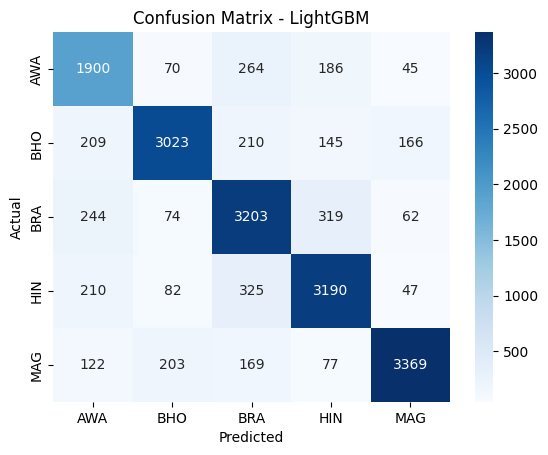

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 85.89%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8589371441330803
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.83      0.78      2465
           1       0.89      0.85      0.87      3753
           2       0.85      0.84      0.85      3902
           3       0.85      0.87      0.86      3854
           4       0.93      0.89      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 10.42 seconds
Accuracy: 0.8589371441330803
Precision: 0.8620
Recall for : 0.8589
F1 Score:  0.8599
AUC Score: 0.9781
Balanced Accuracy: 0.8564
G-mean Score: 0.9109
pf Score: 0.0350
Bal Score :  0.8972265097223228


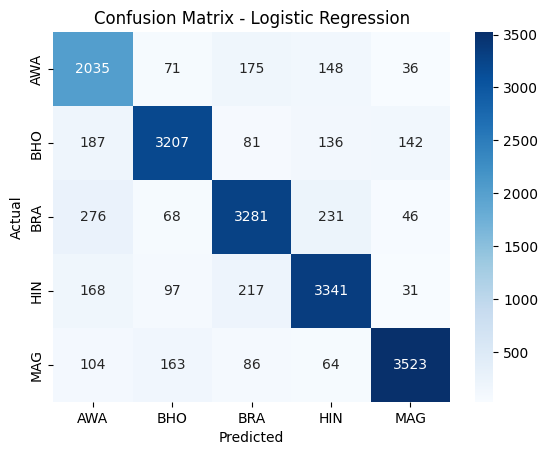

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.40%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8539689628223736
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.87      0.77      2465
           1       0.93      0.79      0.85      3753
           2       0.85      0.85      0.85      3902
           3       0.90      0.83      0.87      3854
           4       0.88      0.93      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.86     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.05 seconds
Accuracy: 0.8539689628223736
Precision: 0.8628
Recall for : 0.8540
F1 Score:  0.8553
AUC Score: 0.9806
Balanced Accuracy: 0.8544
G-mean Score: 0.9082
pf Score: 0.0360
Bal Score :  0.8936459051644088


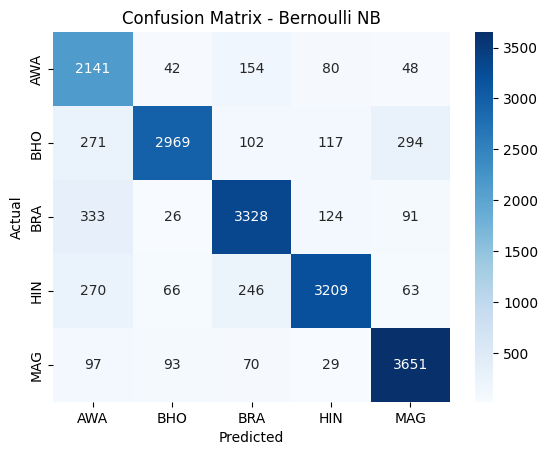

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

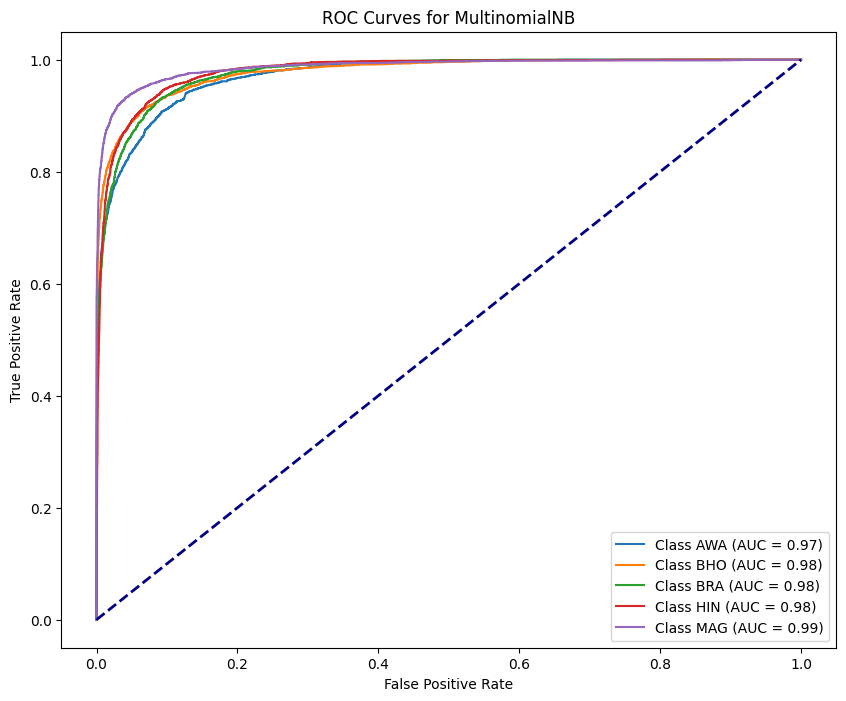

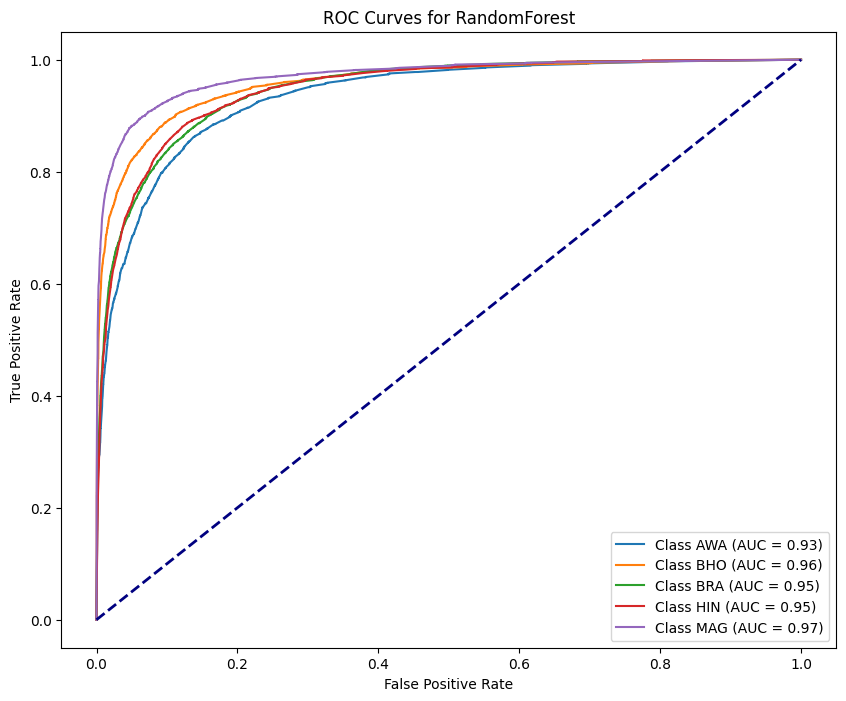

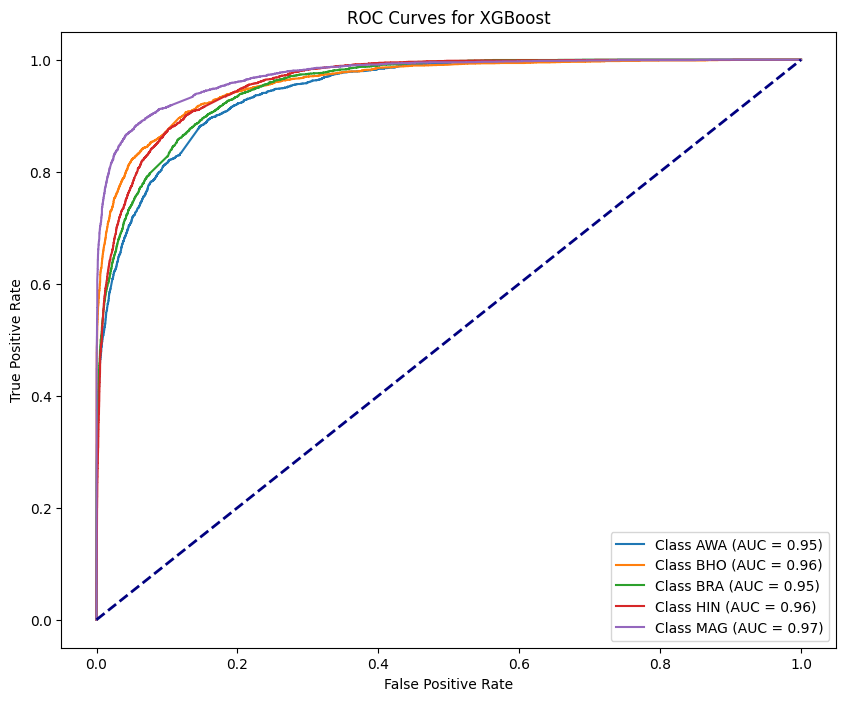

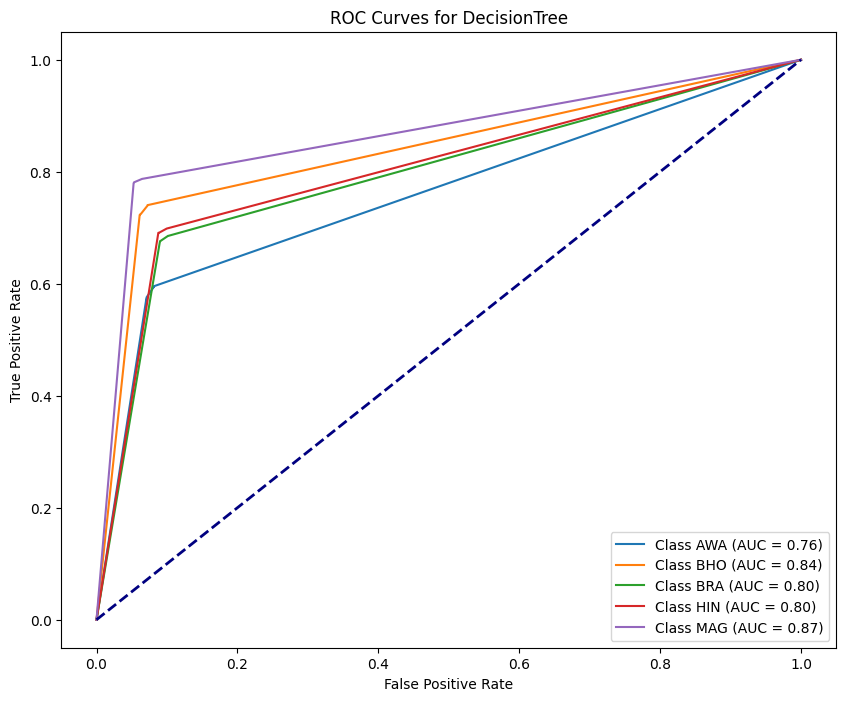

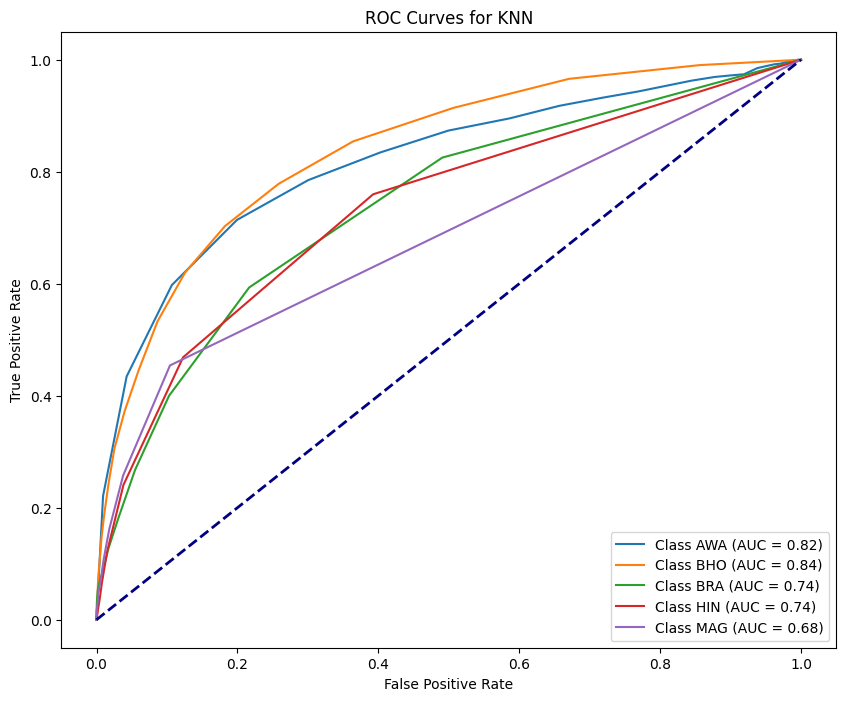

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


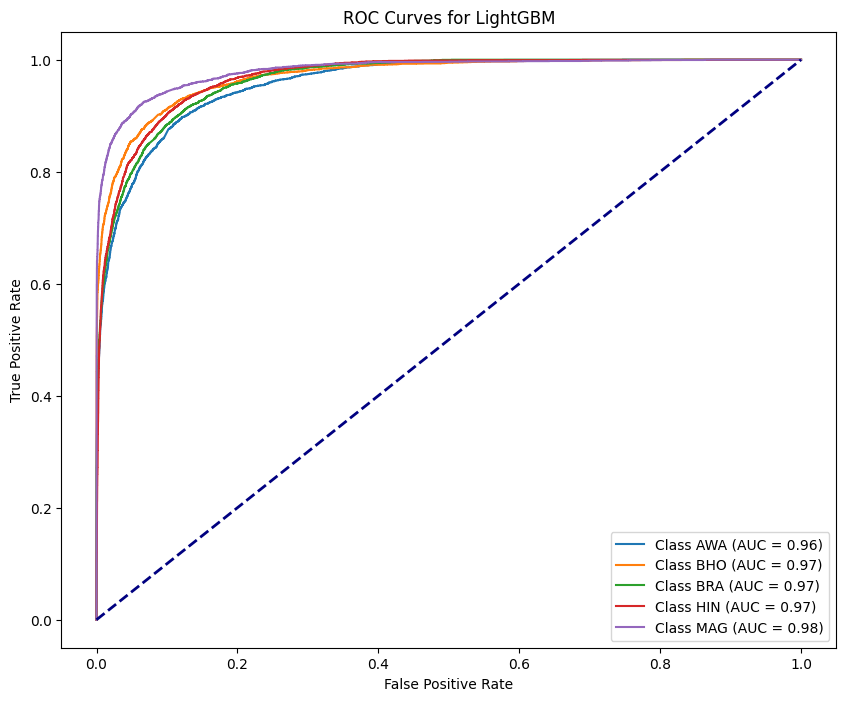

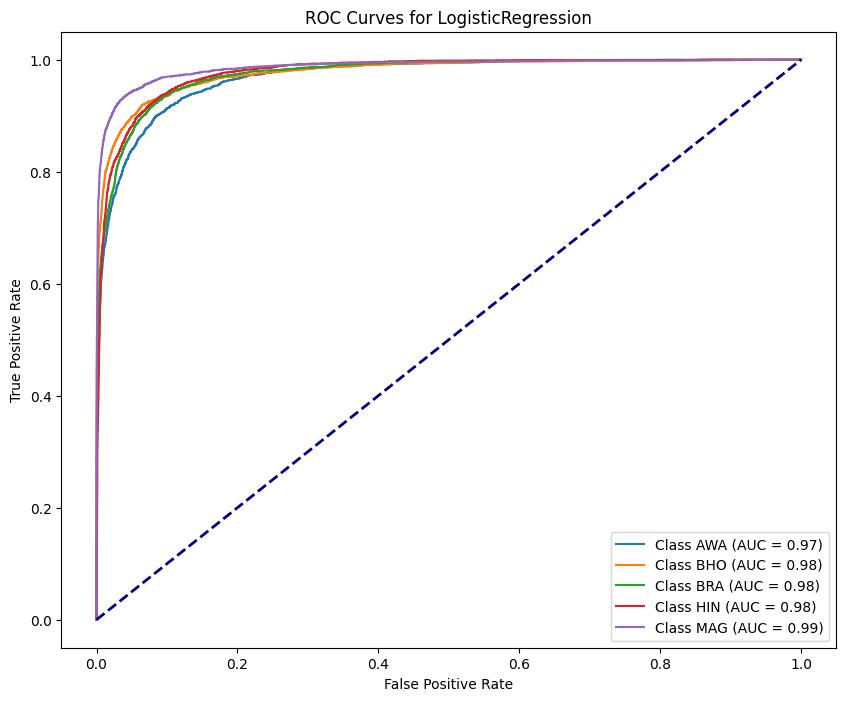

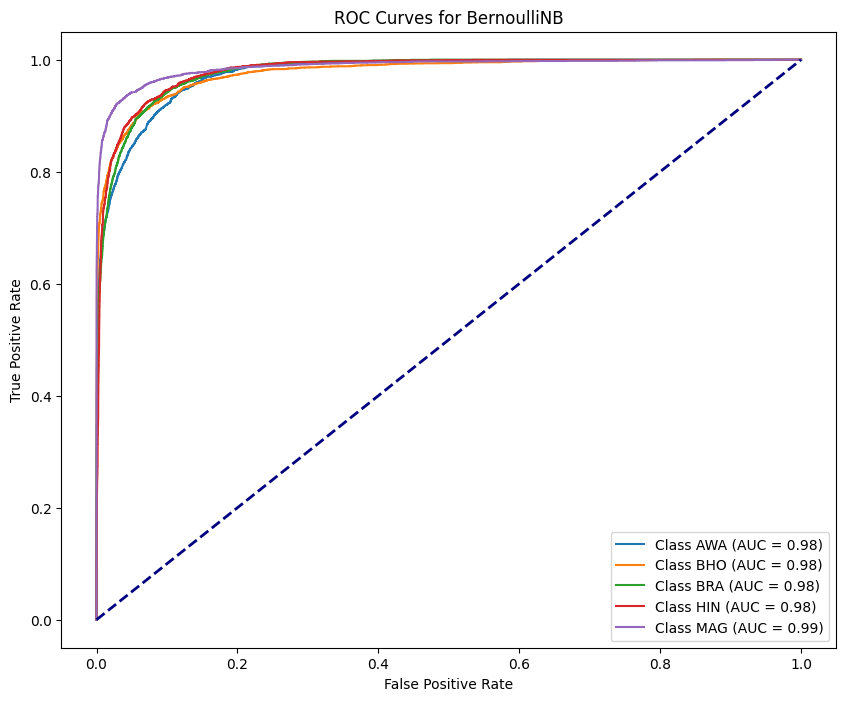

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


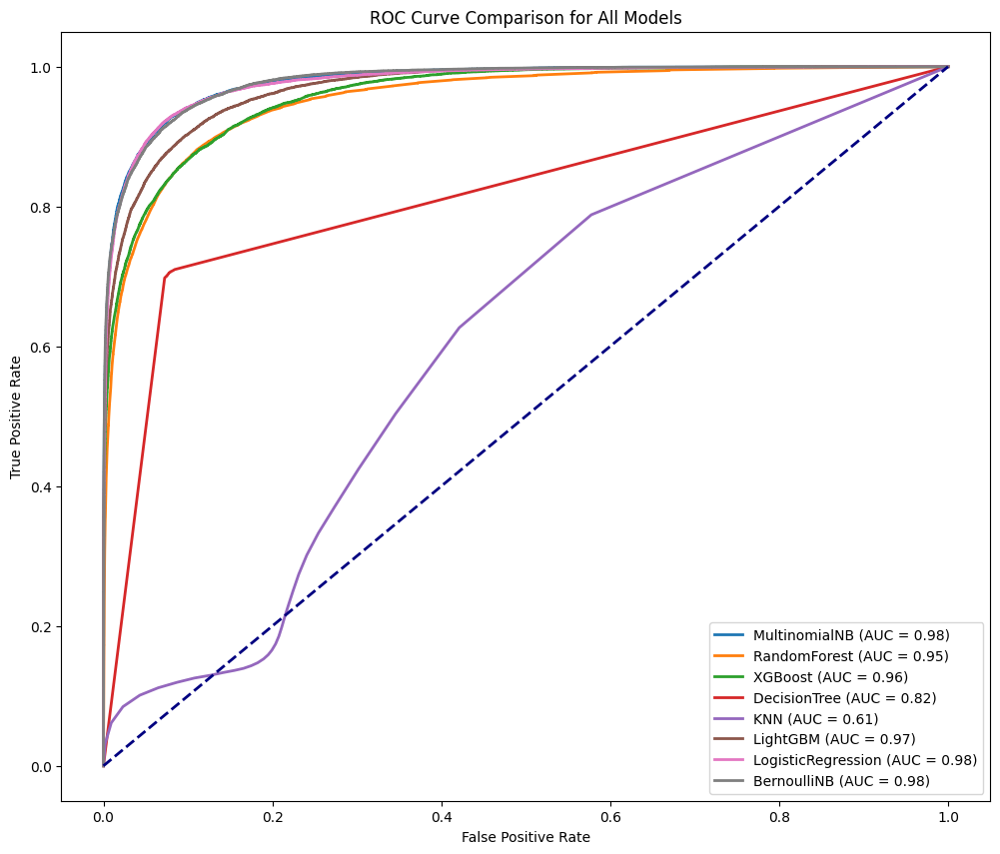

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ROS-RUS**

In [ ]:
import numpy as np
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter
label_counts = Counter(y)
unique_labels = np.unique(y)
minority_class_label = unique_labels[np.argmin([label_counts[label] for label in unique_labels])]

label_counts_values = np.array(list(label_counts.values()))
median = int(np.median(label_counts_values))
desired_over = {label: max(median, count) for label, count in label_counts.items()}
desired_under = {label: median for label in label_counts.keys()}
under = RandomUnderSampler(sampling_strategy=desired_under)
# Define 'over' using RandomOverSampler with desired_over strategy
over = RandomOverSampler(sampling_strategy=desired_over) #This line is added
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

In [ ]:
X_train, y_train = pipeline.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-416-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-416-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


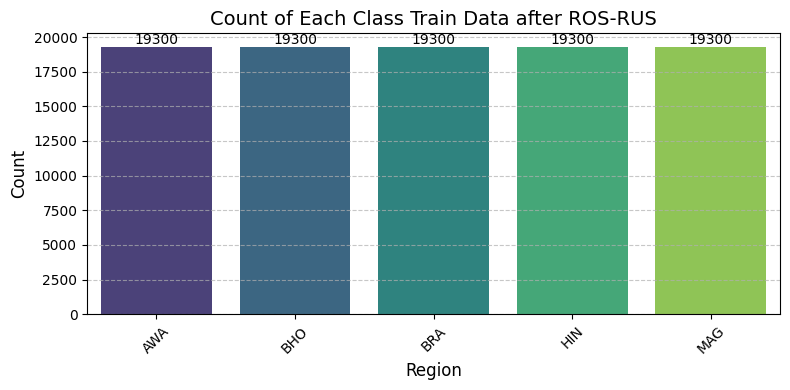

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ROS-RUS")

## Multinomial NB- 85.95%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8594953667522608
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.83      0.79      2465
           1       0.89      0.84      0.86      3753
           2       0.87      0.83      0.85      3902
           3       0.84      0.88      0.86      3854
           4       0.91      0.91      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8594953667522608
Precision: 0.8617
Recall for : 0.8595
F1 Score:  0.8600
AUC Score: 0.9794
Balanced Accuracy: 0.8572
G-mean Score: 0.9111
pf Score: 0.0350
Bal Score :  0.8976190512144017


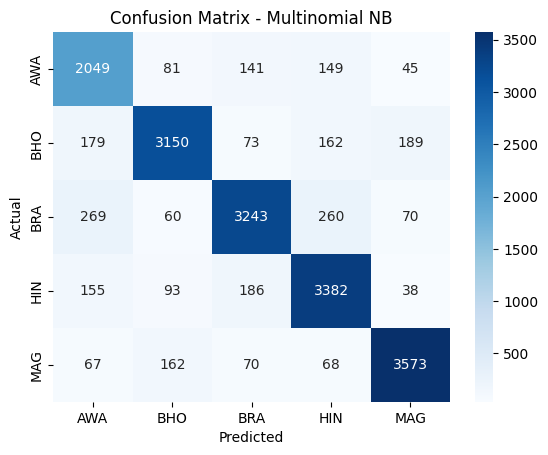

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -79.15%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7915038517360723
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.72      0.69      2465
           1       0.85      0.79      0.82      3753
           2       0.78      0.76      0.77      3902
           3       0.76      0.81      0.78      3854
           4       0.87      0.85      0.86      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.79      0.79     17914
weighted avg       0.79      0.79      0.79     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 285.14 seconds
Accuracy: 0.7915038517360723
Precision: 0.7950
Recall for : 0.7915
F1 Score:  0.7926
AUC Score: 0.9544
Balanced Accuracy: 0.7865
G-mean Score: 0.8665
pf Score: 0.0520
Bal Score :  0.8480562909334769


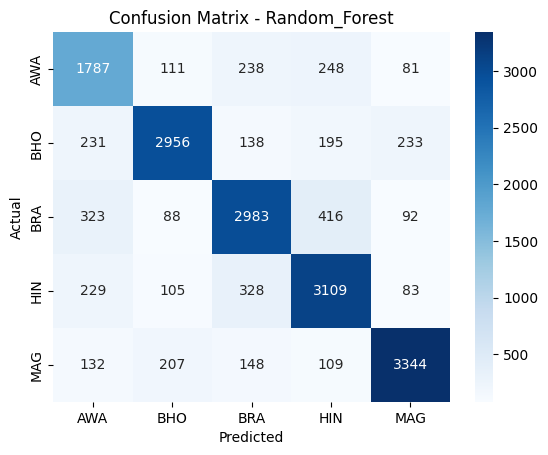

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 78.84%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7884336273305794
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.76      0.69      2465
           1       0.88      0.76      0.81      3753
           2       0.70      0.80      0.75      3902
           3       0.81      0.79      0.80      3854
           4       0.92      0.82      0.87      3940

    accuracy                           0.79     17914
   macro avg       0.79      0.79      0.78     17914
weighted avg       0.80      0.79      0.79     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 161.01 seconds
Accuracy: 0.7884336273305794
Precision: 0.8011
Recall for : 0.7884
F1 Score:  0.7917
AUC Score: 0.9595
Balanced Accuracy: 0.7862
G-mean Score: 0.8648
pf Score: 0.0526
Bal Score :  0.8458469865854527


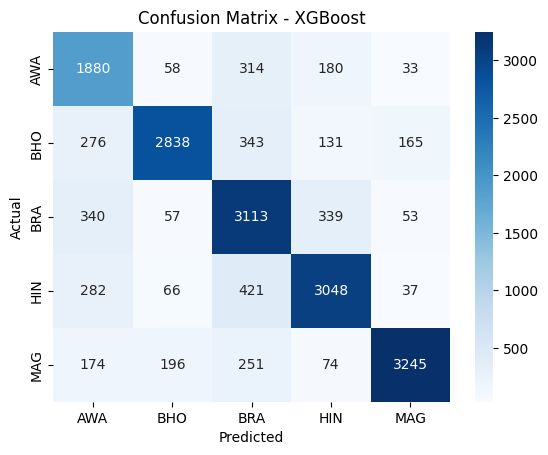

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 69.88%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6988388969521045
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.61      0.57      2465
           1       0.75      0.73      0.74      3753
           2       0.68      0.66      0.67      3902
           3       0.67      0.68      0.68      3854
           4       0.81      0.78      0.79      3940

    accuracy                           0.70     17914
   macro avg       0.69      0.69      0.69     17914
weighted avg       0.70      0.70      0.70     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 38.82 seconds
Accuracy: 0.6988388969521045
Precision: 0.7030
Recall for : 0.6988
F1 Score:  0.7005
AUC Score: 0.8159
Balanced Accuracy: 0.6921
G-mean Score: 0.8042
pf Score: 0.0751
Bal Score :  0.7805209538353785


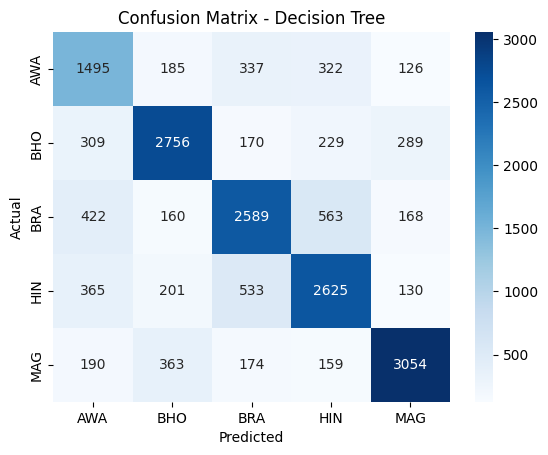

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 18.54%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.1854415540917718
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.86      0.25      2465
           1       0.28      0.21      0.24      3753
           2       0.68      0.06      0.11      3902
           3       0.64      0.01      0.02      3854
           4       0.86      0.03      0.06      3940

    accuracy                           0.19     17914
   macro avg       0.52      0.24      0.14     17914
weighted avg       0.55      0.19      0.13     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.1854415540917718
Precision: 0.5530
Recall for : 0.1854
F1 Score:  0.1271
AUC Score: 0.6095
Balanced Accuracy: 0.2352
G-mean Score: 0.3986
pf Score: 0.1916
Bal Score :  0.4083085752635084


## LightGBM Model -81.91%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 6.523332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201464
[LightGBM] [Info] Number of data points in the train set: 96500, number of used features: 4786
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8190800491235904
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.80      0.73      2465
           1       0.88      0.80      0.84      3753
           2       0.77      0.81      0.79      3902
           3       0.82      0.83      0.82      3854
           4       0.92      0.85      0.88      3940

    accuracy                           0.82     17914
   macro avg       0.82      0.82      0.81     17914
weighted avg       0.83      0.82      0.82     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 99.01 seconds
Accuracy: 0.8190800491235904
Precision: 0.8256
Recall for : 0.8191
F1 Score:  0.8209
AUC Score: 0.9696
Balanced Accuracy: 0.8171
G-mean Score: 0.8849
pf Score: 0.0450
Bal Score :  0.8681784987490085


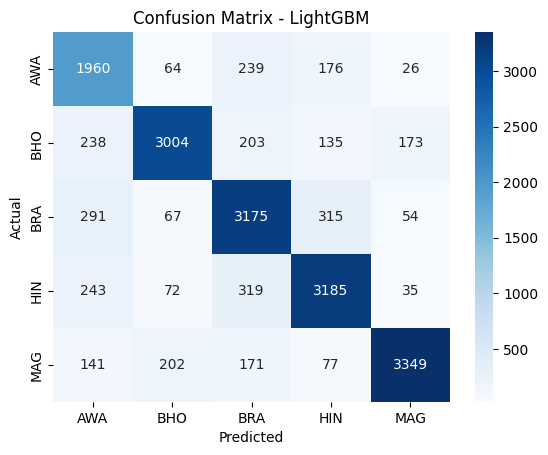

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 85.96%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8595511890141788
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.82      0.79      2465
           1       0.89      0.86      0.87      3753
           2       0.84      0.85      0.84      3902
           3       0.85      0.87      0.86      3854
           4       0.93      0.89      0.91      3940

    accuracy                           0.86     17914
   macro avg       0.85      0.86      0.85     17914
weighted avg       0.86      0.86      0.86     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 9.42 seconds
Accuracy: 0.8595511890141788
Precision: 0.8617
Recall for : 0.8596
F1 Score:  0.8603
AUC Score: 0.9785
Balanced Accuracy: 0.8564
G-mean Score: 0.9110
pf Score: 0.0350
Bal Score :  0.8976562854880065


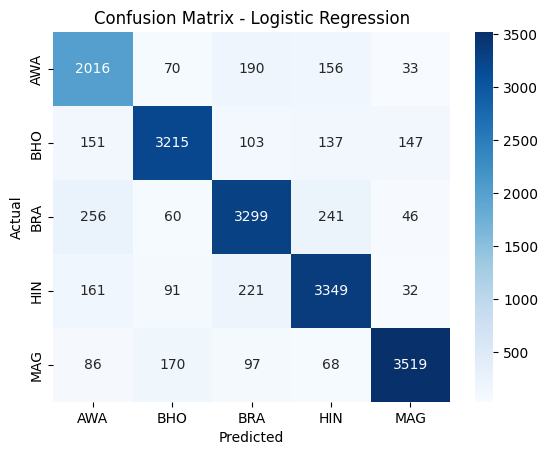

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 85.26%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8526292285363403
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.88      0.76      2465
           1       0.93      0.79      0.86      3753
           2       0.86      0.84      0.85      3902
           3       0.90      0.83      0.87      3854
           4       0.89      0.92      0.90      3940

    accuracy                           0.85     17914
   macro avg       0.85      0.85      0.85     17914
weighted avg       0.86      0.85      0.85     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.04 seconds
Accuracy: 0.8526292285363403
Precision: 0.8631
Recall for : 0.8526
F1 Score:  0.8545
AUC Score: 0.9806
Balanced Accuracy: 0.8538
G-mean Score: 0.9076
pf Score: 0.0363
Bal Score :  0.8926867774031326


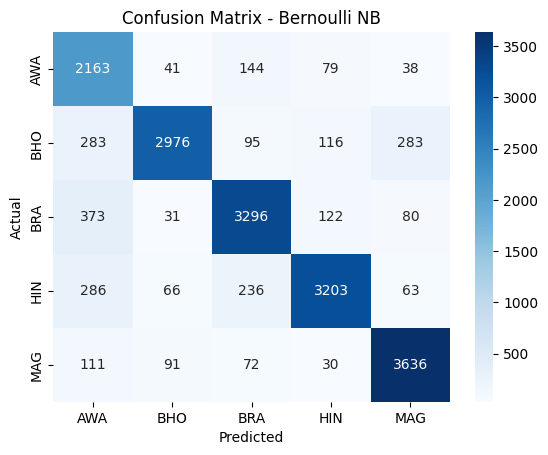

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

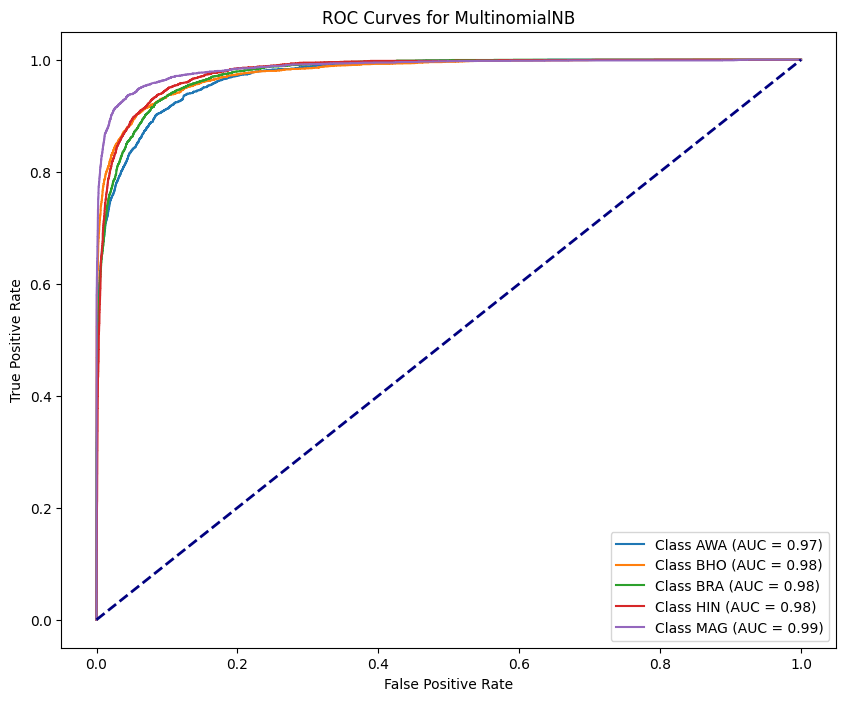

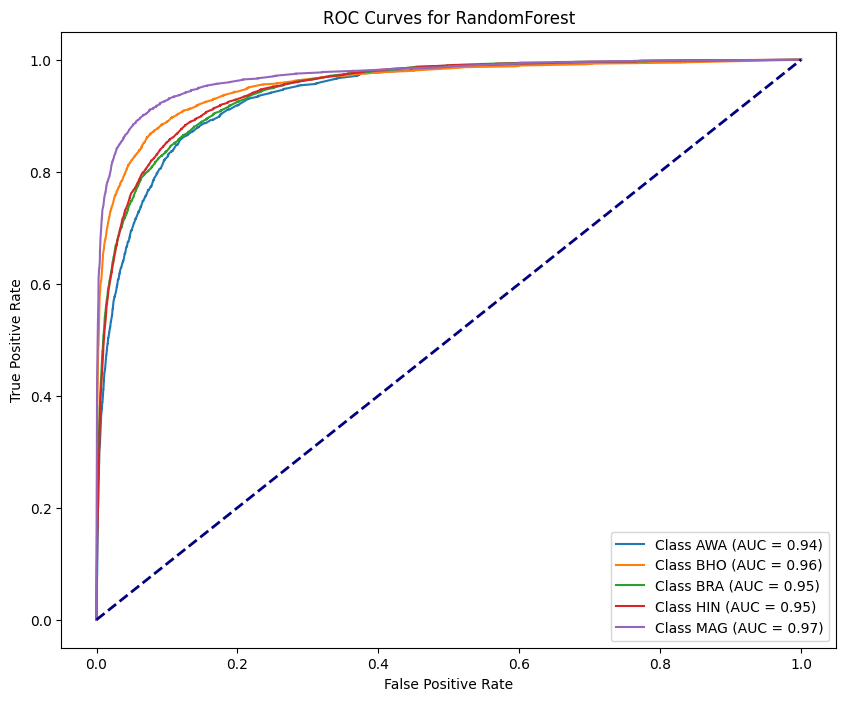

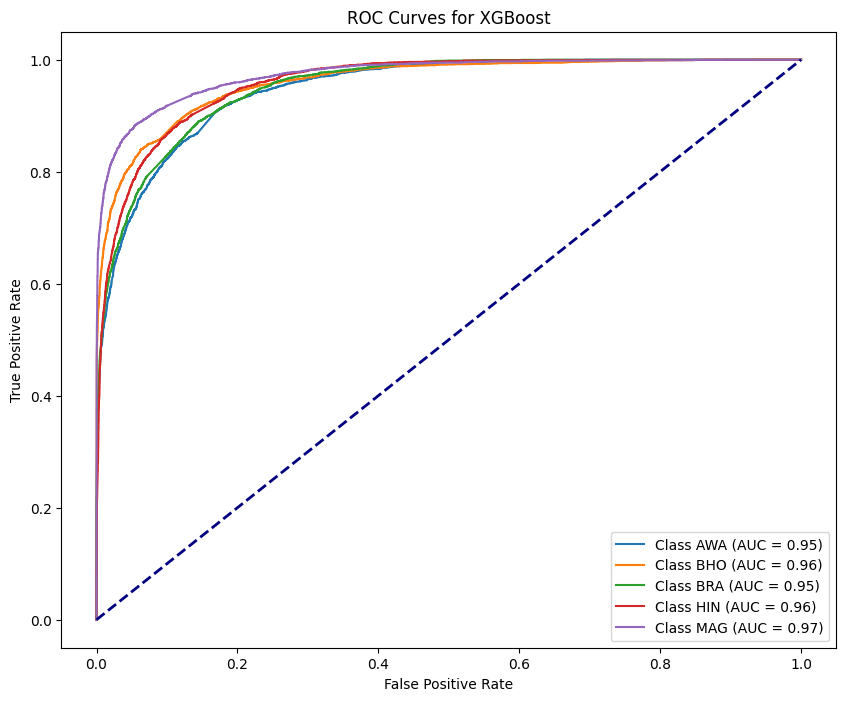

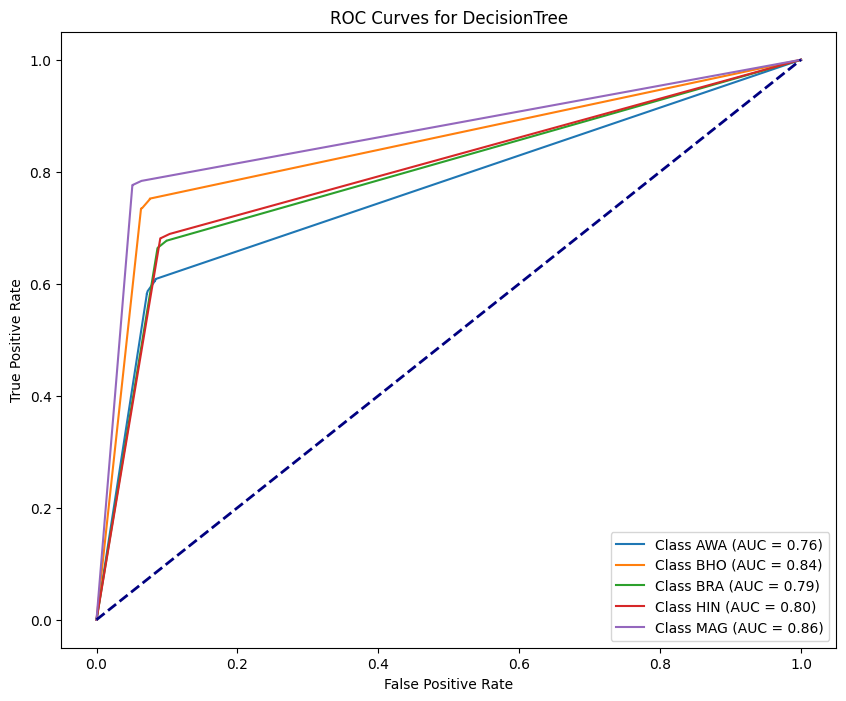

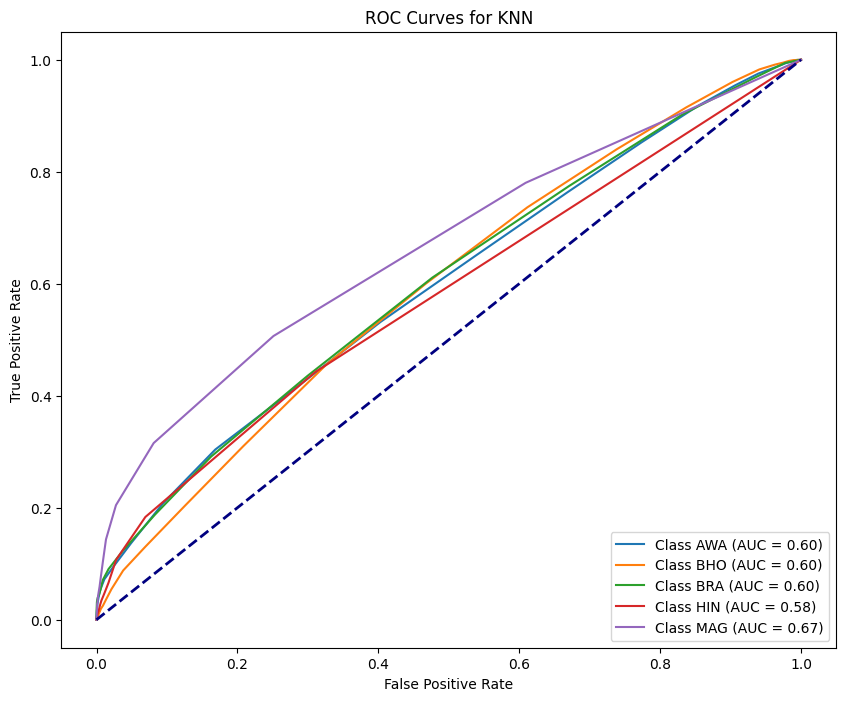

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


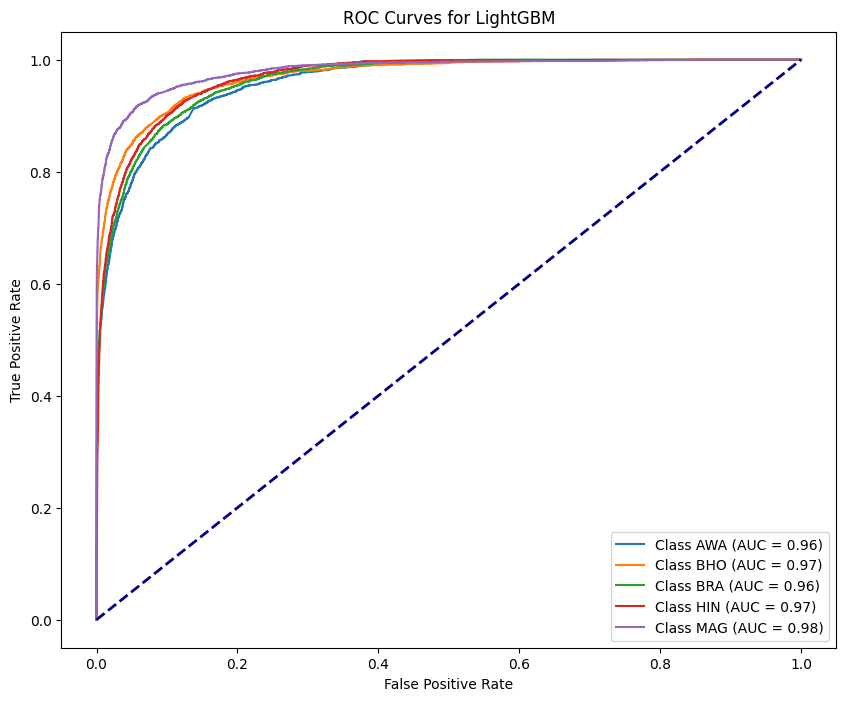

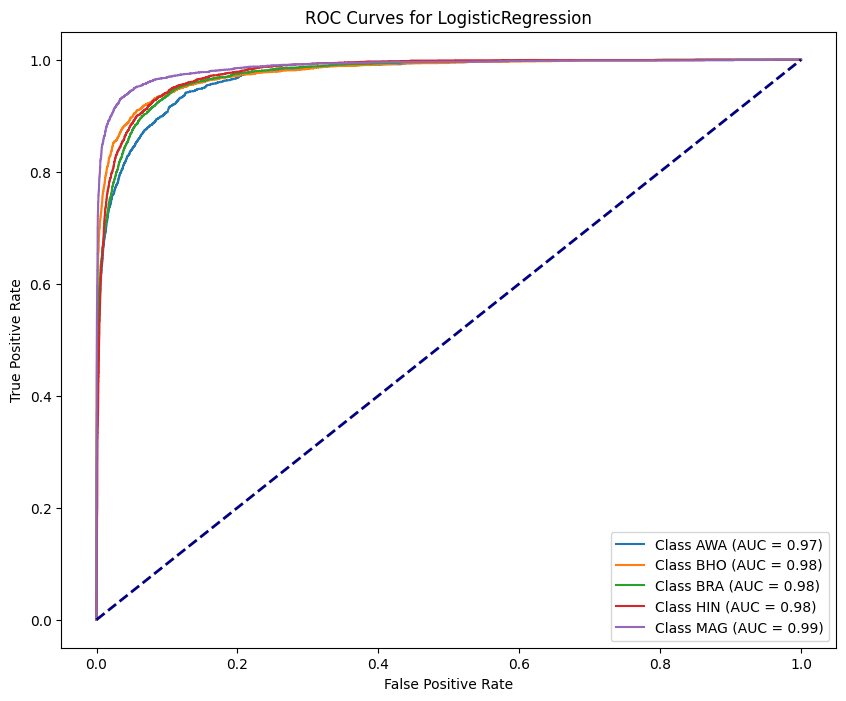

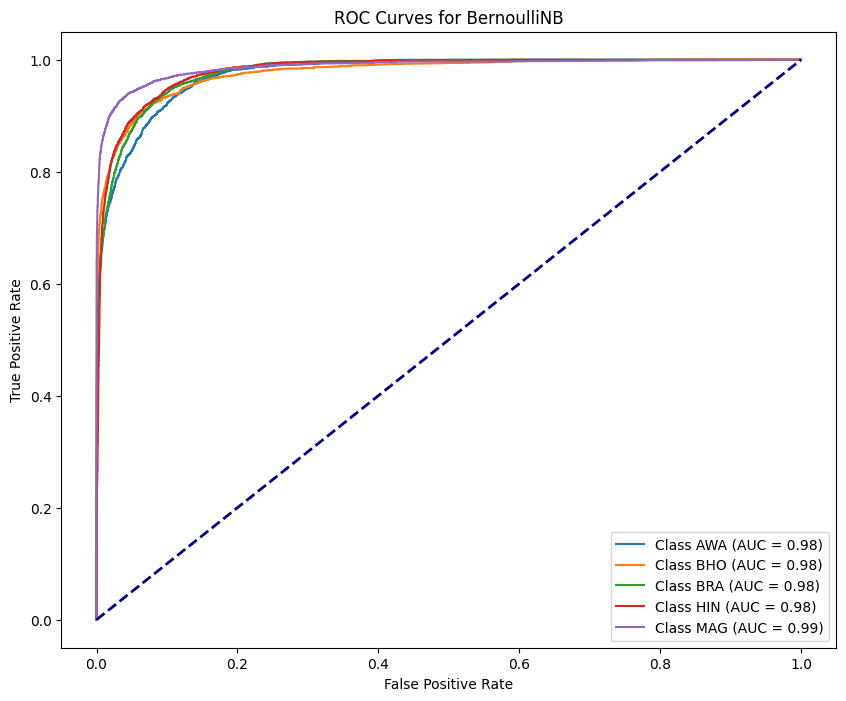

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


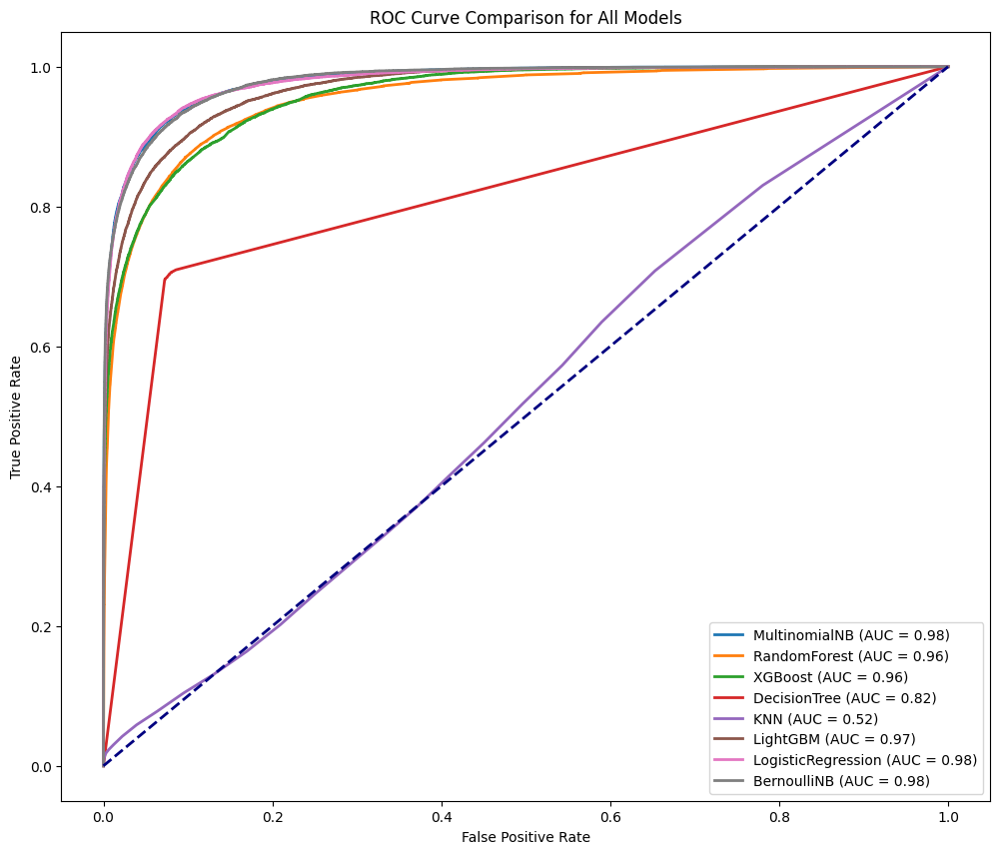

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **SMOTEENN**

In [ ]:
from imblearn.combine import SMOTEENN

In [ ]:
smote_enn = SMOTEENN(random_state=42)
X_train, y_train = smote_enn.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'AWA',
    1: 'BHO',
    2: 'BRA',
    3: 'HIN',
    4: 'MAG'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-465-7ae35085e4d1>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-465-7ae35085e4d1>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


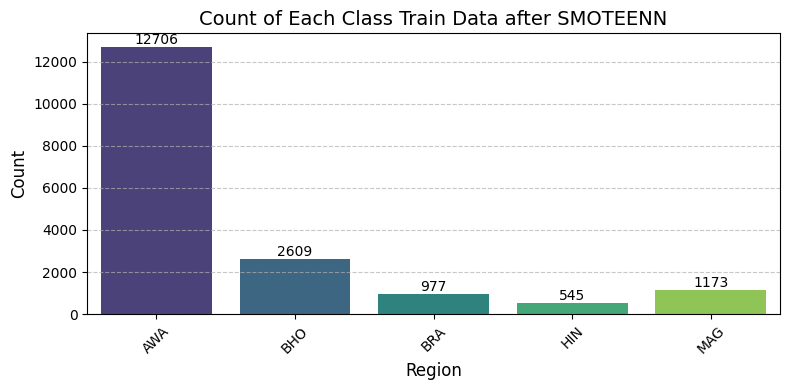

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTEENN")

## Multinomial NB- 41.87%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.41872278664731494
Classification Report:
               precision    recall  f1-score   support

           0       0.20      1.00      0.34      2465
           1       0.78      0.66      0.71      3753
           2       0.93      0.13      0.23      3902
           3       0.97      0.04      0.08      3854
           4       0.99      0.48      0.65      3940

    accuracy                           0.42     17914
   macro avg       0.78      0.46      0.40     17914
weighted avg       0.82      0.42      0.40     17914



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.41872278664731494
Precision: 0.8209
Recall for : 0.4187
F1 Score:  0.4050
AUC Score: 0.8716
Balanced Accuracy: 0.4621
G-mean Score: 0.6148
pf Score: 0.1357
Bal Score :  0.5779181506121704


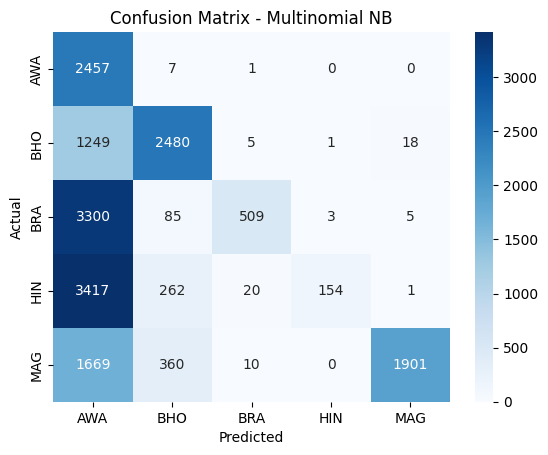

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -50.57%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5057496929775595
Classification Report:
               precision    recall  f1-score   support

           0       0.23      0.98      0.38      2465
           1       0.83      0.67      0.74      3753
           2       0.85      0.22      0.34      3902
           3       0.91      0.18      0.30      3854
           4       0.92      0.66      0.77      3940

    accuracy                           0.51     17914
   macro avg       0.75      0.54      0.51     17914
weighted avg       0.79      0.51      0.52     17914



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 24.84 seconds
Accuracy: 0.5057496929775595
Precision: 0.7905
Recall for : 0.5057
F1 Score:  0.5158
AUC Score: 0.8851
Balanced Accuracy: 0.5406
G-mean Score: 0.6803
pf Score: 0.1158
Bal Score :  0.6410455957925574


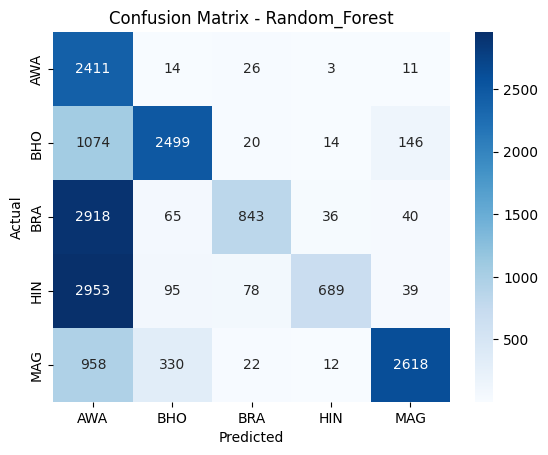

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 49.67%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.49665066428491683
Classification Report:
               precision    recall  f1-score   support

           0       0.22      0.99      0.37      2465
           1       0.87      0.61      0.72      3753
           2       0.92      0.21      0.34      3902
           3       0.93      0.24      0.38      3854
           4       0.95      0.62      0.75      3940

    accuracy                           0.50     17914
   macro avg       0.78      0.53      0.51     17914
weighted avg       0.82      0.50      0.52     17914



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 35.94 seconds
Accuracy: 0.49665066428491683
Precision: 0.8228
Recall for : 0.4967
F1 Score:  0.5208
AUC Score: 0.8900
Balanced Accuracy: 0.5330
G-mean Score: 0.6745
pf Score: 0.1175
Bal Score :  0.6345130984975427


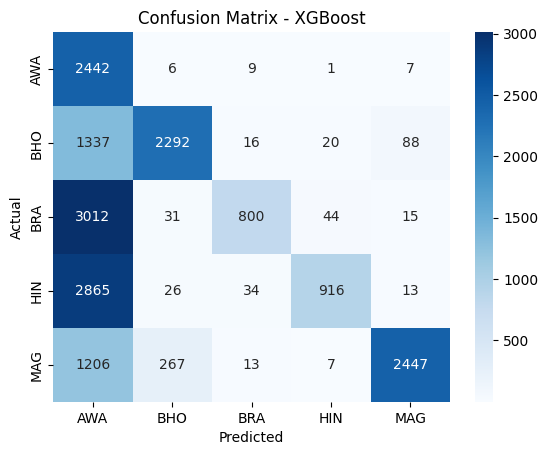

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 54.33%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.543318075248409
Classification Report:
               precision    recall  f1-score   support

           0       0.26      0.95      0.41      2465
           1       0.73      0.68      0.71      3753
           2       0.85      0.27      0.41      3902
           3       0.85      0.32      0.46      3854
           4       0.89      0.65      0.75      3940

    accuracy                           0.54     17914
   macro avg       0.72      0.57      0.55     17914
weighted avg       0.75      0.54      0.56     17914



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 7.50 seconds
Accuracy: 0.543318075248409
Precision: 0.7526
Recall for : 0.5433
F1 Score:  0.5589
AUC Score: 0.7301
Balanced Accuracy: 0.5734
G-mean Score: 0.7058
pf Score: 0.1080
Bal Score :  0.6681738822718948


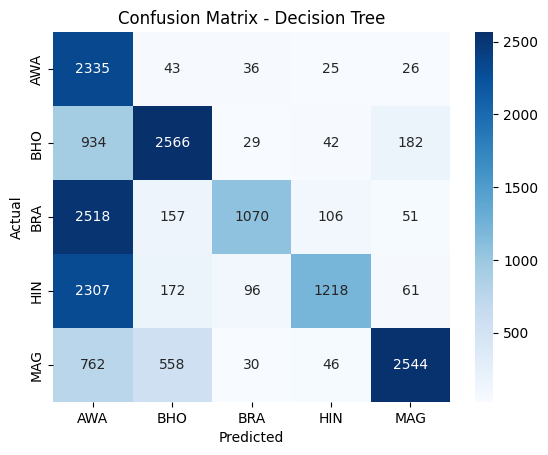

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 14.33%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.14329574634364184
Classification Report:
               precision    recall  f1-score   support

           0       0.14      1.00      0.24      2465
           1       0.95      0.01      0.01      3753
           2       0.97      0.02      0.03      3902
           3       1.00      0.00      0.00      3854
           4       1.00      0.00      0.01      3940

    accuracy                           0.14     17914
   macro avg       0.81      0.21      0.06     17914
weighted avg       0.86      0.14      0.04     17914



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.14329574634364184
Precision: 0.8647
Recall for : 0.1433
F1 Score:  0.0447
AUC Score: 0.5764
Balanced Accuracy: 0.2053
G-mean Score: 0.3517
pf Score: 0.1987
Bal Score :  0.37814099051070016


## LightGBM Model -54.37%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42505
[LightGBM] [Info] Number of data points in the train set: 18010, number of used features: 1261
[LightGBM] [Info] Start training from score -0.348853
[LightGBM] [Info] Start training from score -1.931960
[LightGBM] [Info] Start training from score -2.914196
[LightGBM] [Info] Start training from score -3.497897
[LightGBM] [Info] Start training from score -2.731363


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.5436530088199174
Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.97      0.40      2465
           1       0.83      0.68      0.75      3753
           2       0.85      0.28      0.42      3902
           3       0.87      0.30      0.44      3854
           4       0.92      0.65      0.76      3940

    accuracy                           0.54     17914
   macro avg       0.74      0.58      0.56     17914
weighted avg       0.78      0.54      0.57     17914



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 12.61 seconds
Accuracy: 0.5436530088199174
Precision: 0.7834
Recall for : 0.5437
F1 Score:  0.5668
AUC Score: 0.9019
Balanced Accuracy: 0.5751
G-mean Score: 0.7073
pf Score: 0.1072
Bal Score :  0.6685278360317594


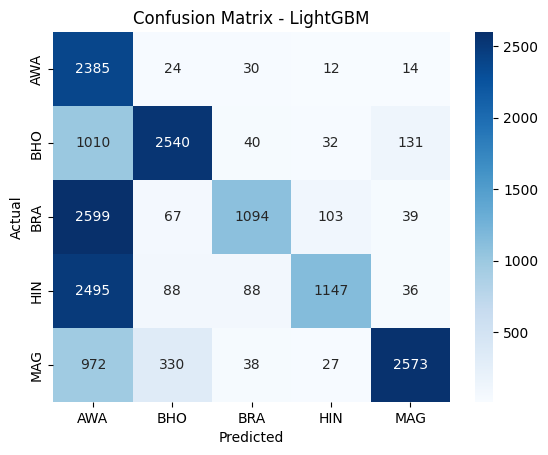

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 45.58%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.45584459082282014
Classification Report:
               precision    recall  f1-score   support

           0       0.21      0.99      0.35      2465
           1       0.87      0.62      0.72      3753
           2       0.92      0.18      0.31      3902
           3       0.96      0.14      0.25      3854
           4       0.97      0.54      0.70      3940

    accuracy                           0.46     17914
   macro avg       0.79      0.50      0.46     17914
weighted avg       0.83      0.46      0.47     17914



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.45 seconds
Accuracy: 0.45584459082282014
Precision: 0.8331
Recall for : 0.4558
F1 Score:  0.4721
AUC Score: 0.9019
Balanced Accuracy: 0.4957
G-mean Score: 0.6441
pf Score: 0.1268
Bal Score :  0.6049174123439508


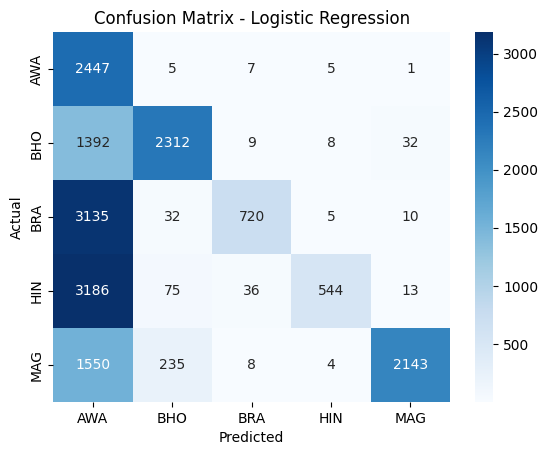

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 62.27%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.6226973316958803
Classification Report:
               precision    recall  f1-score   support

           0       0.31      0.99      0.47      2465
           1       0.87      0.70      0.77      3753
           2       0.81      0.42      0.55      3902
           3       0.91      0.34      0.50      3854
           4       0.89      0.80      0.84      3940

    accuracy                           0.62     17914
   macro avg       0.76      0.65      0.63     17914
weighted avg       0.79      0.62      0.64     17914



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.6226973316958803
Precision: 0.7918
Recall for : 0.6227
F1 Score:  0.6394
AUC Score: 0.9249
Balanced Accuracy: 0.6492
G-mean Score: 0.7616
pf Score: 0.0892
Bal Score :  0.7258567958611919


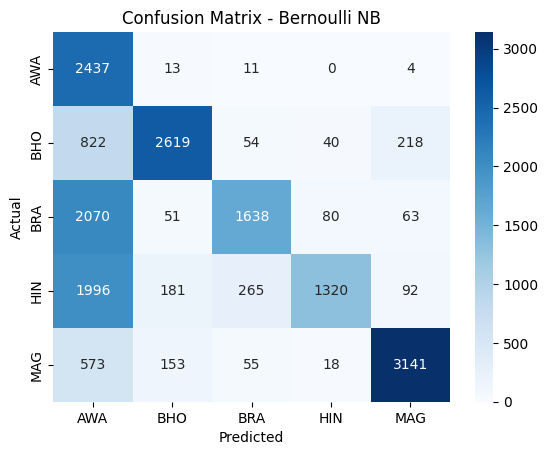

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

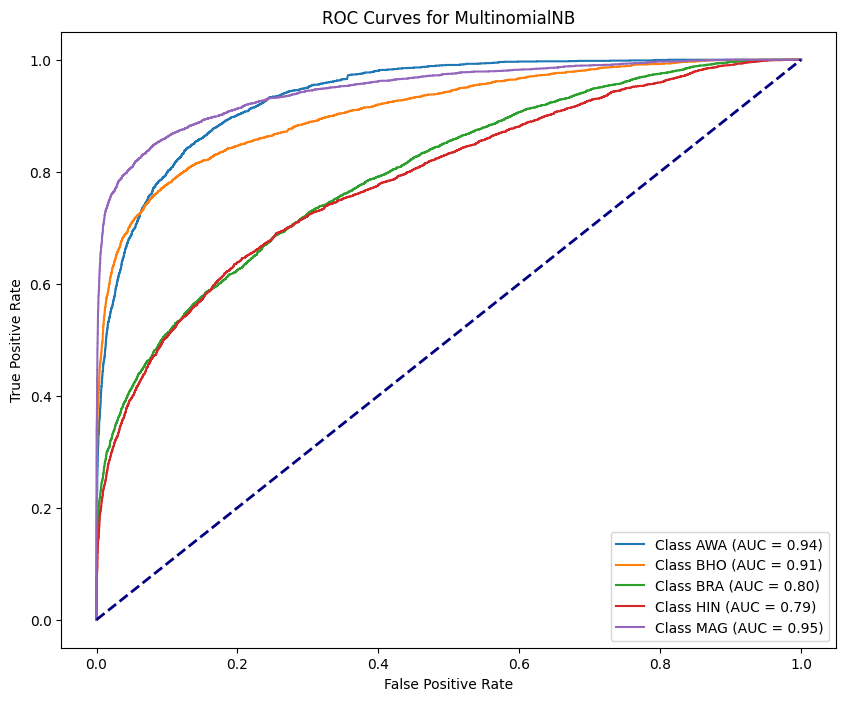

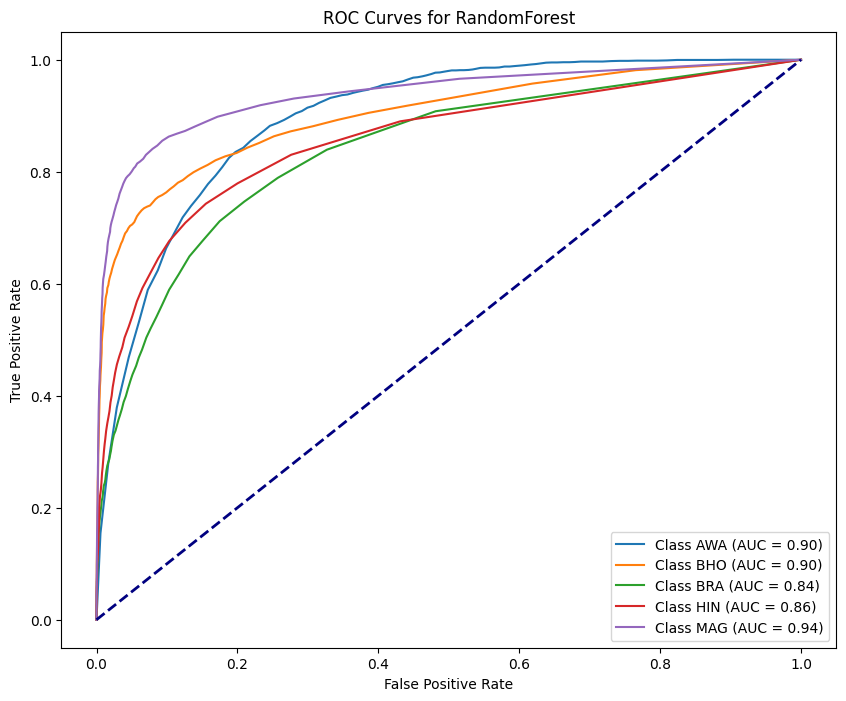

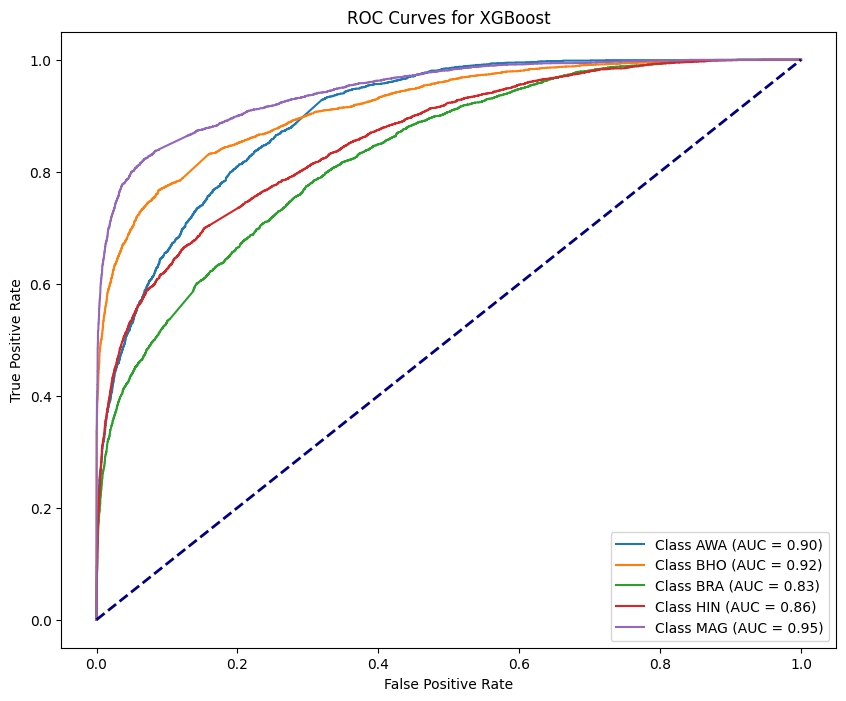

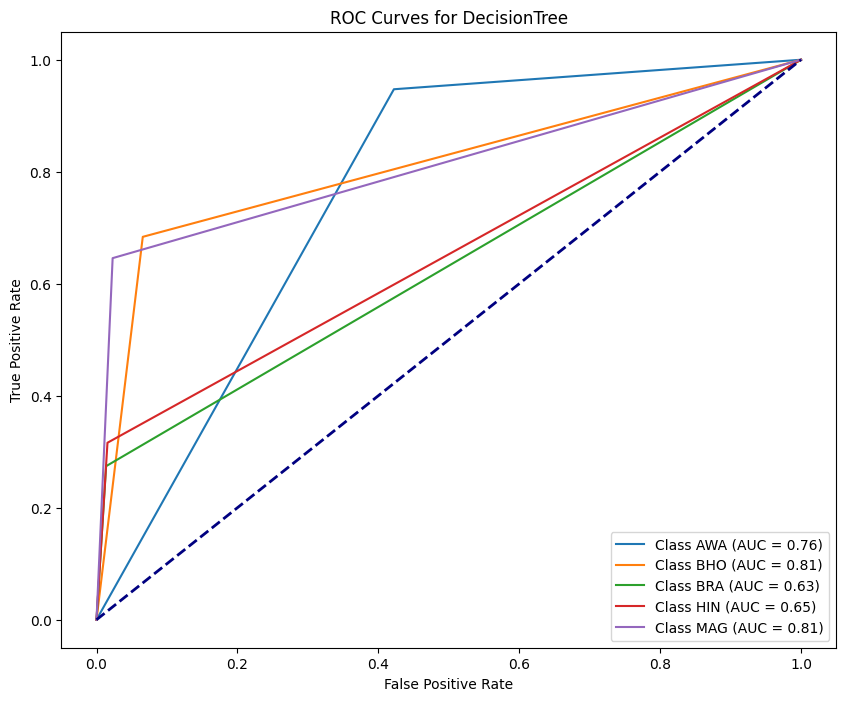

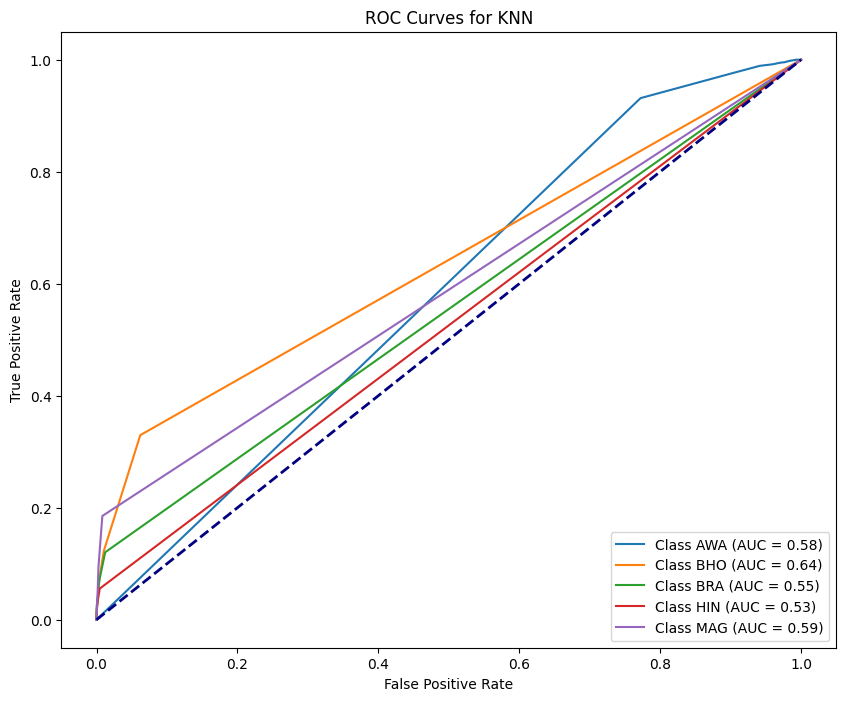

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


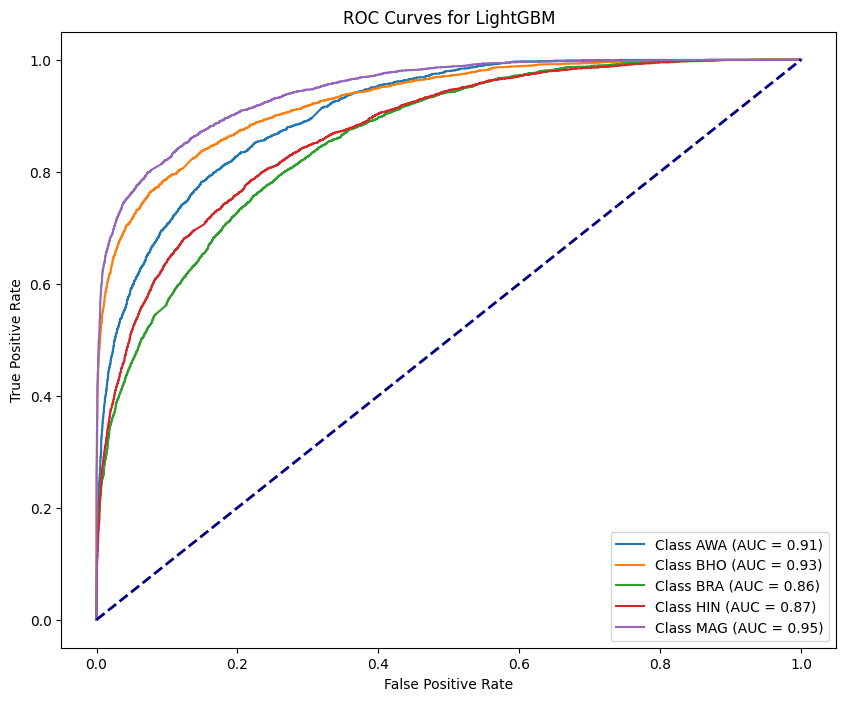

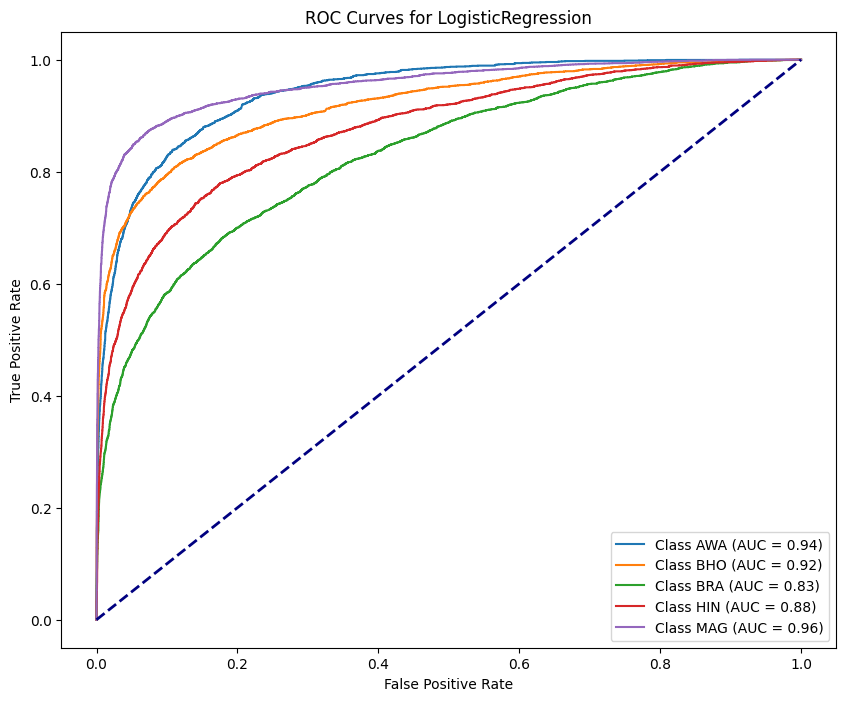

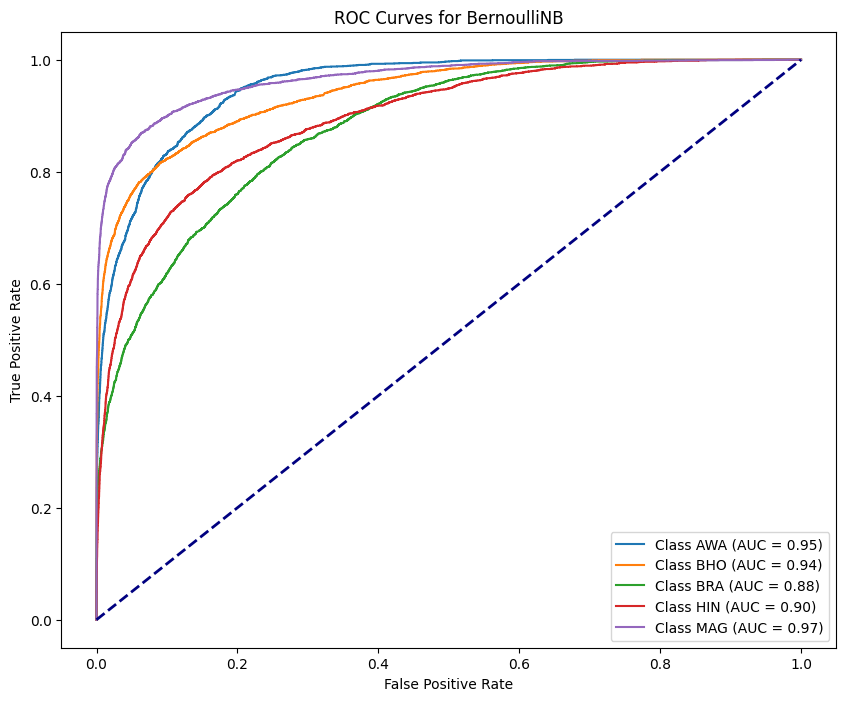

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


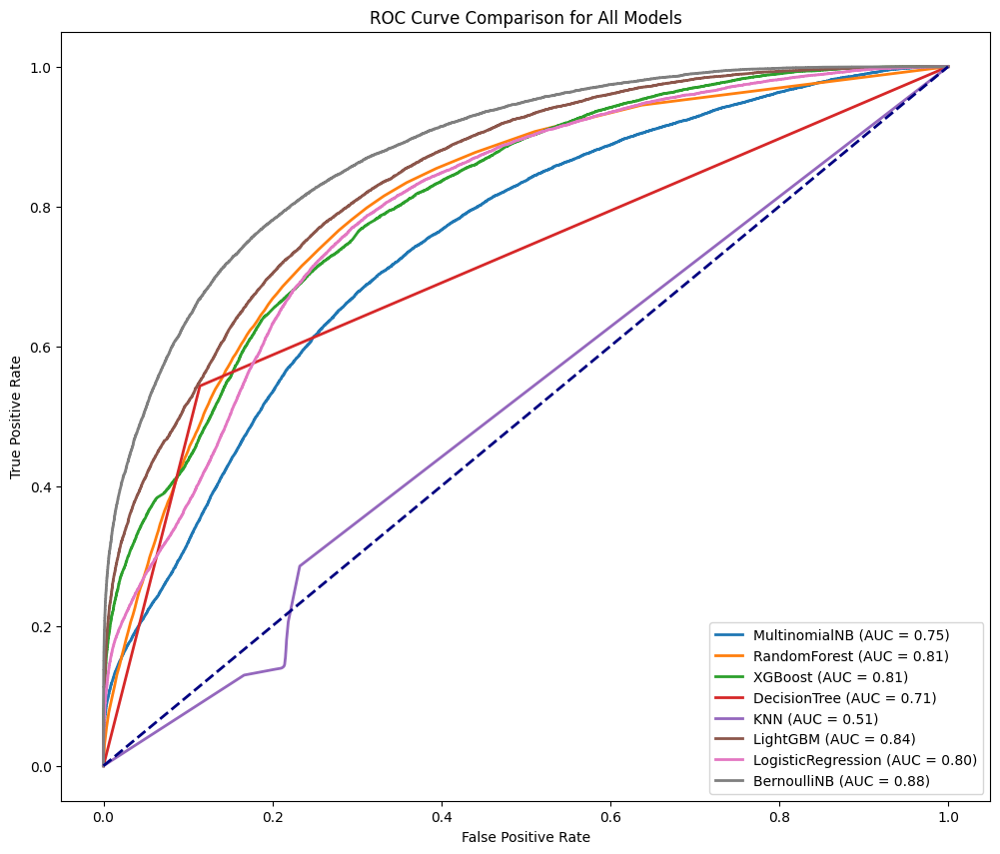

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()